## Import des libraries

In [1]:
import numpy as np
import pandas as pd
import gc
import time
from contextlib import contextmanager
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings('ignore', category=DataConversionWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
from P7_functions import dataset_overview
from P7_functions import NaN_overview
from P7_functions import feature_distribution
from Preprocess_Dataframe_V2 import downcast_numerical_column_V2
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
from IPython.display import display, HTML
plt.style.use('seaborn')

warnings.simplefilter(category=FutureWarning, action='ignore')
warnings.simplefilter(category=UserWarning, action='ignore')

# pour gérer l'affichage des dataframes pandas
pd.options.display.max_rows = 100
pd.options.display.max_columns = 200
pd.set_option("colheader_justify", "left")

# pour gérer l'affichage des arrays numpy
# 230 sur config bureau, 165 sur config portable
np.set_printoptions(linewidth=165)

# pour afficher les gros fichiers sur toute la largeur de l'écran
HTML("<style>.container { width:95% }</style>")

# 1. Ouverture du jeu de données avec NaN déjà traités et encodages réalisés

On conserve la notation df pour simplifier la lecture du Notebook. Attention, le fichier source est <b>df_valid_NaN_proofed_Encoded.csv</b>!

In [3]:
df = pd.read_csv('df_all_Encoded_and_NaN_proofed.csv', compression = 'gzip')

In [4]:
df.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307492 entries, 0 to 307491
Columns: 195 entries, Unnamed: 0 to index
dtypes: float64(138), int64(57)
memory usage: 457.5 MB


In [5]:
df.drop('Unnamed: 0', axis=1, inplace = True)

In [6]:
pd.set_option('display.max_columns', None)
df.head()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

Le Kernel Kaggle fourni a encodé toutes les variables catégorielles en variables numériques.

In [8]:
pd.set_option('display.max_columns', None)
df.describe()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

# 2. Traitement des outliers

On vérifie chacune des features en traçant les boxplots ce qui permettra d'identifier les outliers.<br>
Les outliers seront supprimés du jeu de données.<br>

## 2.1. AMT_REQ_CREDIT_BUREAU_QRT

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  2.0


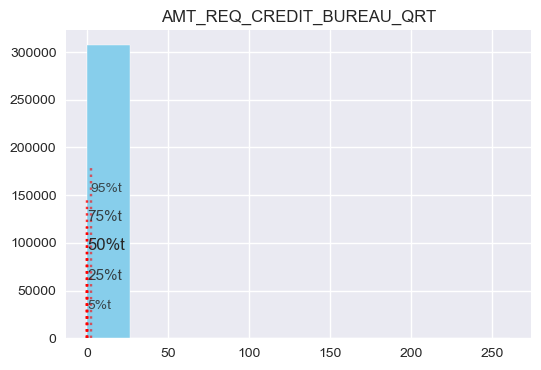

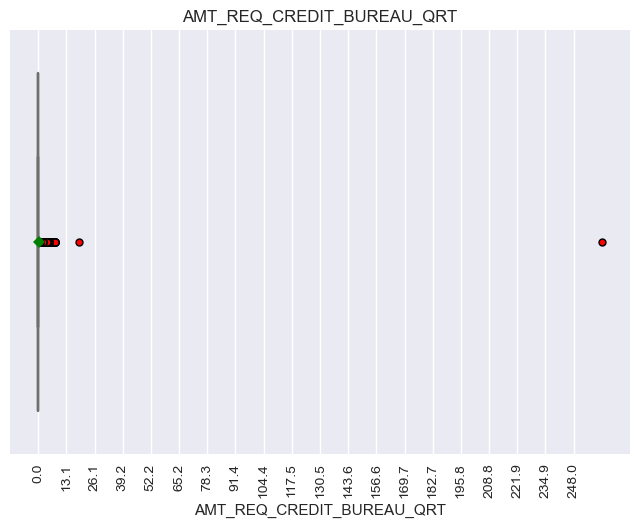

In [9]:
feature_distribution(df, 'AMT_REQ_CREDIT_BUREAU_QRT')

On localise l'outlier :

In [10]:
df.loc[df['AMT_REQ_CREDIT_BUREAU_QRT'] > 230]

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

In [11]:
df.at[239470, 'AMT_REQ_CREDIT_BUREAU_QRT']

0.0

On remplace la valeur par la médiane :

In [12]:
df.at[239470, 'AMT_REQ_CREDIT_BUREAU_QRT'] = df['AMT_REQ_CREDIT_BUREAU_QRT'].median()

## 2.2. CNT_CHILDREN

moy:      0.4
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  1.0
95%tile:  2.0


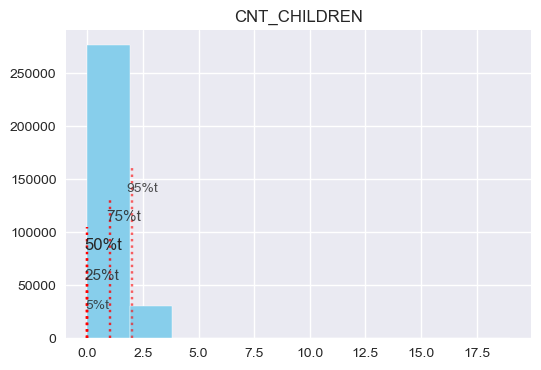

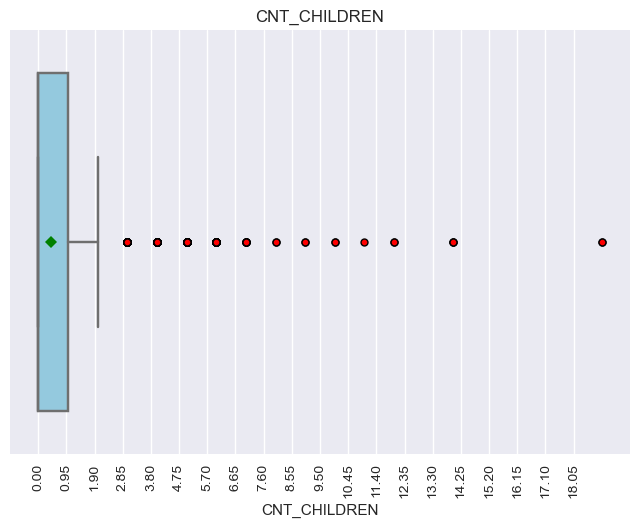

In [13]:
feature_distribution(df, 'CNT_CHILDREN')

On considère que les nombres d'enfants strictement supérieur à 12 sont des outliers donc on les retire.

In [14]:
df.loc[df['CNT_CHILDREN'] > 12]

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307492 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 455.1 MB


In [16]:
df.drop(df.index[df['CNT_CHILDREN'] > 12], inplace=True)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307487 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.5 MB


## 2.3. DEF_30_CNT_SOCIAL_CIRCLE

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


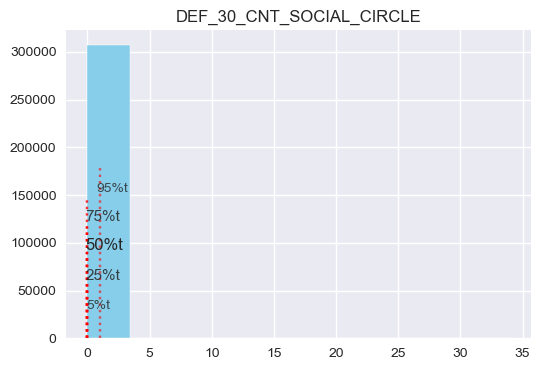

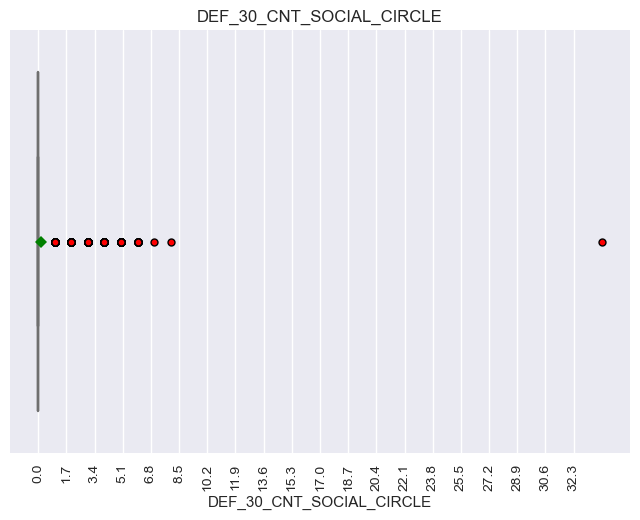

In [18]:
feature_distribution(df, 'DEF_30_CNT_SOCIAL_CIRCLE')

In [19]:
df.loc[df['DEF_30_CNT_SOCIAL_CIRCLE'] > 30]

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

On considère que DEF_30_CNT_SOCIAL_CIRCLE supérieur à 30 est un outlier donc on le retire.

In [20]:
df.drop(df.index[df['DEF_30_CNT_SOCIAL_CIRCLE'] > 30], inplace=True)

## 2.4. OBS_30_CNT_SOCIAL_CIRCLE

moy:      1.4
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  2.0
95%tile:  6.0


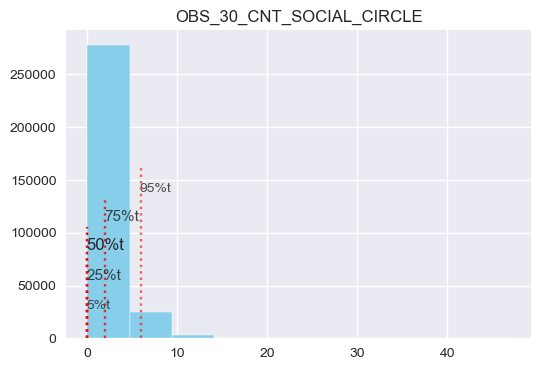

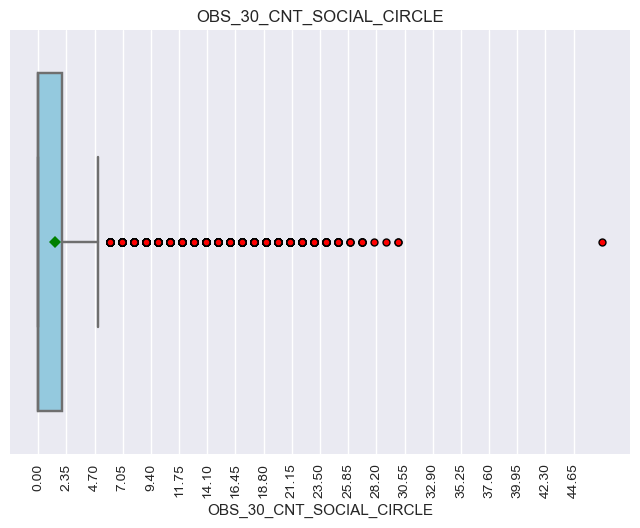

In [21]:
feature_distribution(df, 'OBS_30_CNT_SOCIAL_CIRCLE')

In [22]:
df.loc[df['OBS_30_CNT_SOCIAL_CIRCLE'] > 30]

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

On considère que OBS_30_CNT_SOCIAL_CIRCLE supérieur à 30 est un outlier donc on le retire.

In [23]:
df.drop(df.index[df['OBS_30_CNT_SOCIAL_CIRCLE'] > 30], inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307485 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.5 MB


## 2.5. Visualisation systématique de toutes les features avec des boxplots pour identifier les outliers

moy:      27108.2
5%tile:   9000.0
25%tile:  16524.0
50%tile:  24903.0
75%tile:  34596.0
95%tile:  53325.0


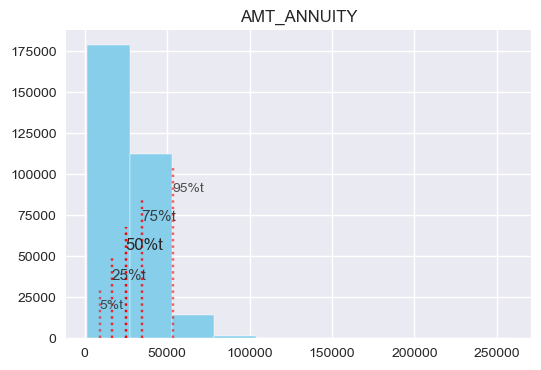

moy:      599024.8
5%tile:   135000.0
25%tile:  270000.0
50%tile:  513531.0
75%tile:  808650.0
95%tile:  1350000.0


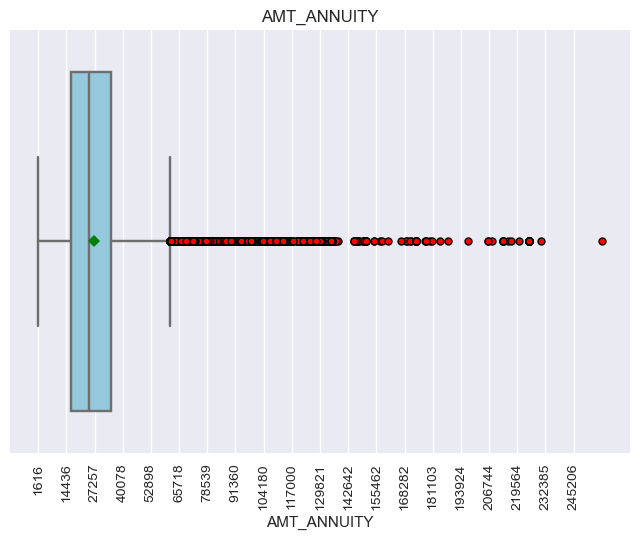

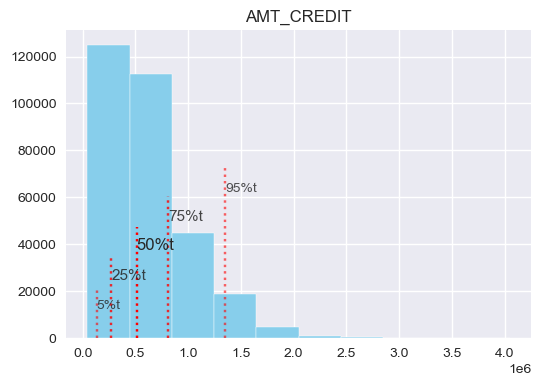

moy:      538314.6
5%tile:   135000.0
25%tile:  238500.0
50%tile:  450000.0
75%tile:  679500.0
95%tile:  1305000.0


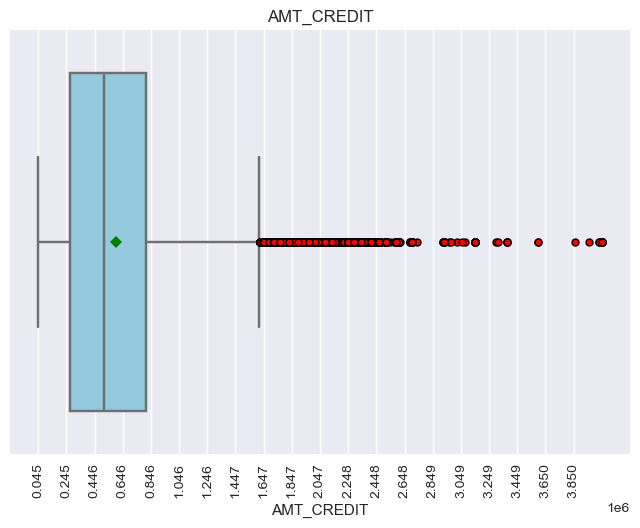

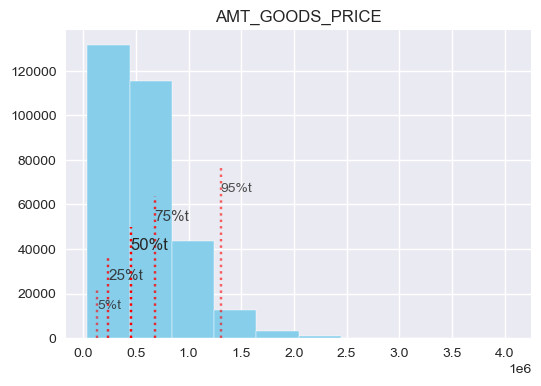

moy:      168799.2
5%tile:   67500.0
25%tile:  112500.0
50%tile:  147150.0
75%tile:  202500.0
95%tile:  337500.0


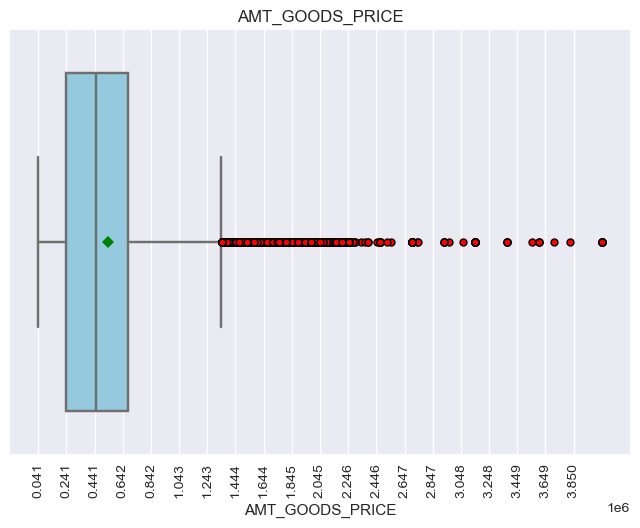

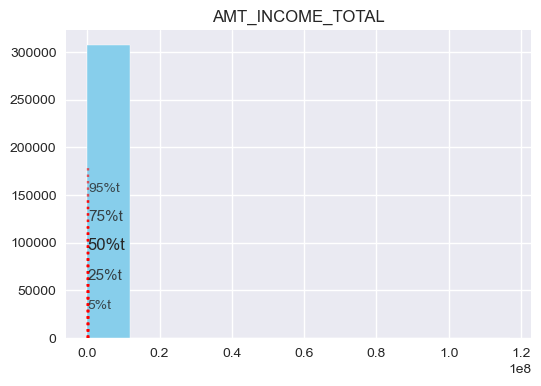

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


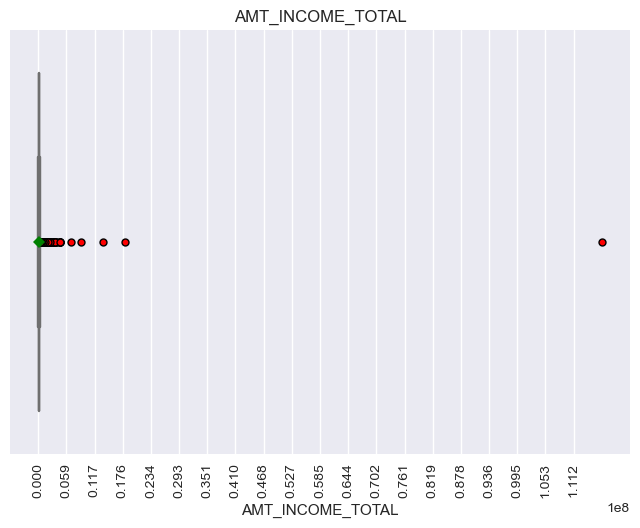

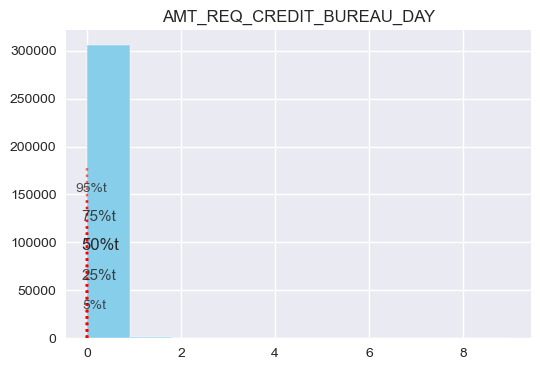

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


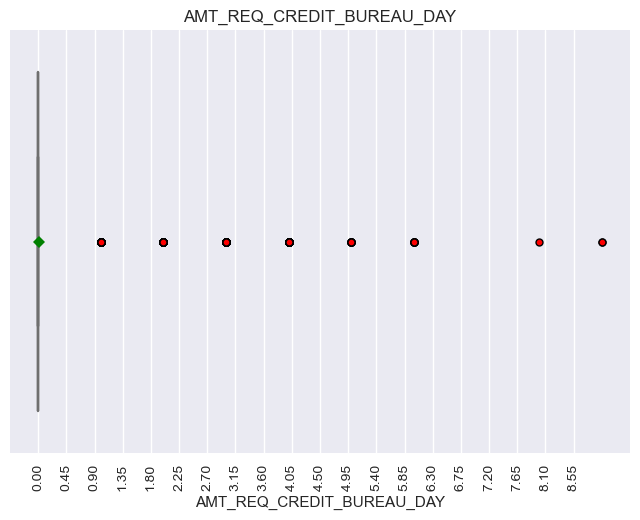

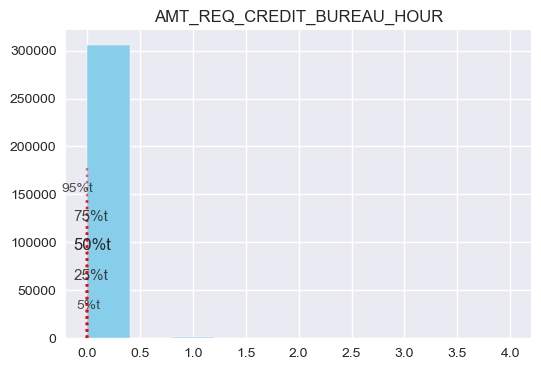

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


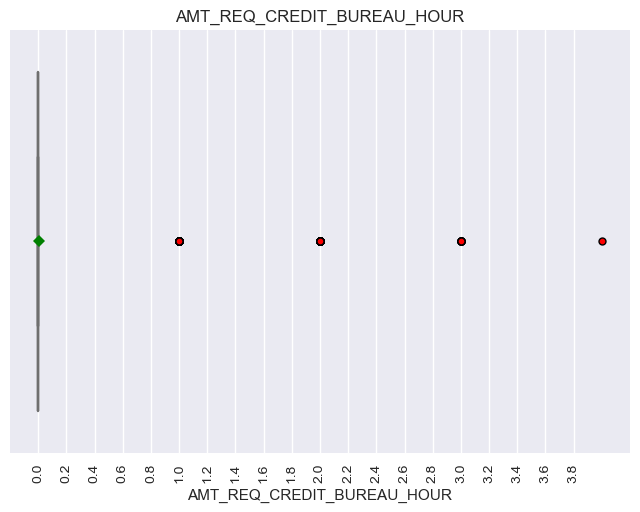

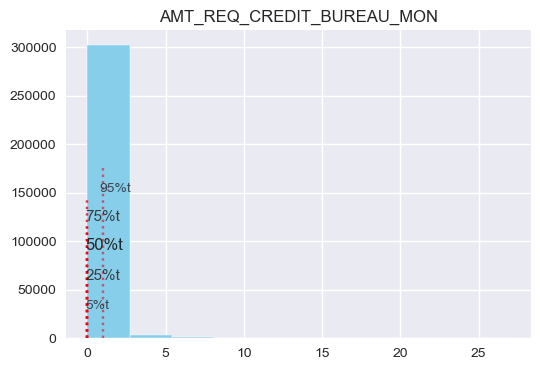

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  2.0


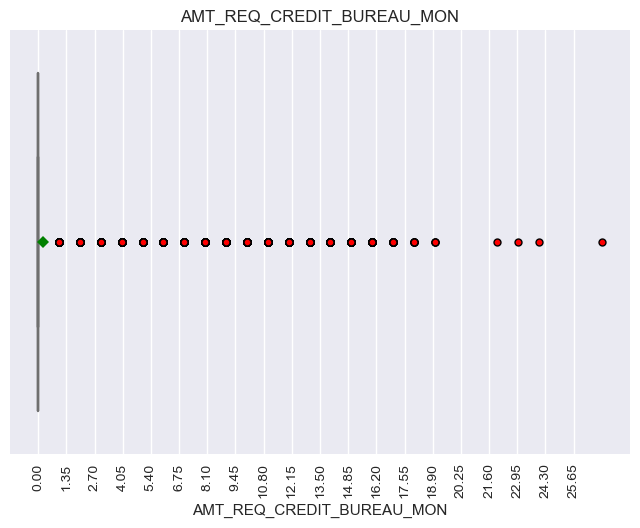

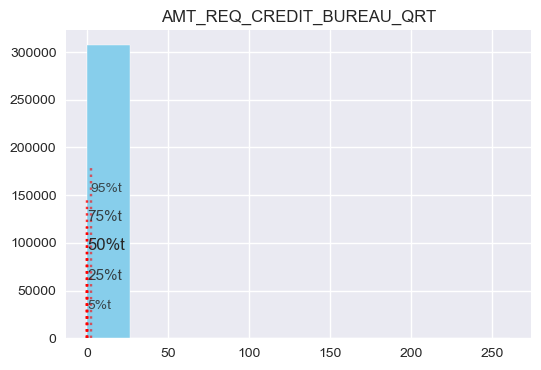

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


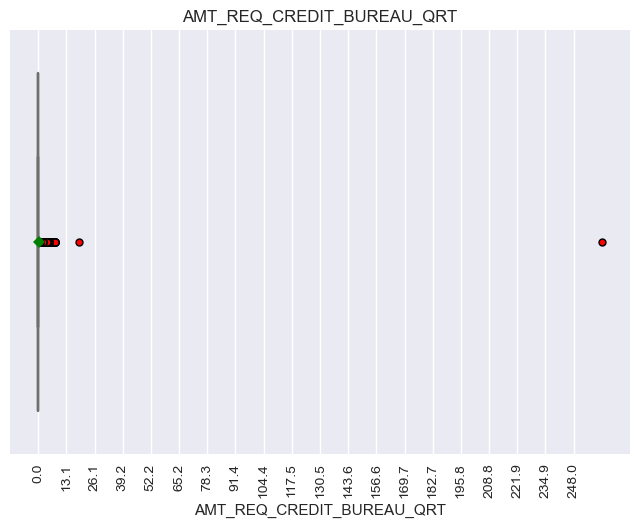

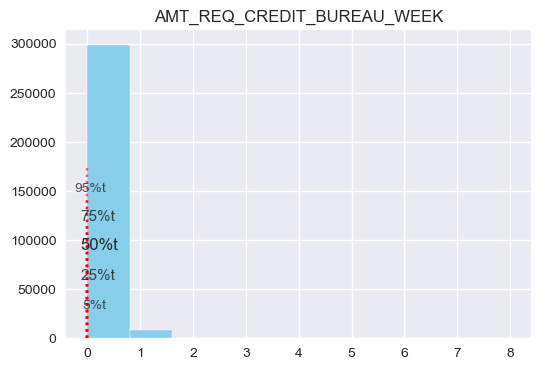

moy:      1.8
5%tile:   0.0
25%tile:  1.0
50%tile:  1.0
75%tile:  3.0
95%tile:  5.0


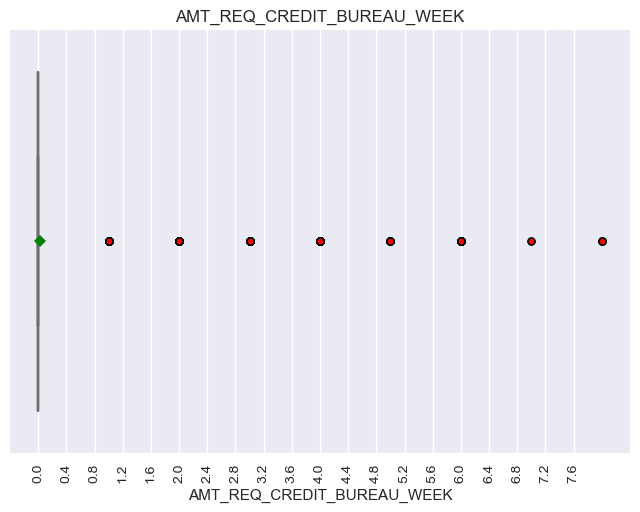

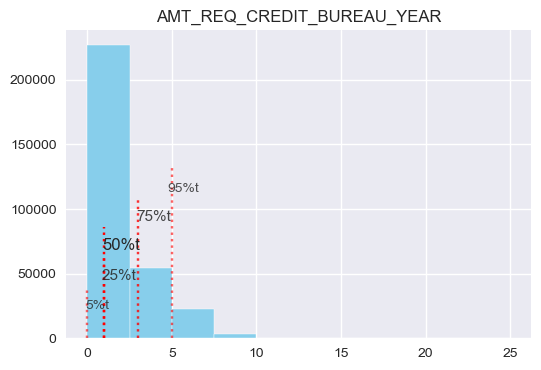

moy:      0.2
5%tile:   0.1
25%tile:  0.1
50%tile:  0.2
75%tile:  0.2
95%tile:  0.4


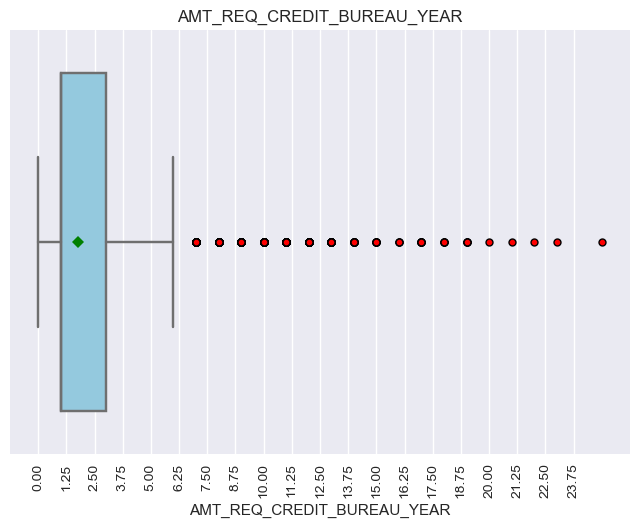

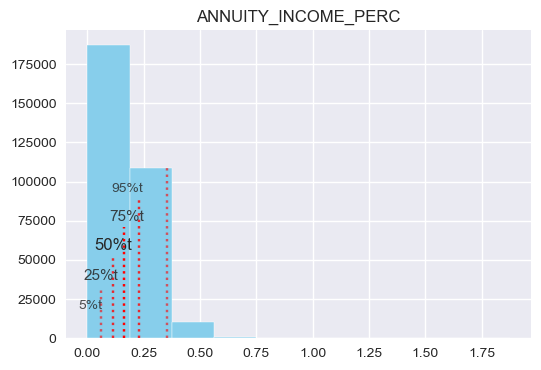

moy:      21323.5
5%tile:   4572.1
25%tile:  9934.3
50%tile:  16143.5
75%tile:  27084.2
95%tile:  54379.0


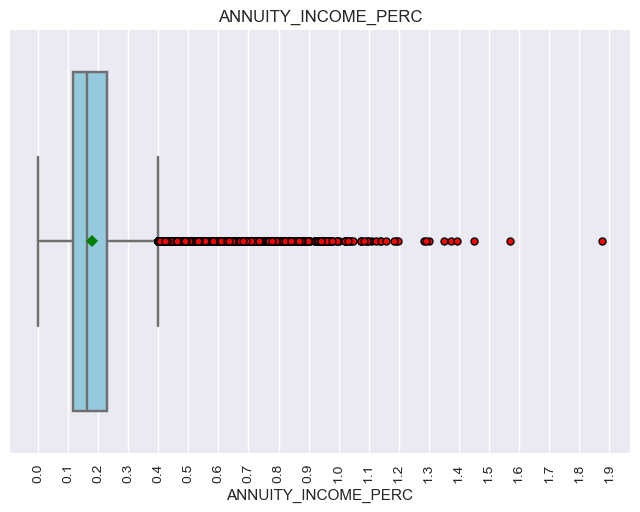

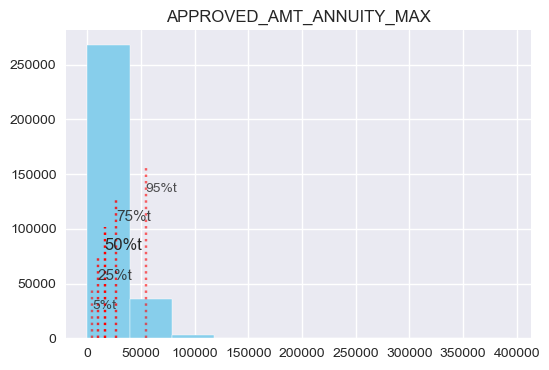

moy:      13780.5
5%tile:   4155.4
25%tile:  7704.1
50%tile:  11373.5
75%tile:  16942.8
95%tile:  31371.1


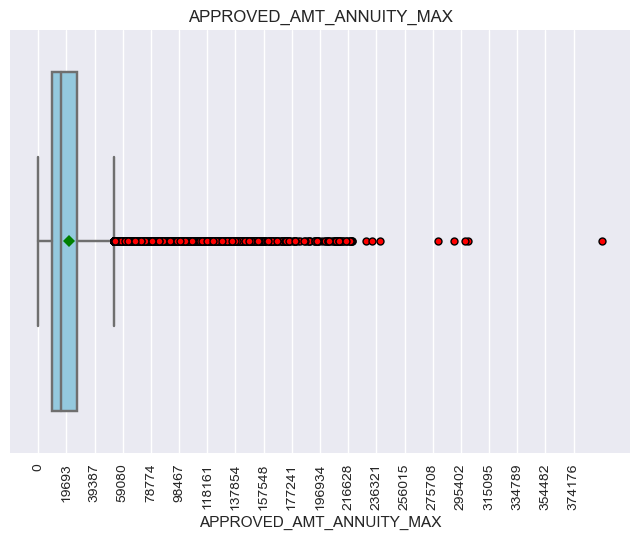

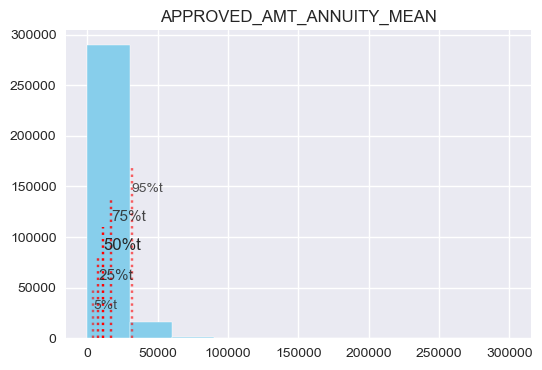

moy:      8128.0
5%tile:   2250.0
25%tile:  3857.5
50%tile:  5998.7
75%tile:  9590.7
95%tile:  21368.7


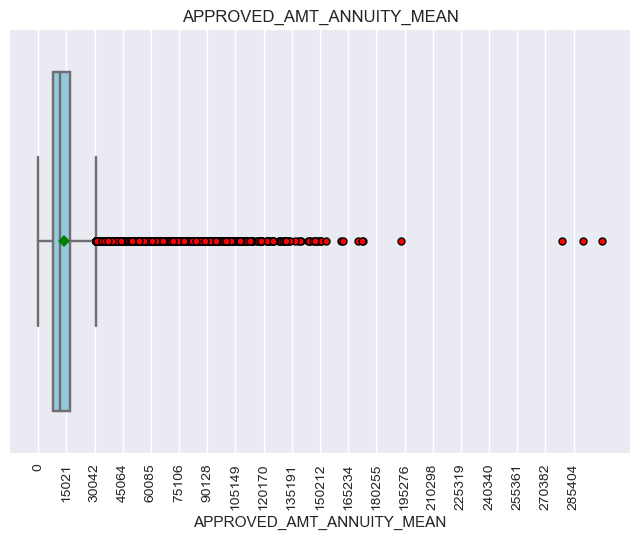

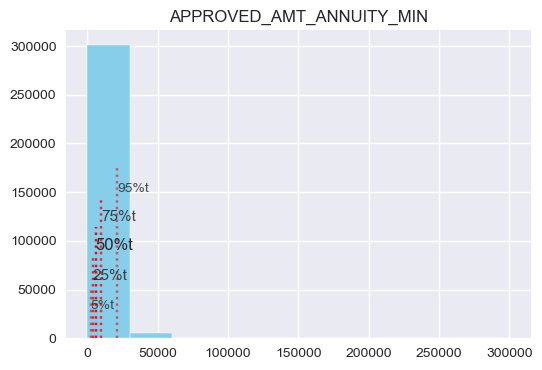

moy:      302918.3
5%tile:   35226.0
25%tile:  90846.0
50%tile:  169186.5
75%tile:  378000.0
95%tile:  1129500.0


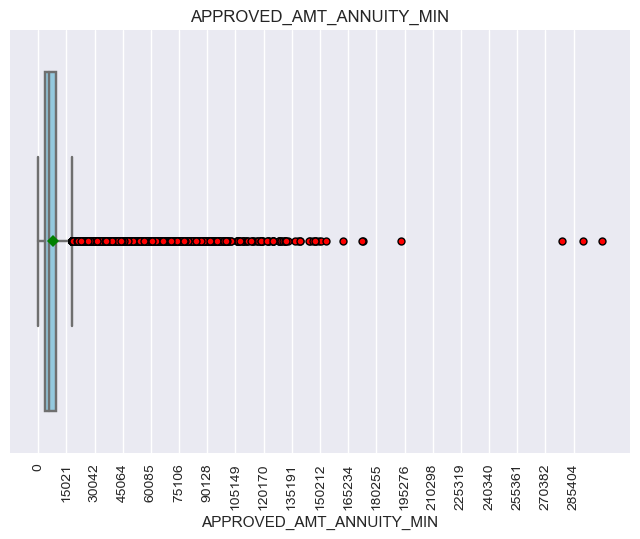

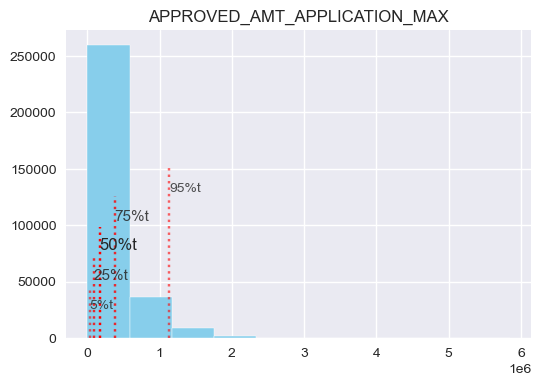

moy:      162874.4
5%tile:   30510.0
25%tile:  68391.0
50%tile:  113226.8
75%tile:  197902.5
95%tile:  464556.3


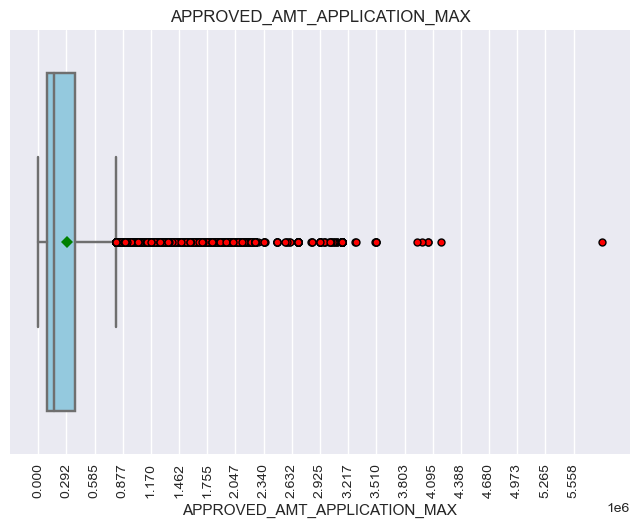

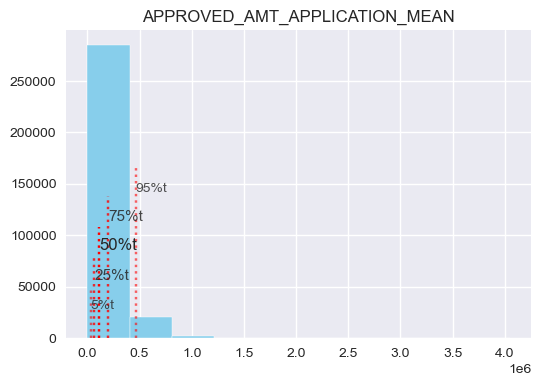

moy:      73357.4
5%tile:   0.0
25%tile:  24741.0
50%tile:  45000.0
75%tile:  85500.0
95%tile:  225000.0


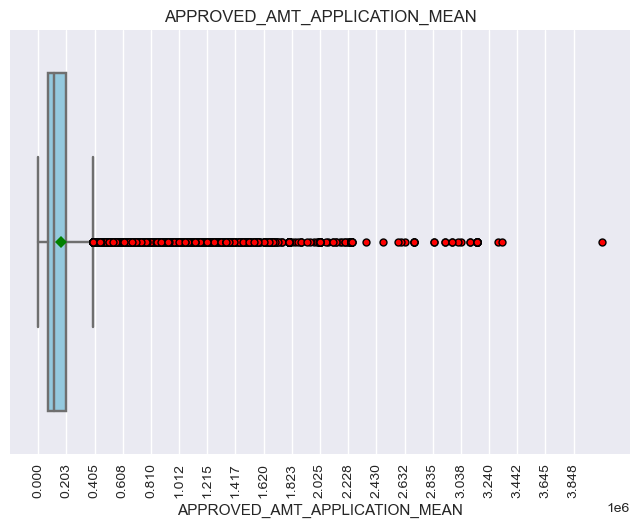

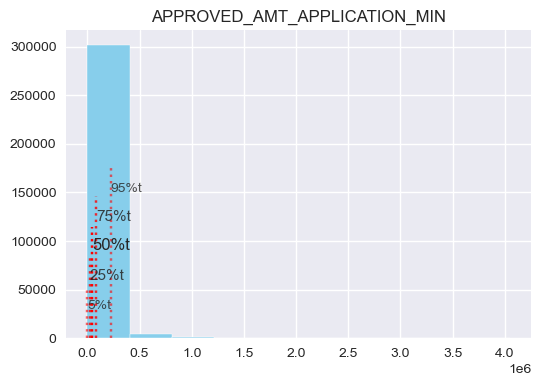

moy:      334284.1
5%tile:   35955.0
25%tile:  97618.5
50%tile:  182218.5
75%tile:  450000.0
95%tile:  1205807.4


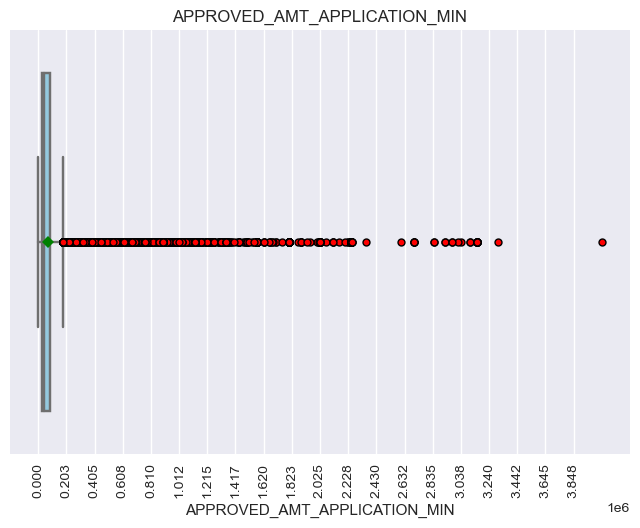

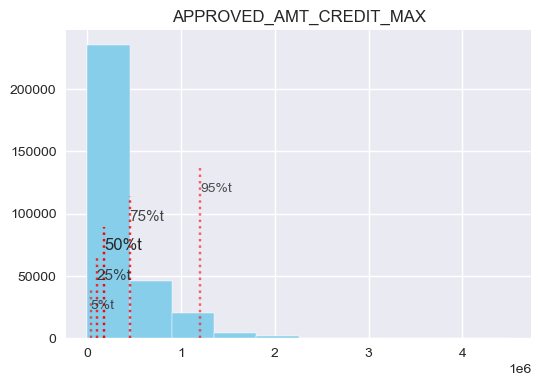

moy:      179940.2
5%tile:   32346.0
25%tile:  73849.5
50%tile:  125565.0
75%tile:  225000.0
95%tile:  511009.9


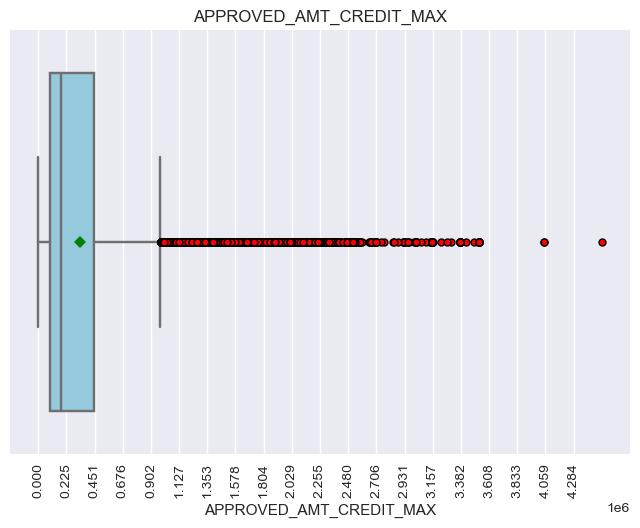

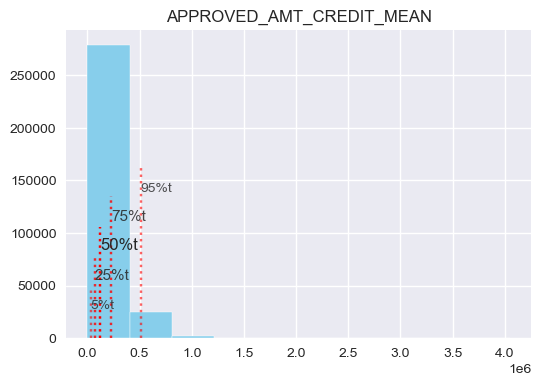

moy:      81449.5
5%tile:   16627.5
25%tile:  29736.0
50%tile:  47970.0
75%tile:  90760.5
95%tile:  232425.0


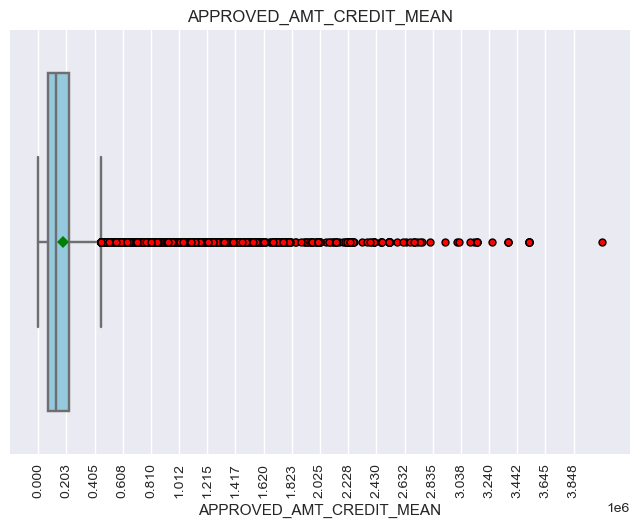

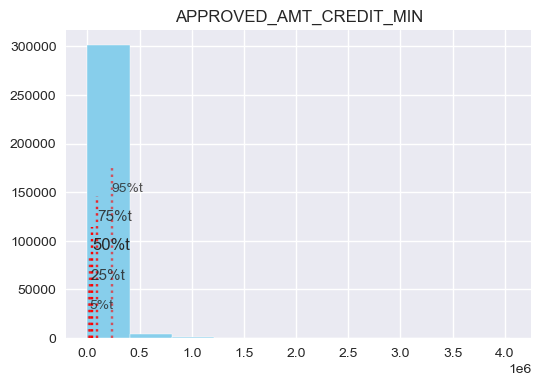

moy:      10427.3
5%tile:   0.0
25%tile:  0.0
50%tile:  5526.0
75%tile:  11961.0
95%tile:  37125.0


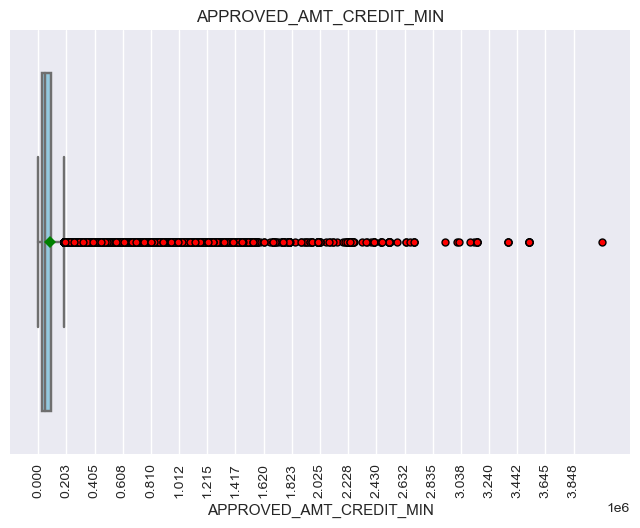

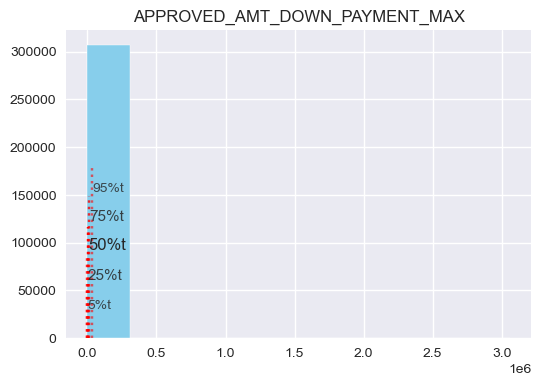

moy:      6799.6
5%tile:   0.0
25%tile:  0.0
50%tile:  3505.5
75%tile:  7559.5
95%tile:  23108.1


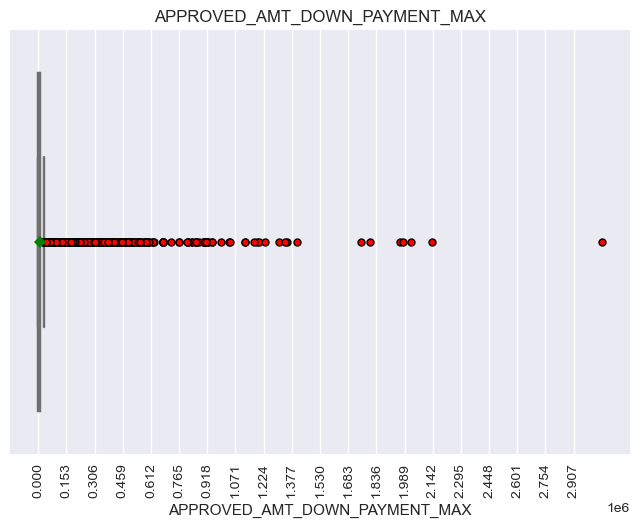

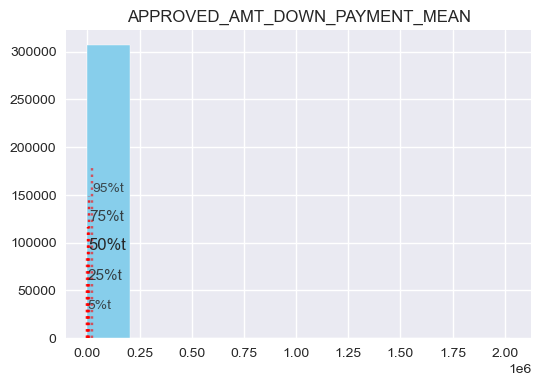

moy:      3915.7
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  3622.5
95%tile:  18000.0


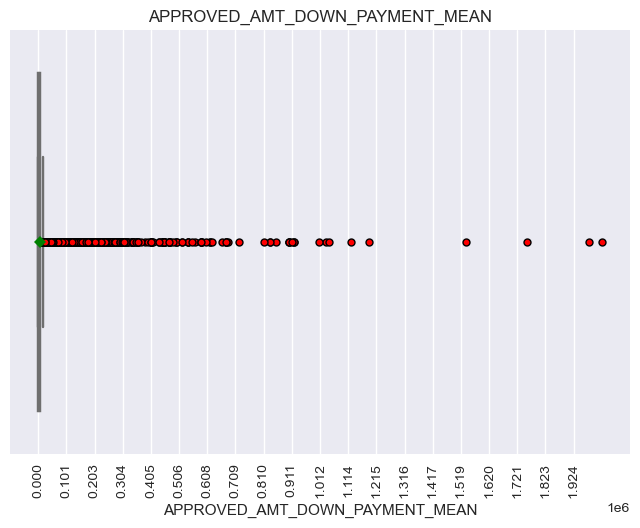

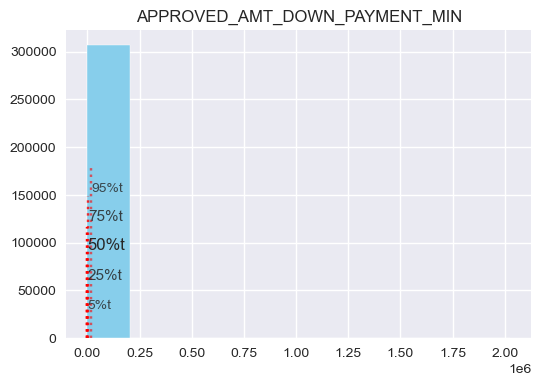

moy:      303549.1
5%tile:   36000.0
25%tile:  92115.0
50%tile:  170723.2
75%tile:  378000.0
95%tile:  1129500.0


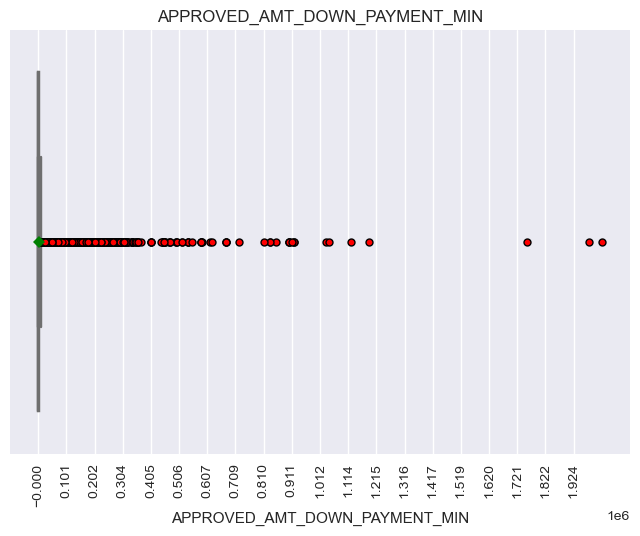

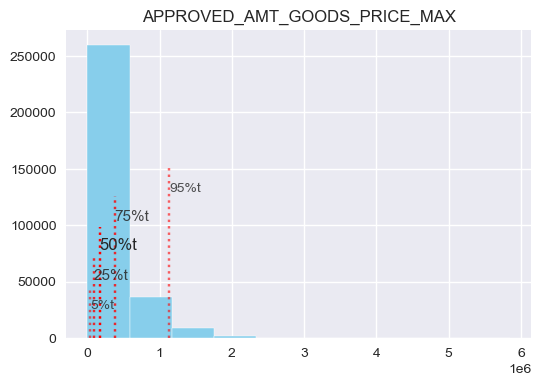

moy:      169731.5
5%tile:   32805.0
25%tile:  71525.2
50%tile:  117552.9
75%tile:  205650.0
95%tile:  485572.3


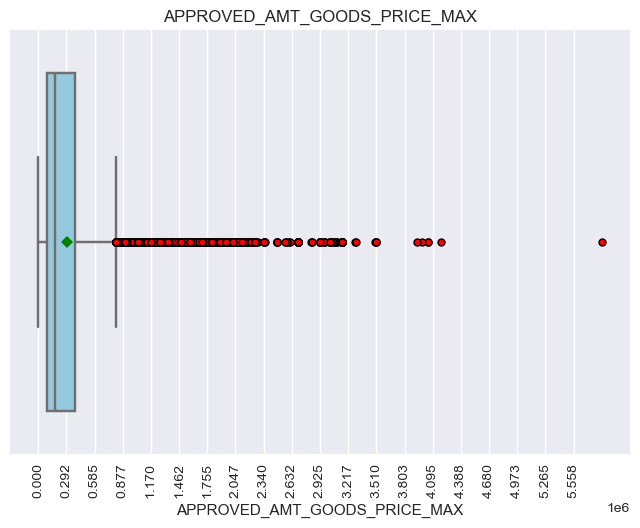

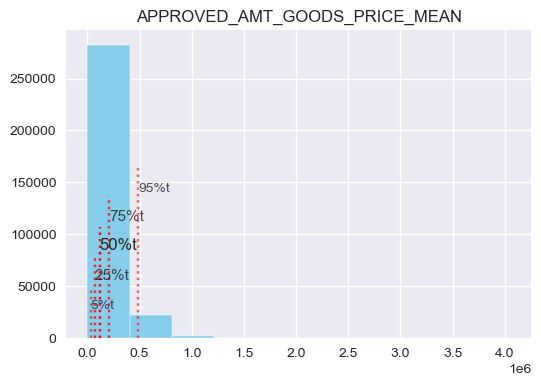

moy:      82367.8
5%tile:   17941.5
25%tile:  31495.5
50%tile:  49495.5
75%tile:  90063.9
95%tile:  225000.0


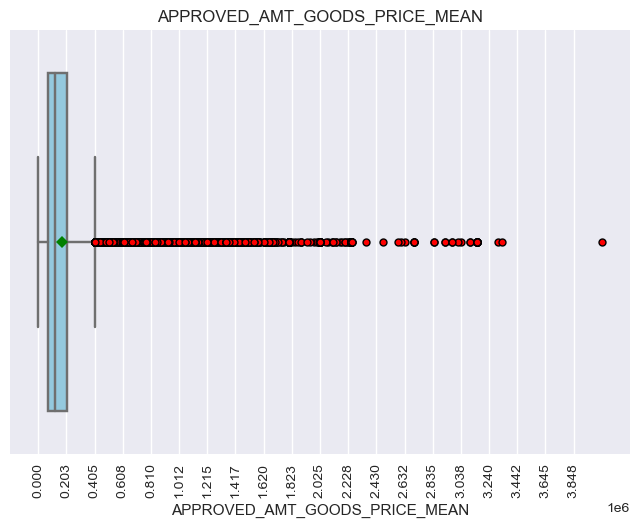

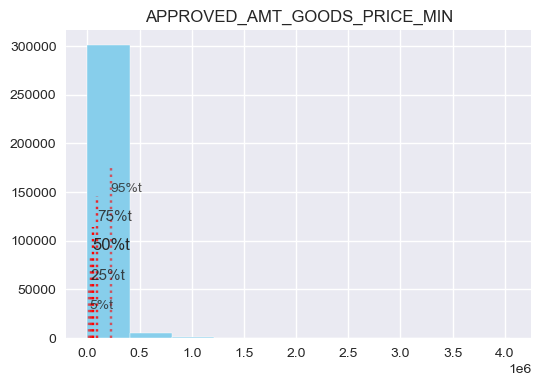

moy:      1.1
5%tile:   0.9
25%tile:  1.0
50%tile:  1.0
75%tile:  1.1
95%tile:  1.5


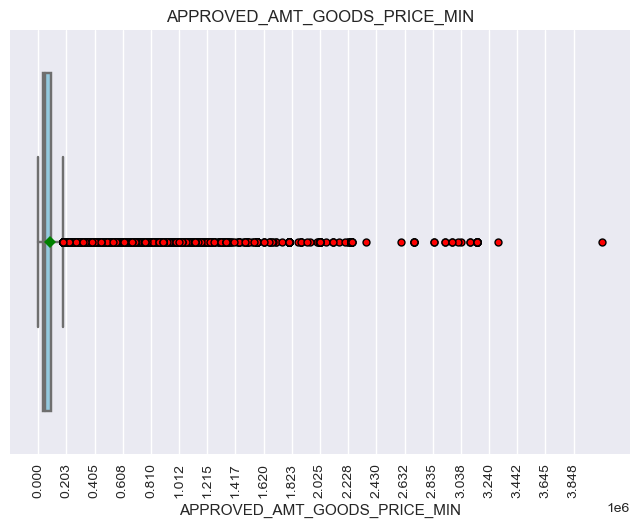

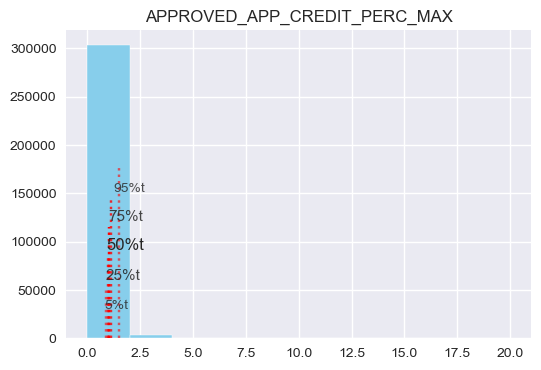

moy:      1.0
5%tile:   0.7
25%tile:  0.9
50%tile:  1.0
75%tile:  1.0
95%tile:  1.2


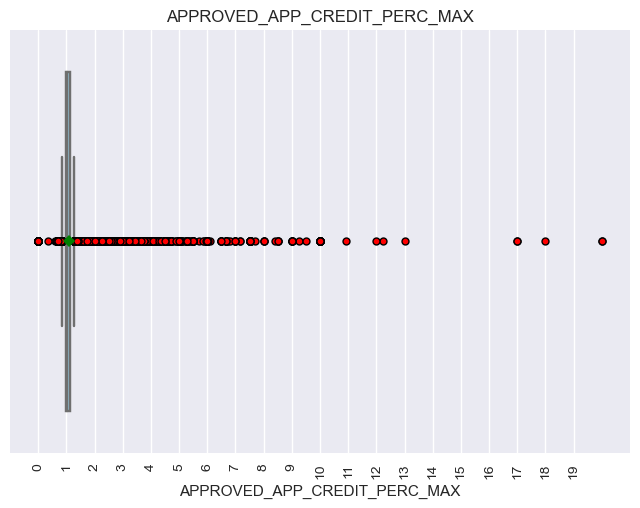

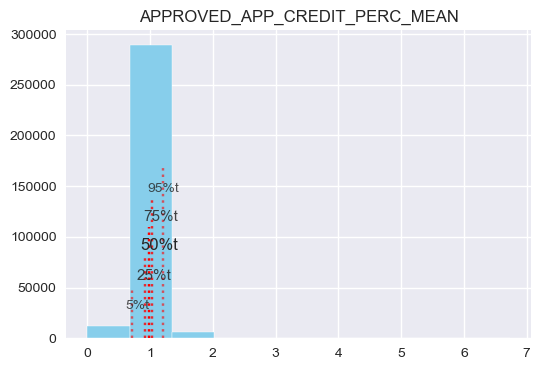

moy:      0.8
5%tile:   0.0
25%tile:  0.8
50%tile:  0.9
75%tile:  1.0
95%tile:  1.1


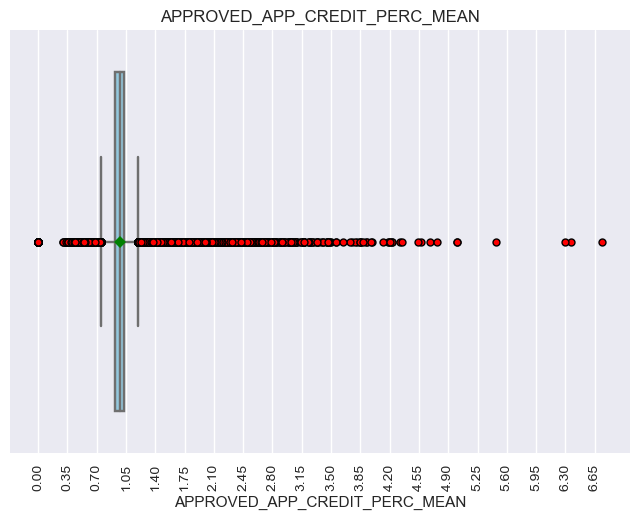

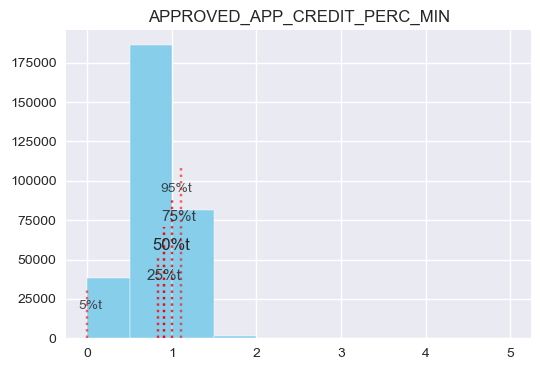

moy:      13.5
5%tile:   5.5
25%tile:  9.0
50%tile:  12.0
75%tile:  16.5
95%tile:  27.3


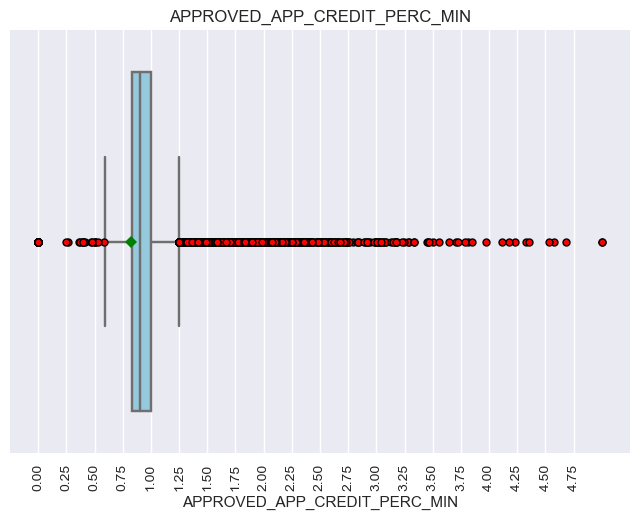

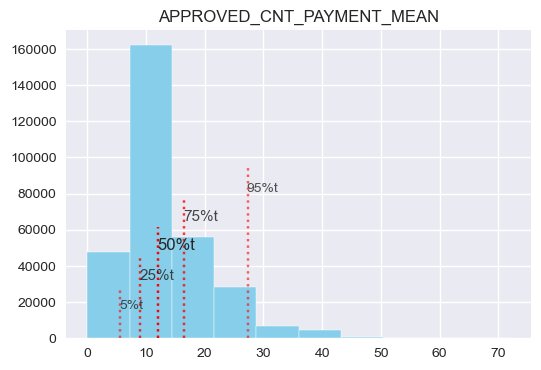

moy:      42.5
5%tile:   6.0
25%tile:  14.0
50%tile:  30.0
75%tile:  56.0
95%tile:  122.0


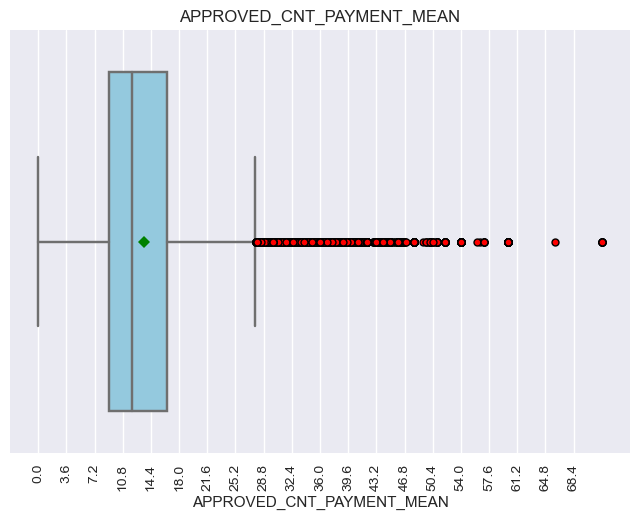

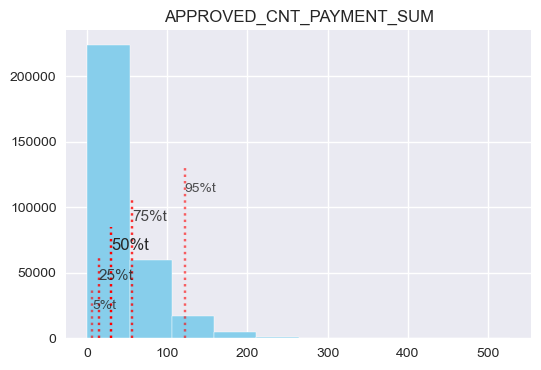

moy:      -593.5
5%tile:   -1948.0
25%tile:  -708.0
50%tile:  -434.0
75%tile:  -254.0
95%tile:  -74.0


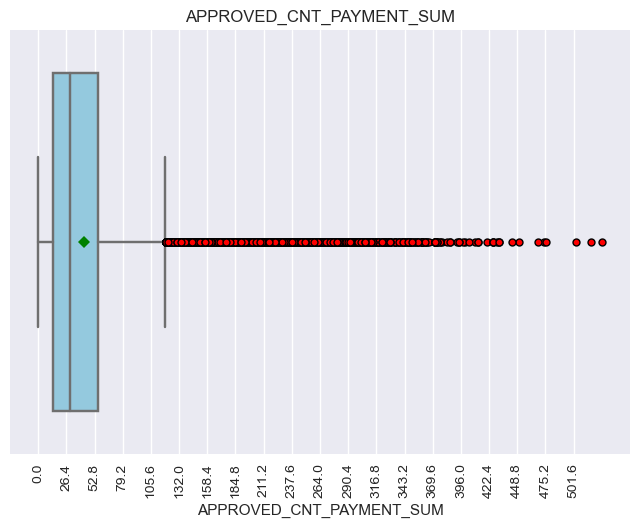

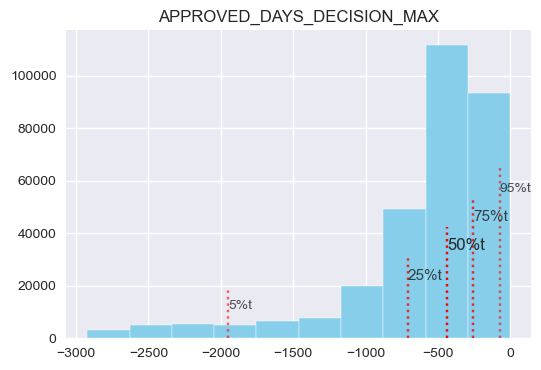

moy:      -1026.6
5%tile:   -2161.0
25%tile:  -1364.6
50%tile:  -940.5
75%tile:  -579.0
95%tile:  -275.0


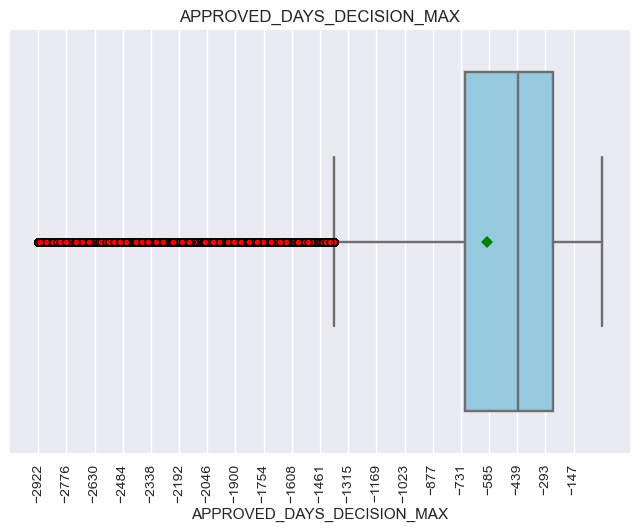

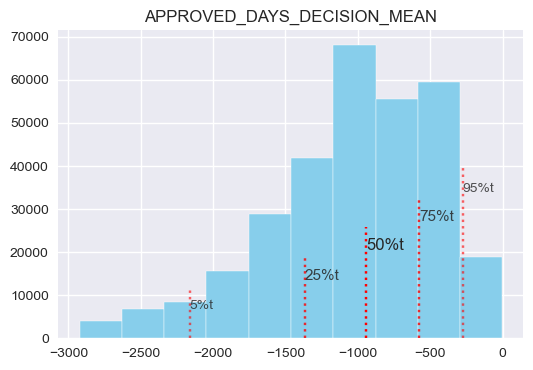

moy:      -1528.2
5%tile:   -2809.0
25%tile:  -2335.0
50%tile:  -1490.0
75%tile:  -752.0
95%tile:  -312.0


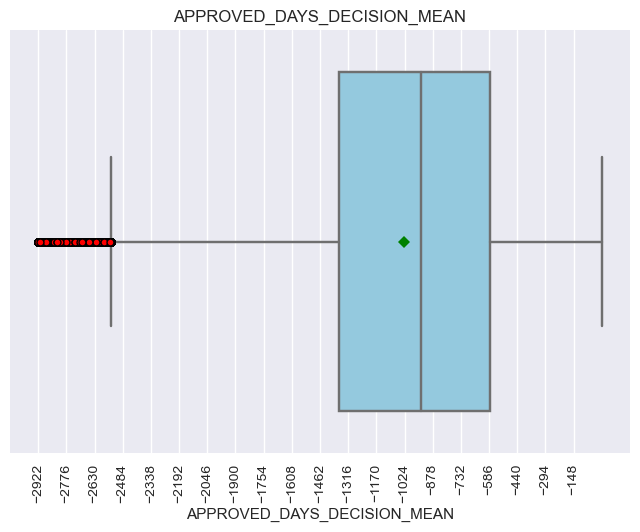

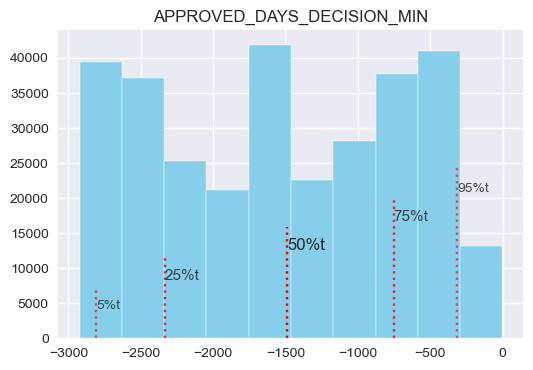

moy:      14.4
5%tile:   9.0
25%tile:  12.0
50%tile:  15.0
75%tile:  17.0
95%tile:  19.0


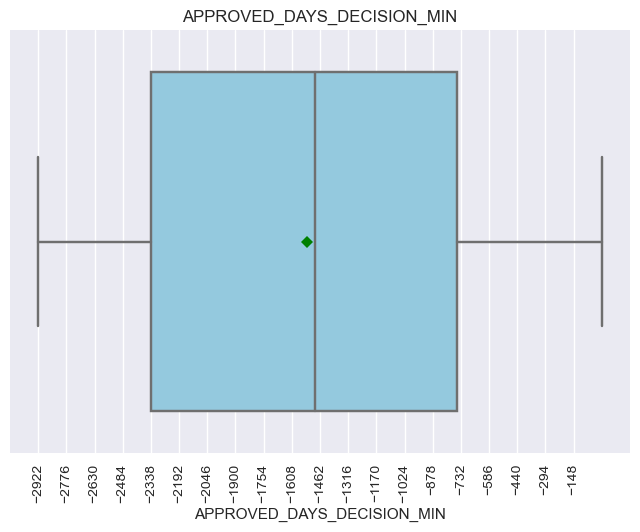

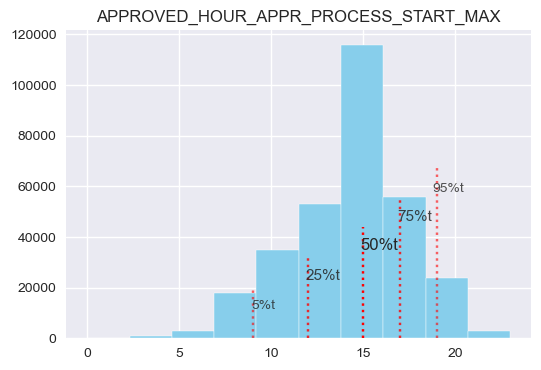

moy:      12.8
5%tile:   8.0
25%tile:  11.0
50%tile:  13.0
75%tile:  14.5
95%tile:  17.1


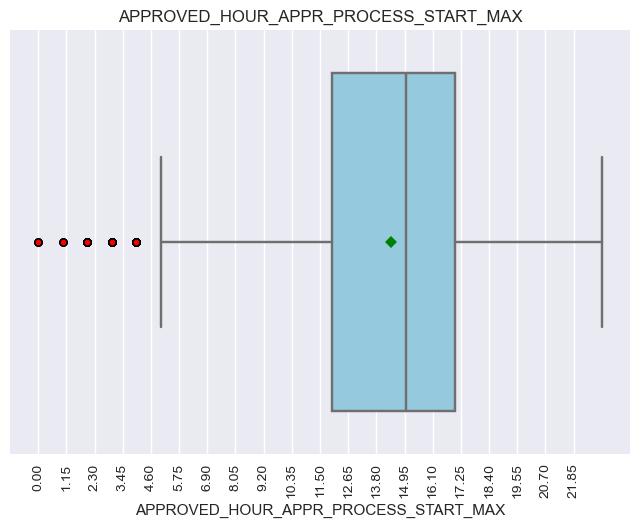

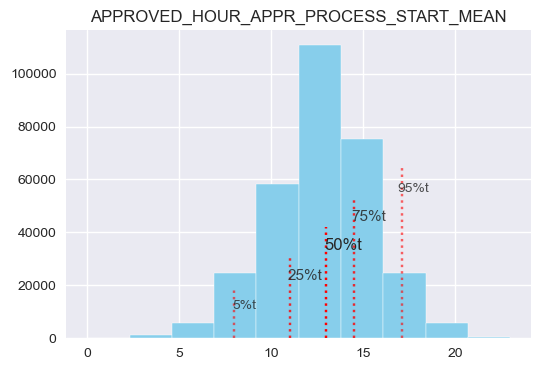

moy:      11.2
5%tile:   6.0
25%tile:  9.0
50%tile:  11.0
75%tile:  13.0
95%tile:  17.0


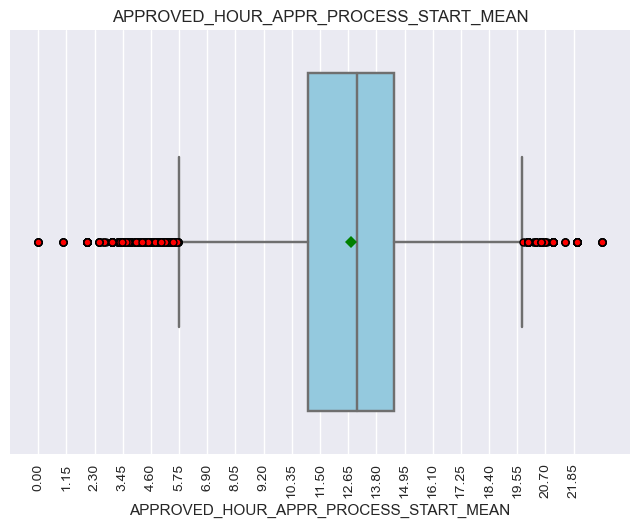

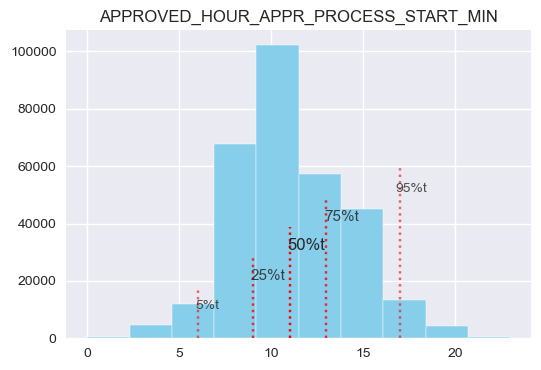

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.1
75%tile:  0.2
95%tile:  0.4


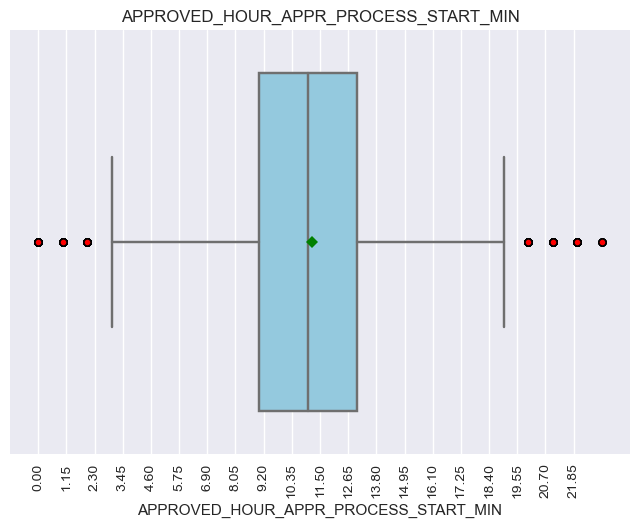

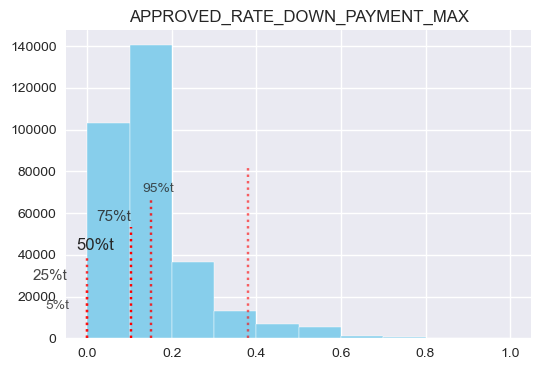

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.1
75%tile:  0.1
95%tile:  0.2


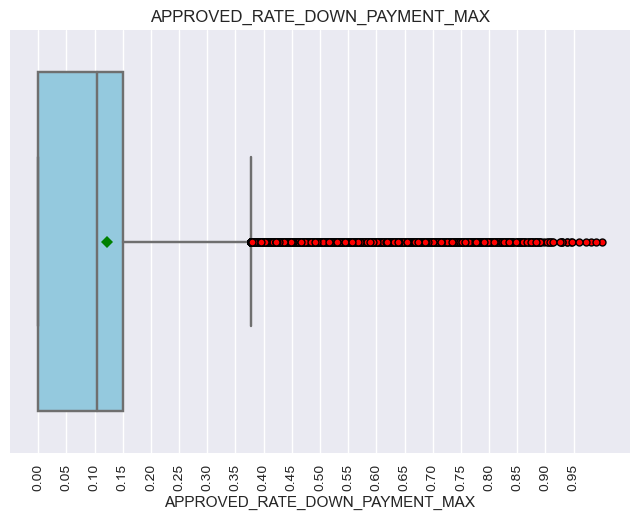

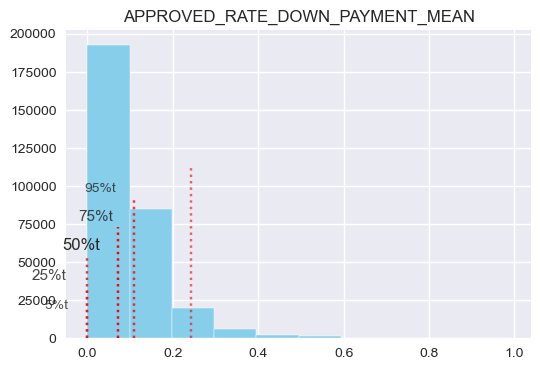

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.1
95%tile:  0.2


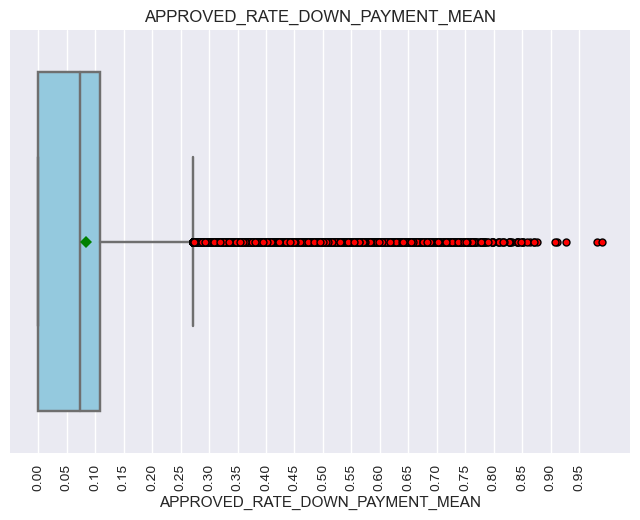

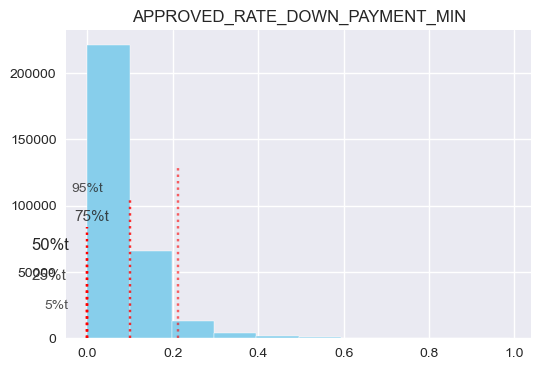

moy:      459451.8
5%tile:   0.0
25%tile:  15520.5
50%tile:  149458.5
75%tile:  394137.0
95%tile:  1853969.4


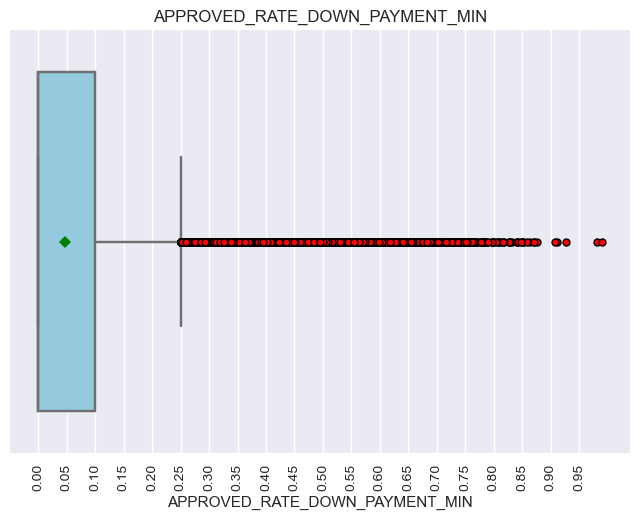

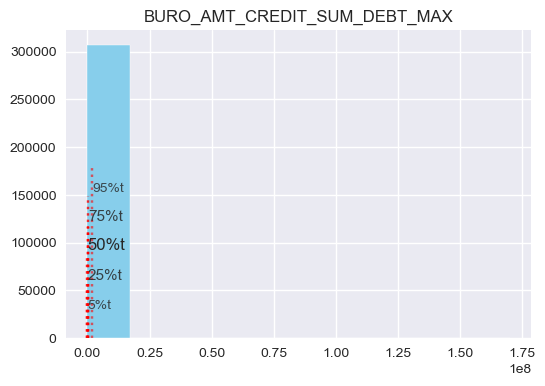

moy:      140977.0
5%tile:   0.0
25%tile:  4169.2
50%tile:  44208.0
75%tile:  112954.1
95%tile:  528415.4


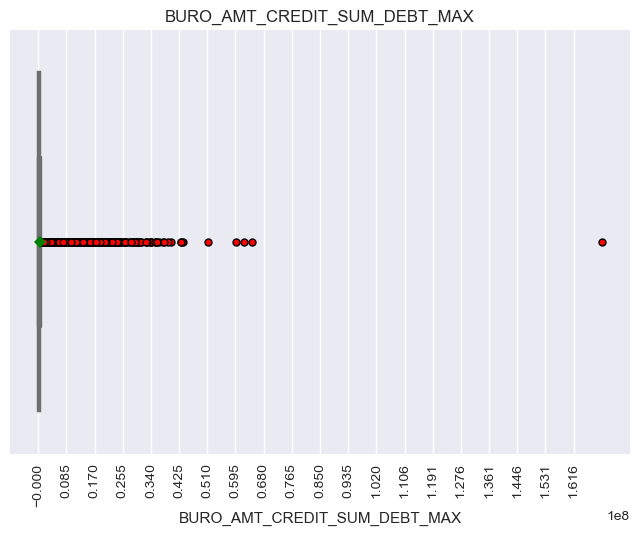

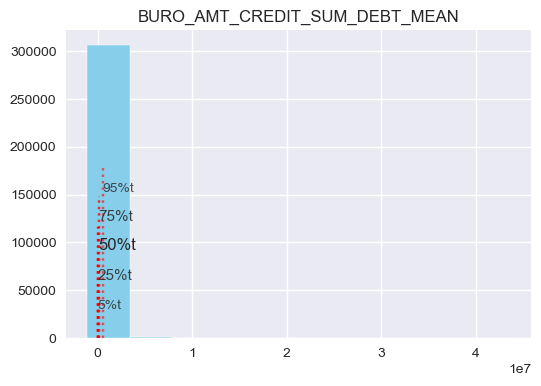

moy:      573149.0
5%tile:   0.0
25%tile:  0.0
50%tile:  169020.0
75%tile:  534844.8
95%tile:  2387511.9


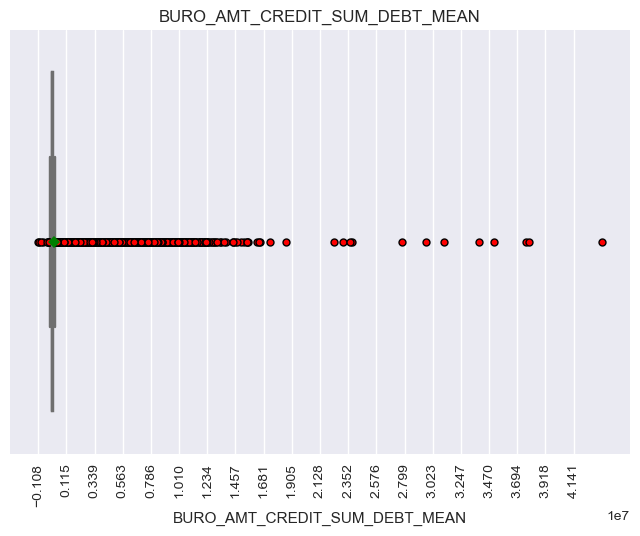

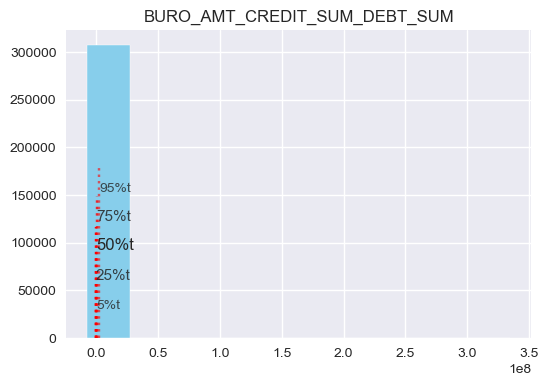

moy:      20188.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  135000.0


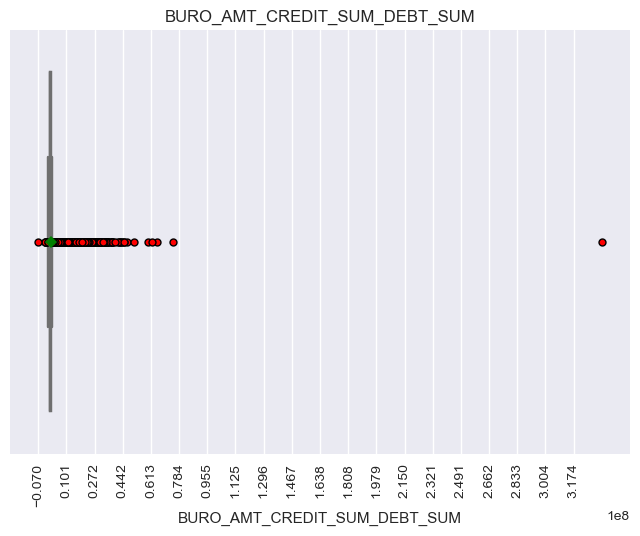

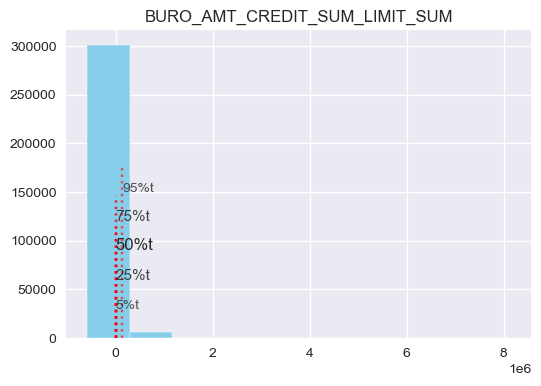

moy:      900708.0
5%tile:   58905.0
25%tile:  225000.0
50%tile:  450000.0
75%tile:  900000.0
95%tile:  3150000.0


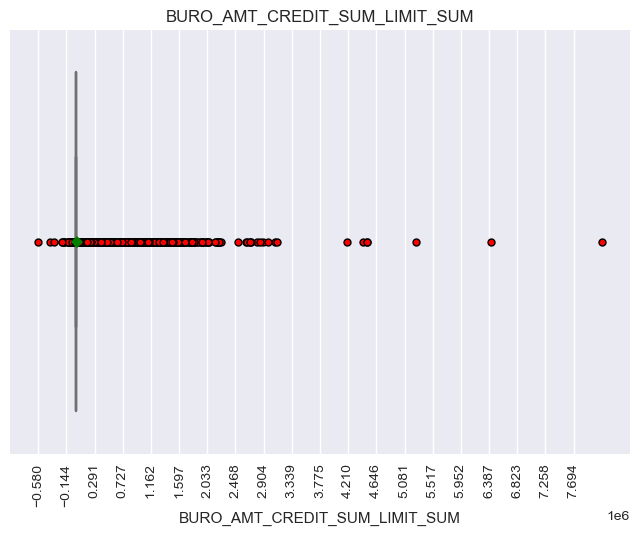

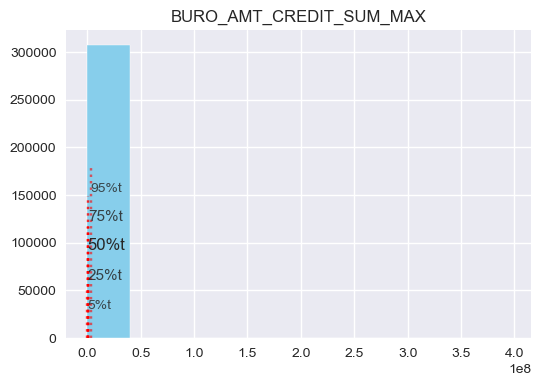

moy:      351946.0
5%tile:   44400.2
25%tile:  115980.1
50%tile:  195507.2
75%tile:  344433.9
95%tile:  1116000.0


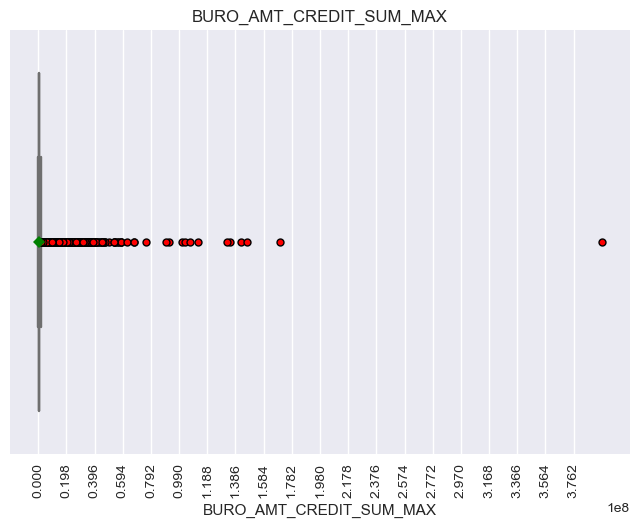

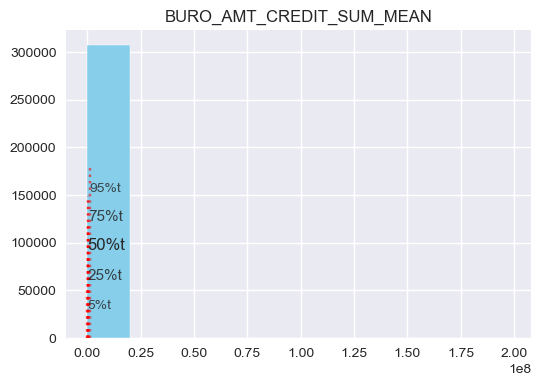

moy:      42.5
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


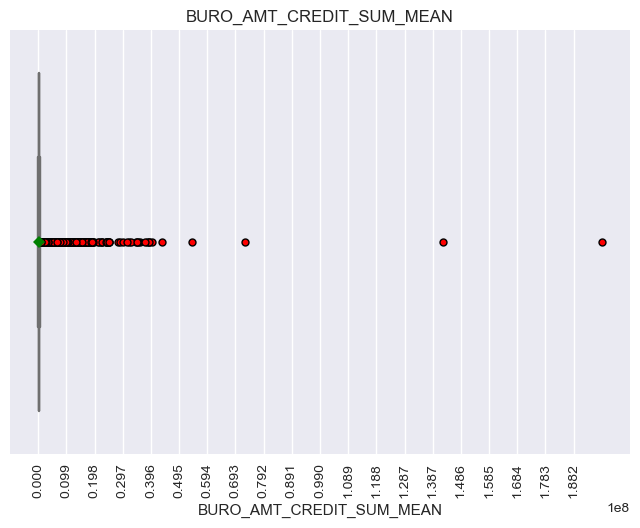

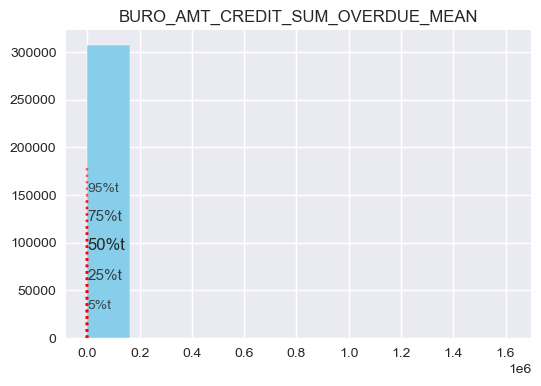

moy:      1813521.5
5%tile:   74681.3
25%tile:  425302.4
50%tile:  961704.0
75%tile:  1970986.5
95%tile:  6428958.6


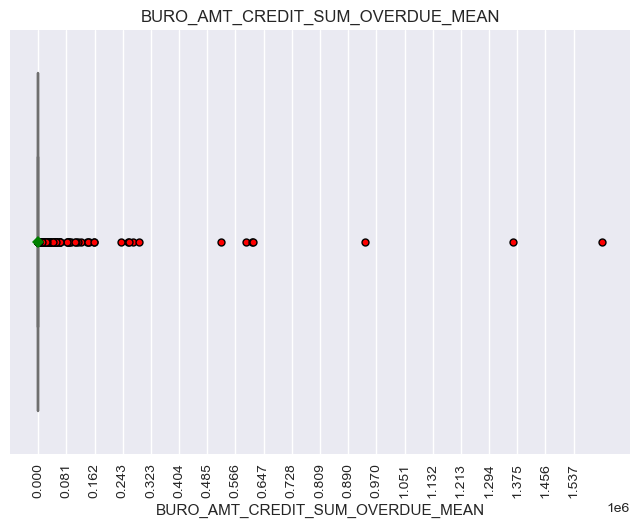

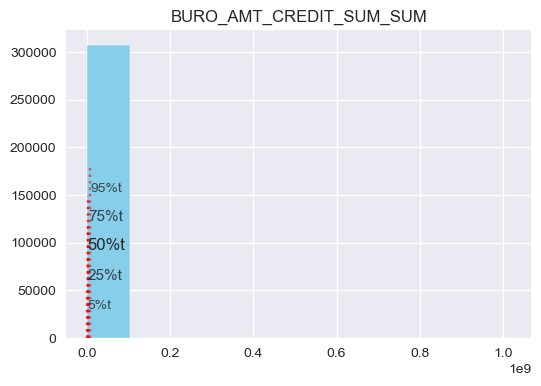

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


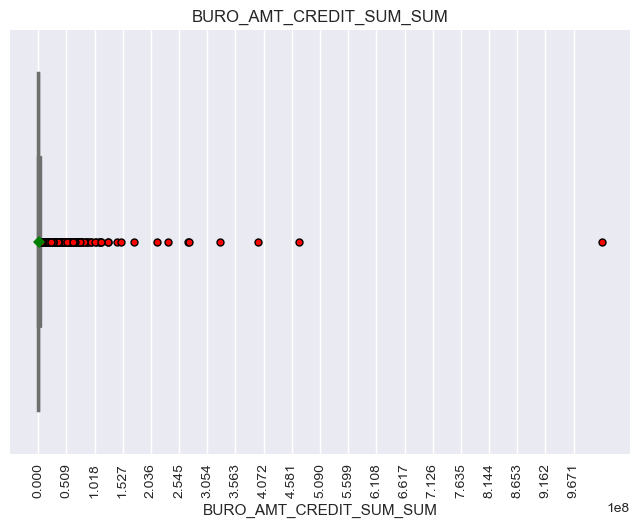

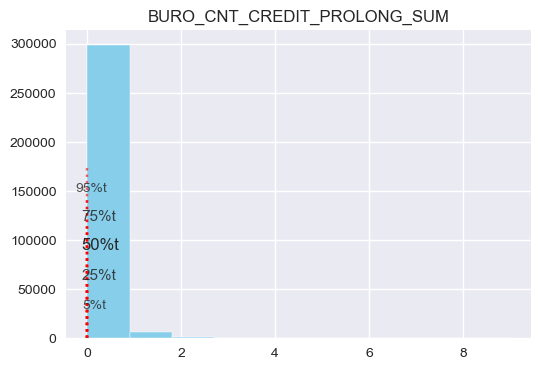

moy:      4.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


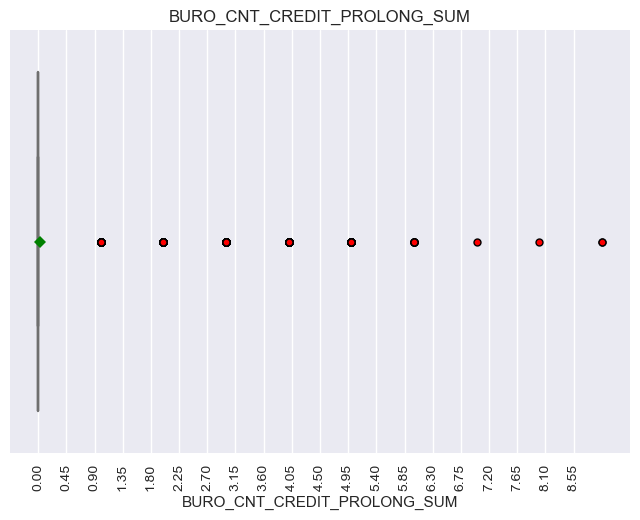

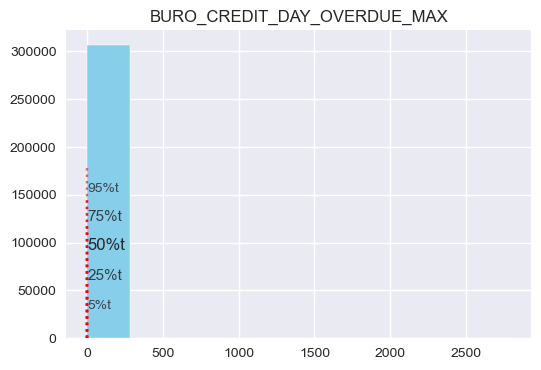

moy:      0.9
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


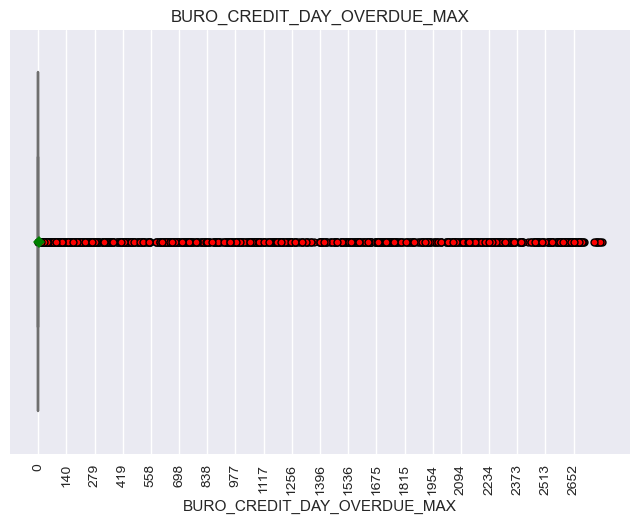

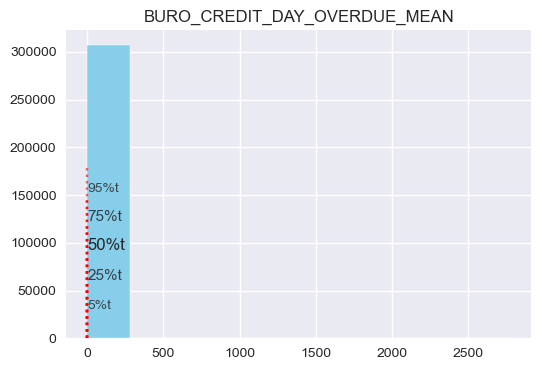

moy:      3903.0
5%tile:   -941.0
25%tile:  253.0
50%tile:  909.0
75%tile:  1560.0
95%tile:  31008.0


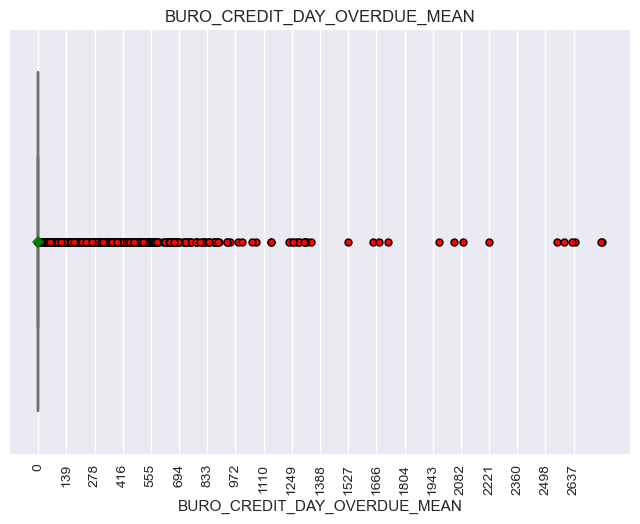

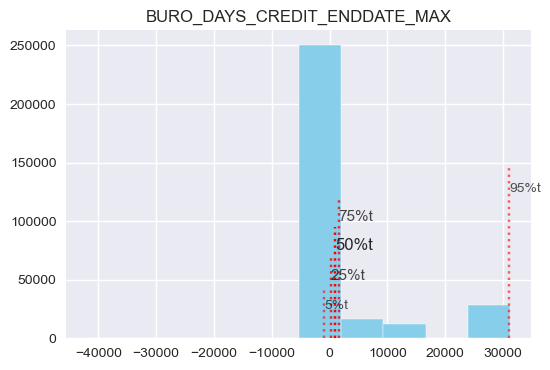

moy:      533.4
5%tile:   -1456.0
25%tile:  -594.5
50%tile:  -135.6
75%tile:  405.0
95%tile:  5269.4


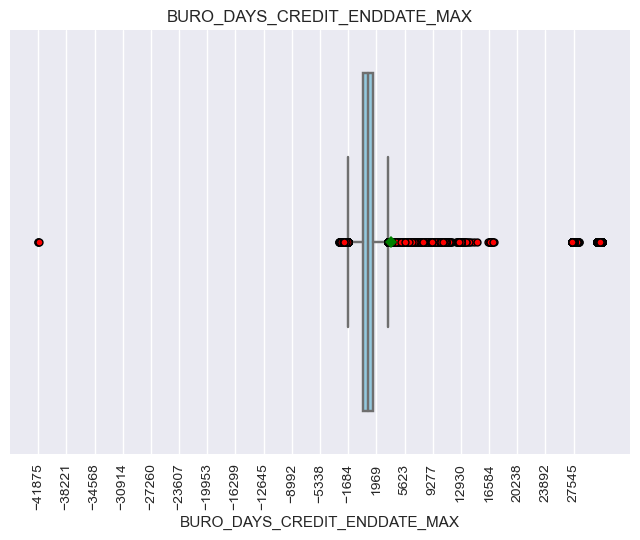

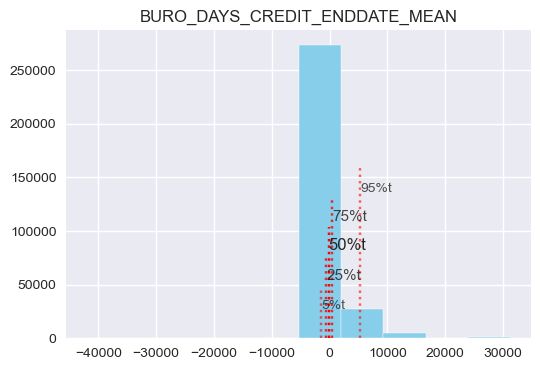

moy:      -1065.5
5%tile:   -2541.0
25%tile:  -2012.0
50%tile:  -1268.0
75%tile:  -600.0
95%tile:  608.0


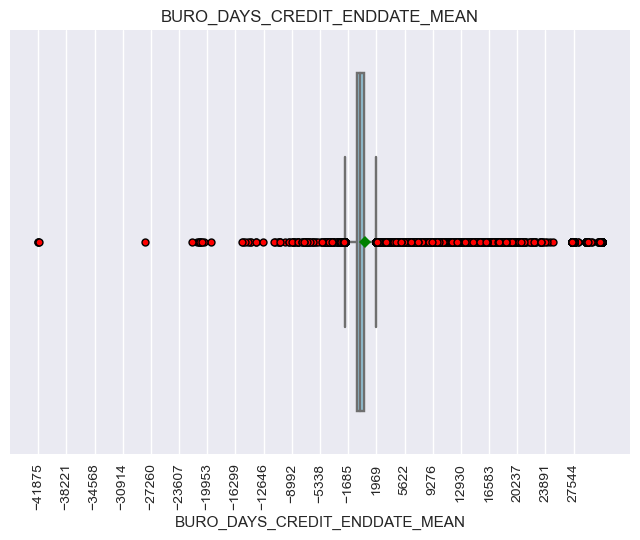

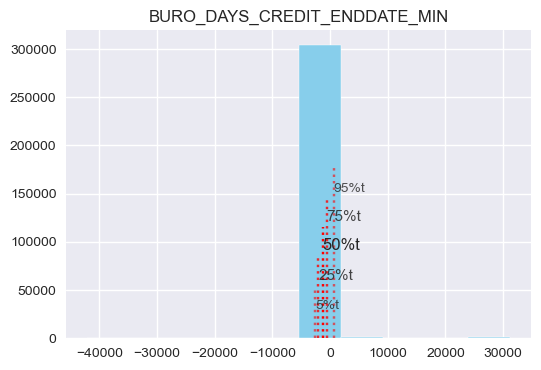

moy:      -462.2
5%tile:   -1531.0
25%tile:  -537.0
50%tile:  -300.0
75%tile:  -167.0
95%tile:  -44.0


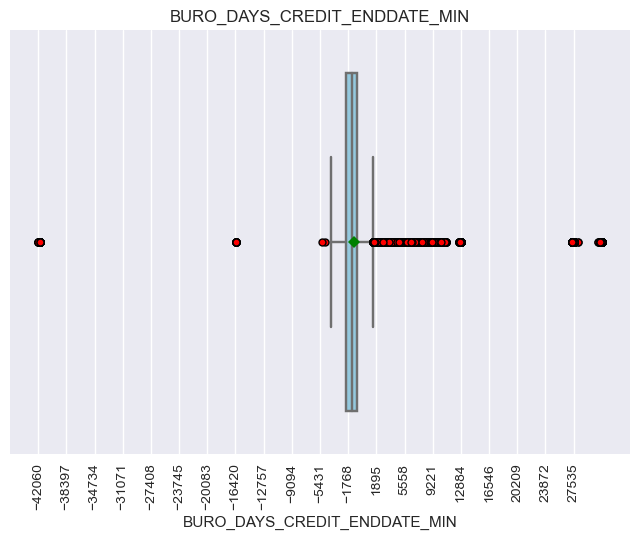

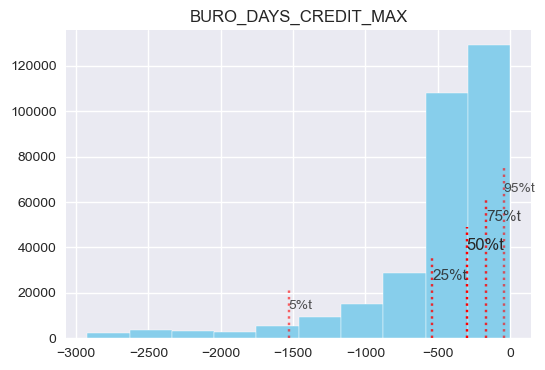

moy:      -1078.4
5%tile:   -2031.5
25%tile:  -1362.6
50%tile:  -1050.6
75%tile:  -734.6
95%tile:  -262.0


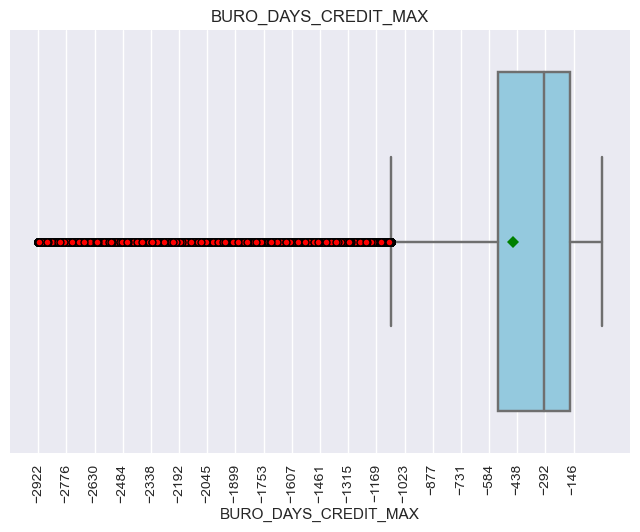

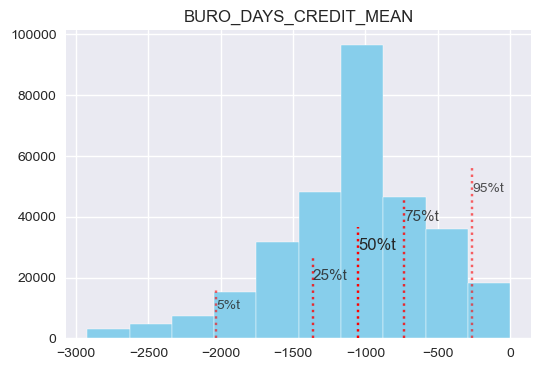

moy:      -1771.6
5%tile:   -2858.0
25%tile:  -2511.0
50%tile:  -1827.0
75%tile:  -1165.0
95%tile:  -335.0


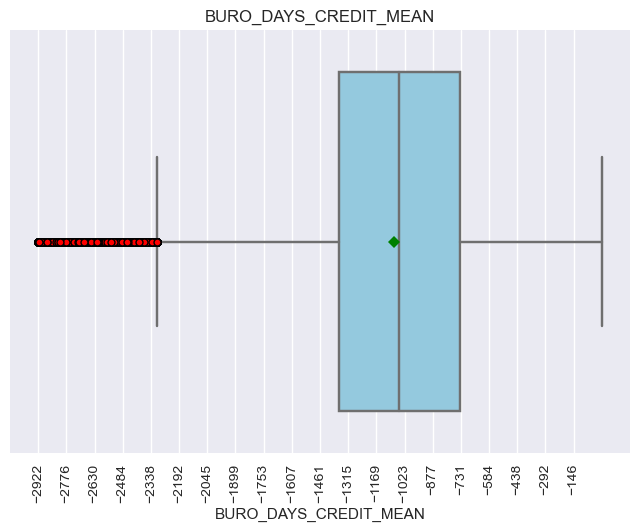

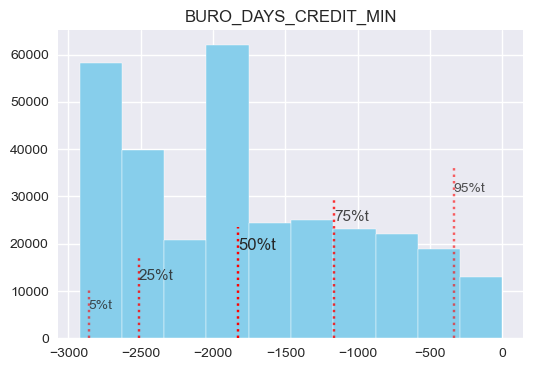

moy:      -537.4
5%tile:   -1278.8
25%tile:  -721.0
50%tile:  -481.8
75%tile:  -256.0
95%tile:  -21.0


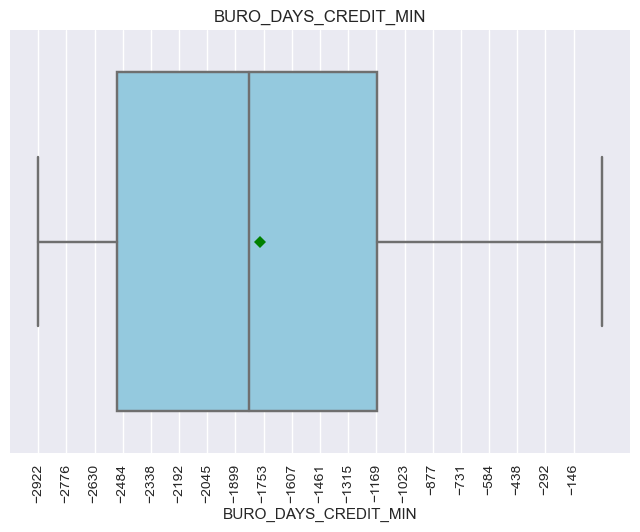

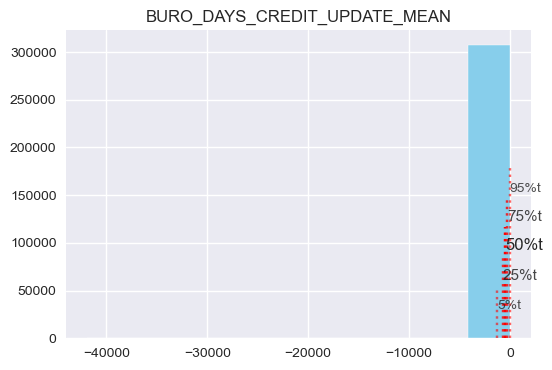

moy:      47.8
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  29.0
95%tile:  285.0


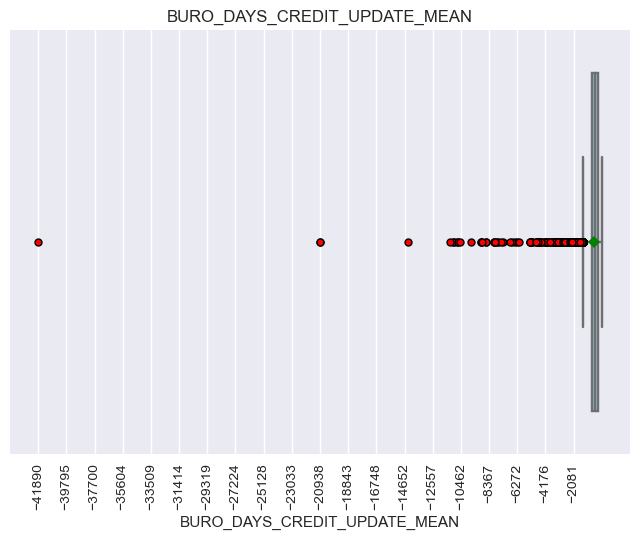

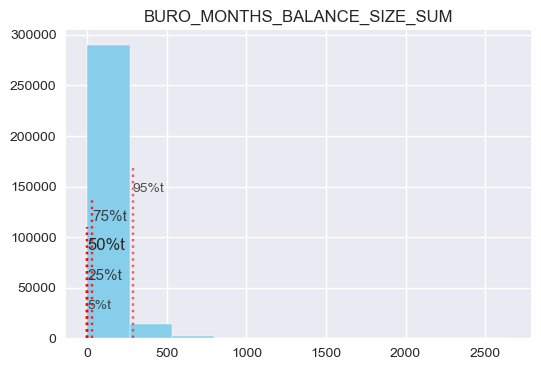

moy:      0.4
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  1.0
95%tile:  2.0


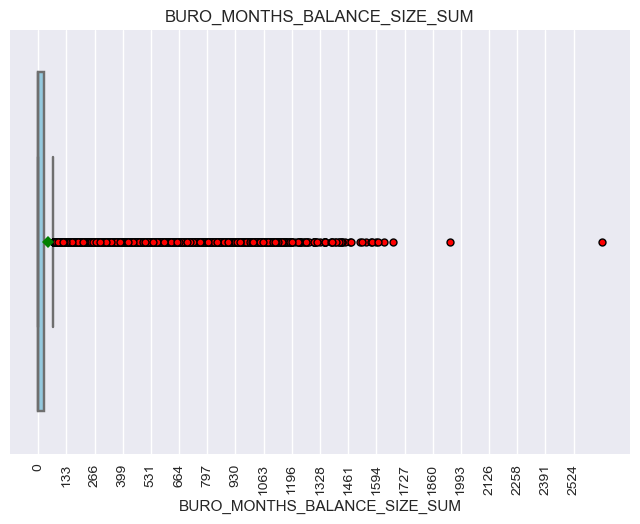

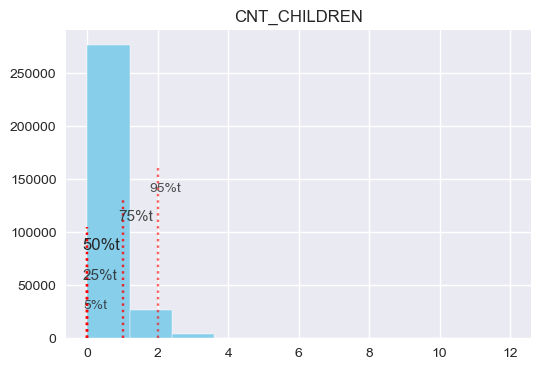

moy:      2.2
5%tile:   1.0
25%tile:  2.0
50%tile:  2.0
75%tile:  3.0
95%tile:  4.0


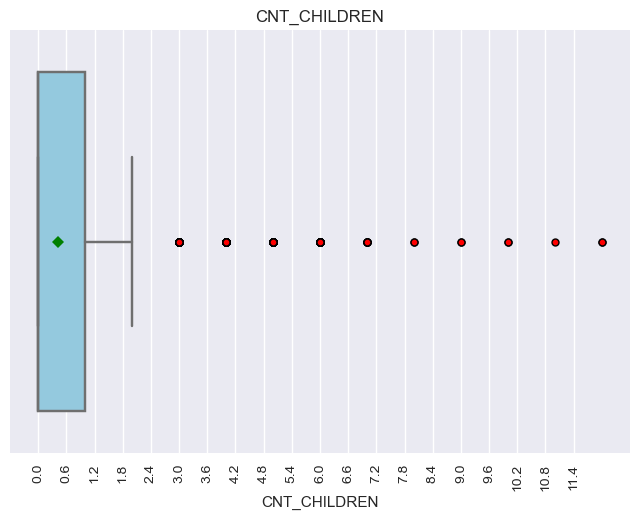

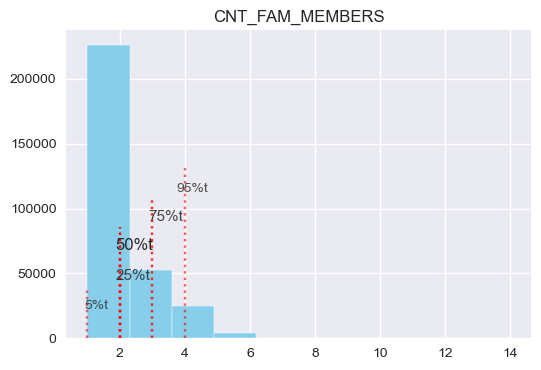

moy:      0.3
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  1.0
95%tile:  1.0


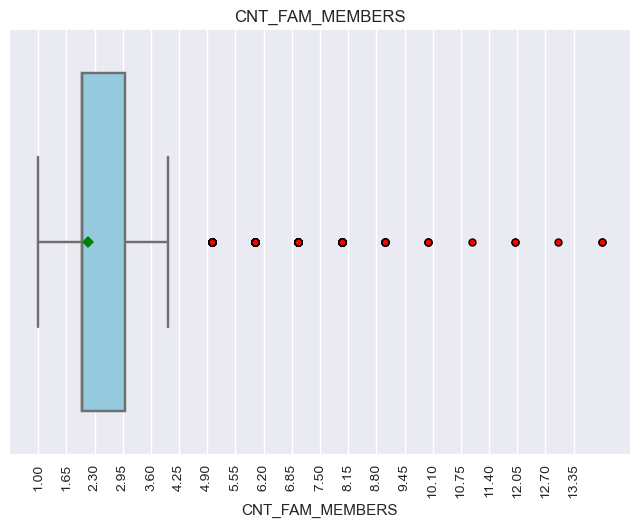

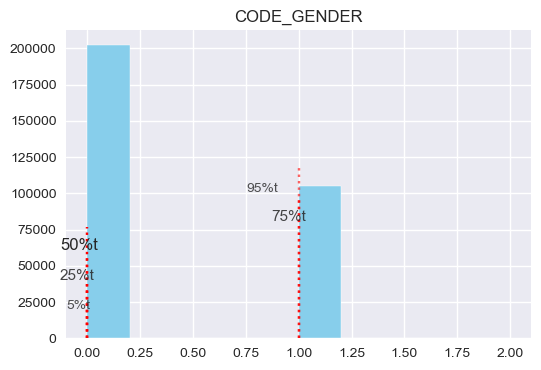

moy:      -16036.9
5%tile:   -23204.0
25%tile:  -19682.0
50%tile:  -15750.0
75%tile:  -12413.0
95%tile:  -9407.0


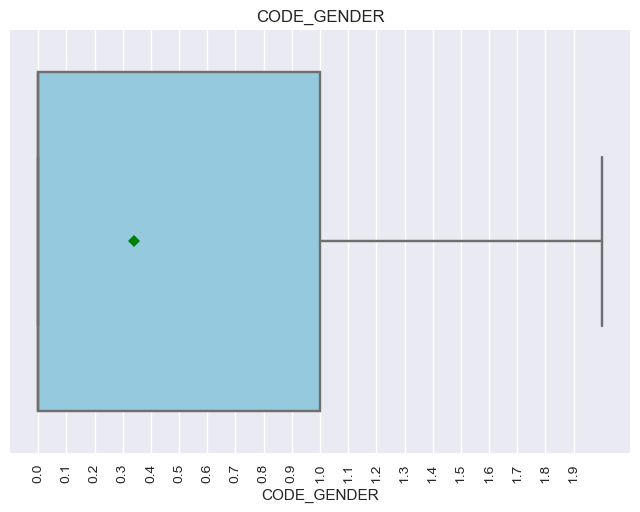

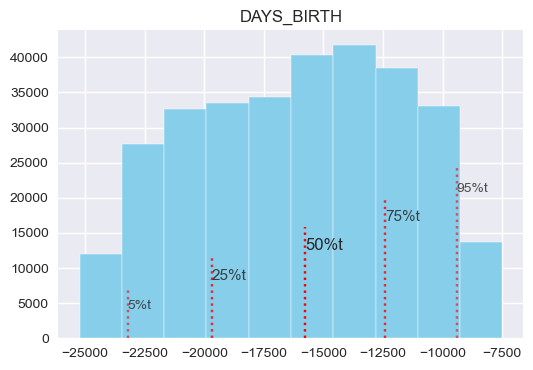

moy:      -2251.6
5%tile:   -6741.8
25%tile:  -2760.0
50%tile:  -1648.0
75%tile:  -933.0
95%tile:  -229.0


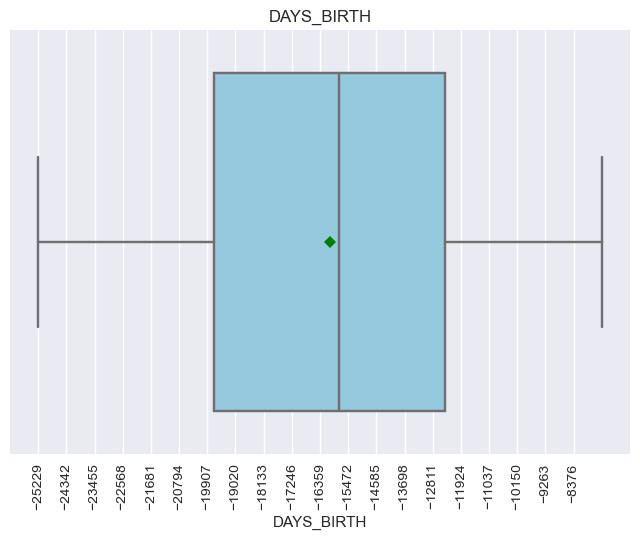

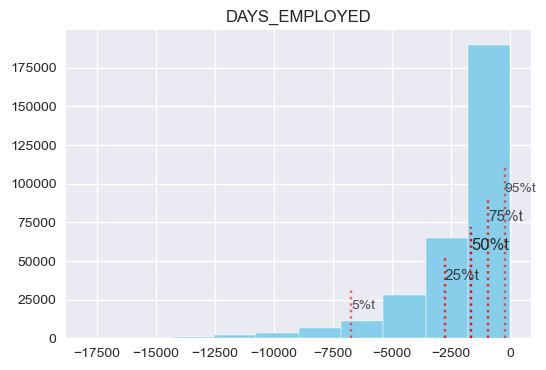

moy:      0.1
5%tile:   0.0
25%tile:  0.1
50%tile:  0.1
75%tile:  0.2
95%tile:  0.4


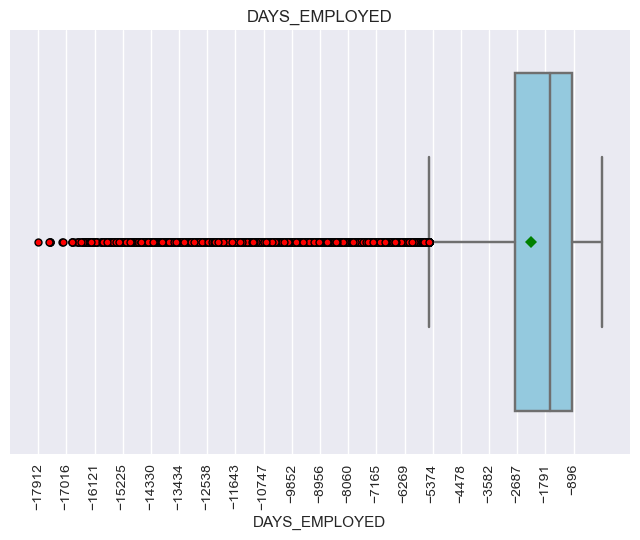

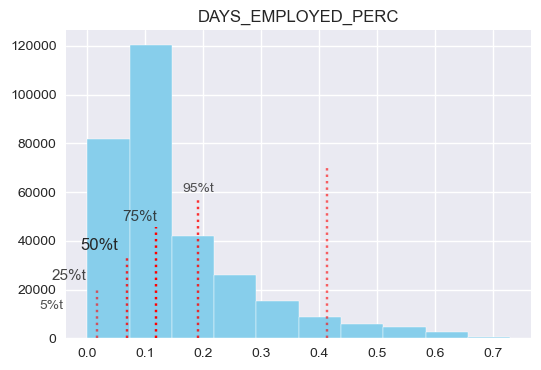

moy:      -2994.2
5%tile:   -4944.0
25%tile:  -4299.0
50%tile:  -3254.0
75%tile:  -1720.0
95%tile:  -375.0


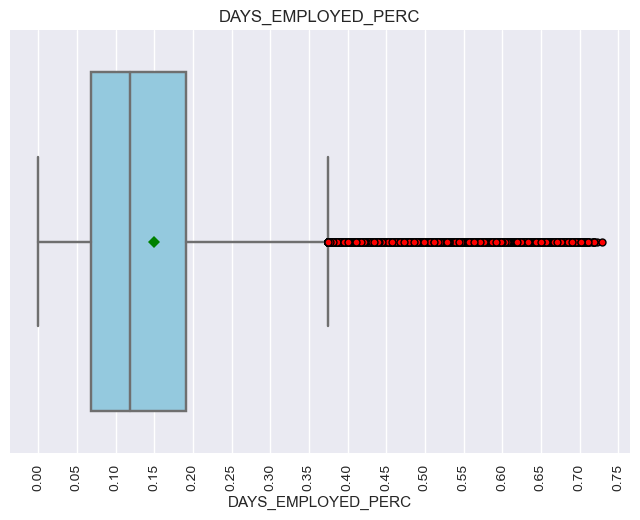

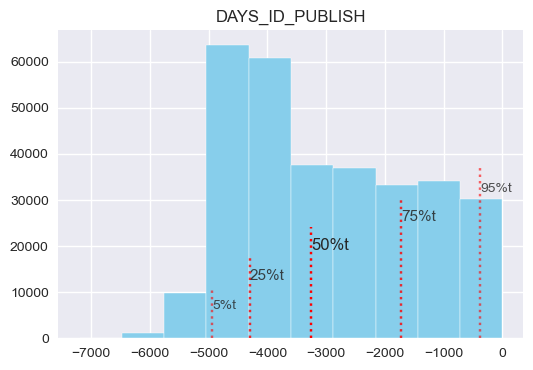

moy:      -962.8
5%tile:   -2522.0
25%tile:  -1570.0
50%tile:  -757.0
75%tile:  -274.0
95%tile:  0.0


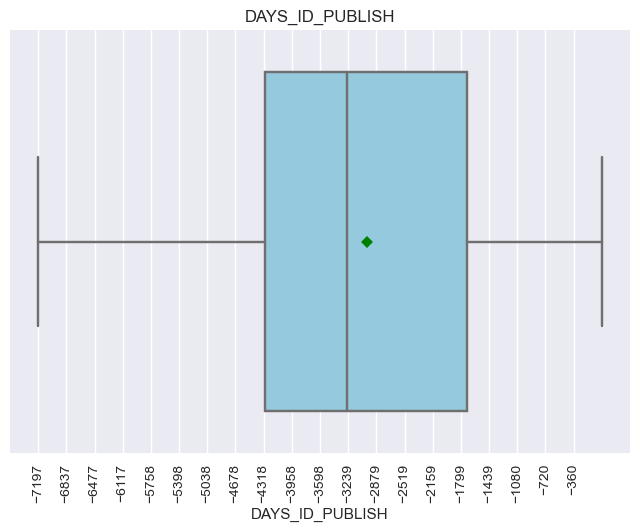

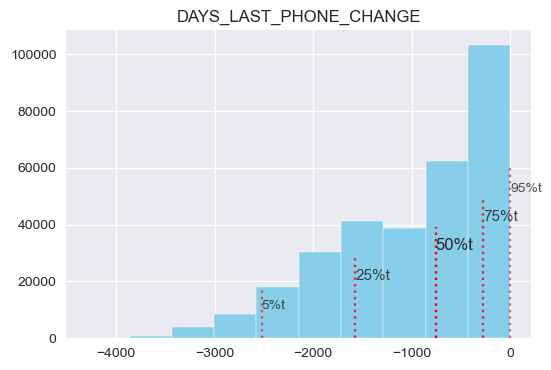

moy:      -4986.1
5%tile:   -11416.0
25%tile:  -7480.0
50%tile:  -4504.0
75%tile:  -2009.0
95%tile:  -330.0


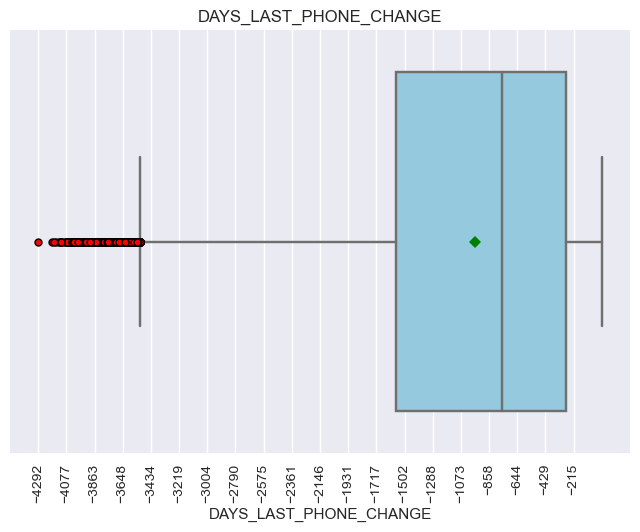

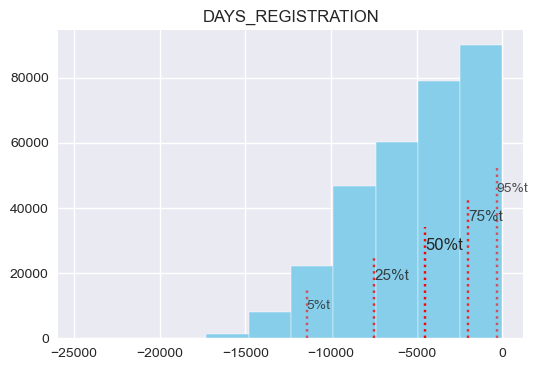

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


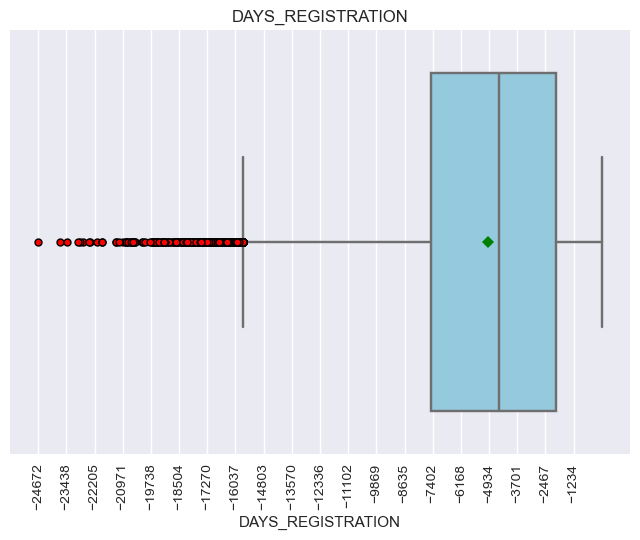

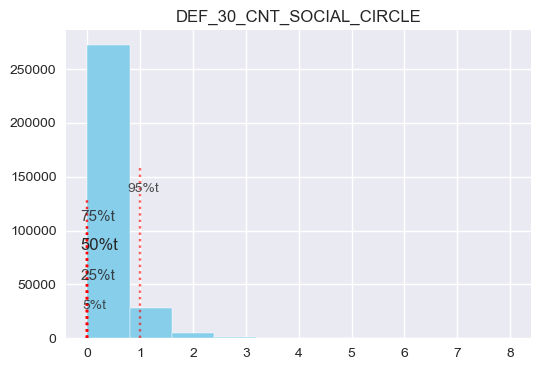

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


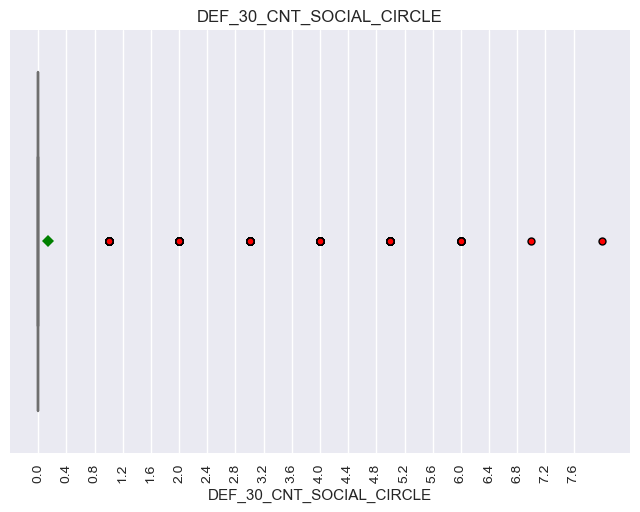

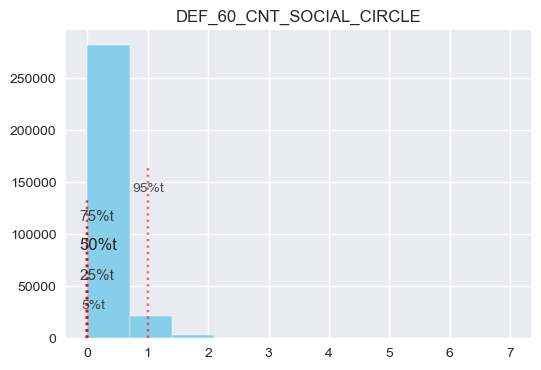

moy:      0.5
5%tile:   0.0
25%tile:  0.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.0


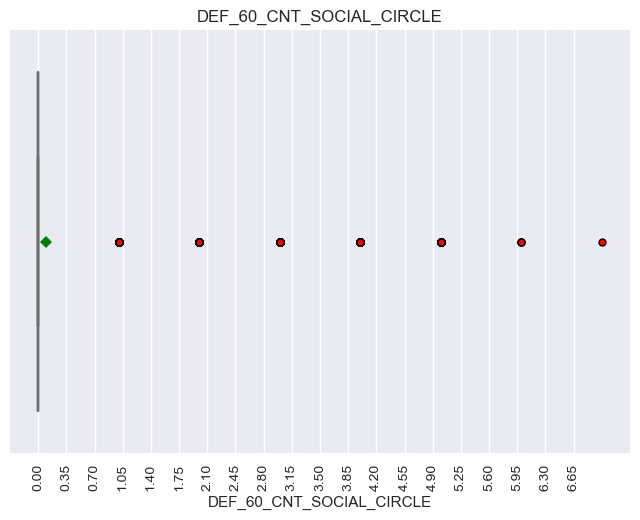

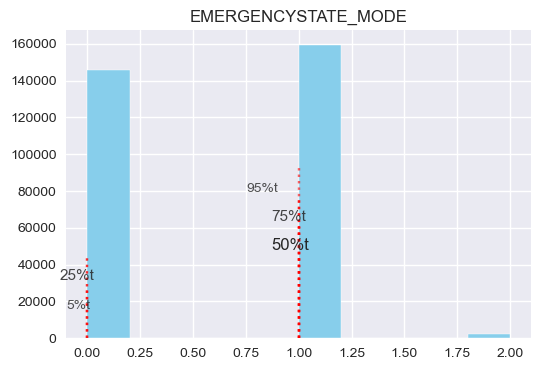

moy:      0.5
5%tile:   0.1
25%tile:  0.4
50%tile:  0.6
75%tile:  0.7
95%tile:  0.7


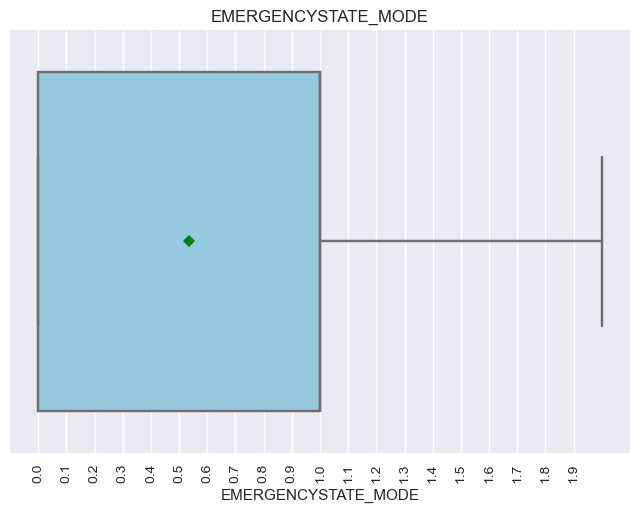

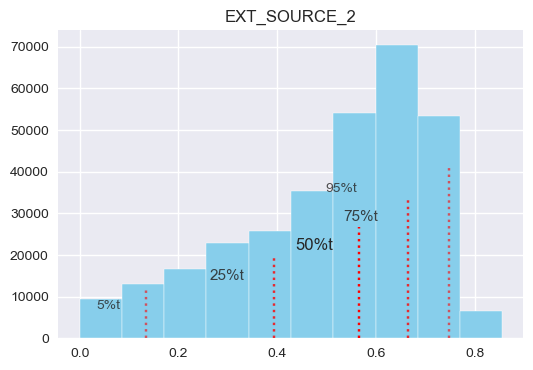

moy:      0.5
5%tile:   0.2
25%tile:  0.4
50%tile:  0.5
75%tile:  0.6
95%tile:  0.8


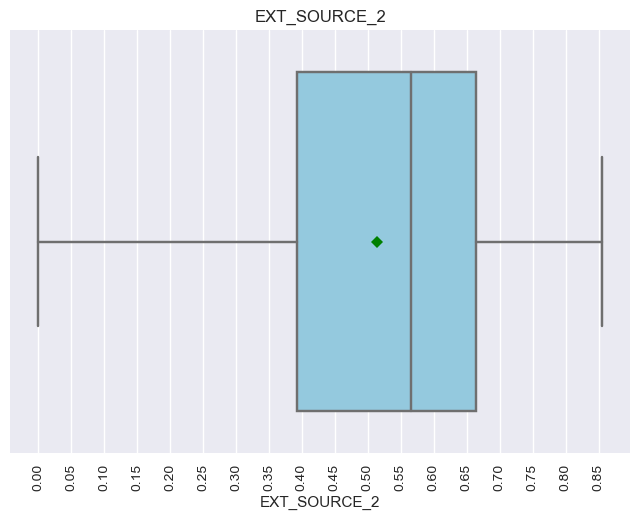

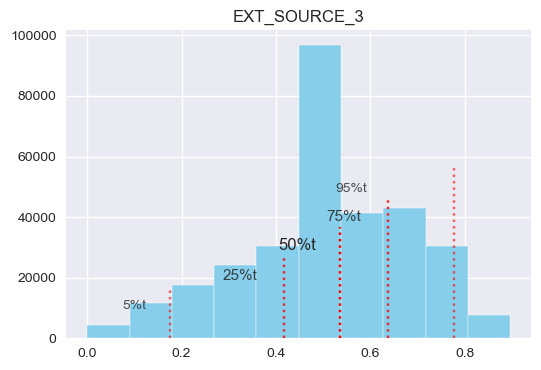

moy:      1.0
5%tile:   1.0
25%tile:  1.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.0


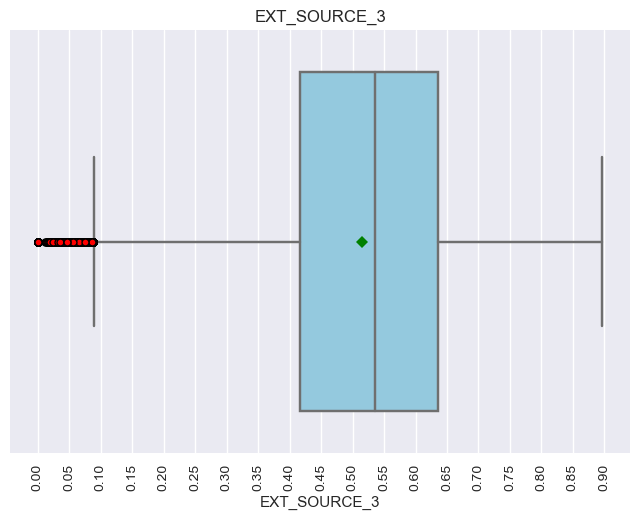

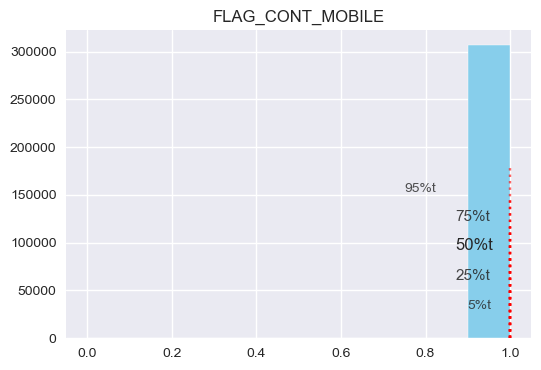

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


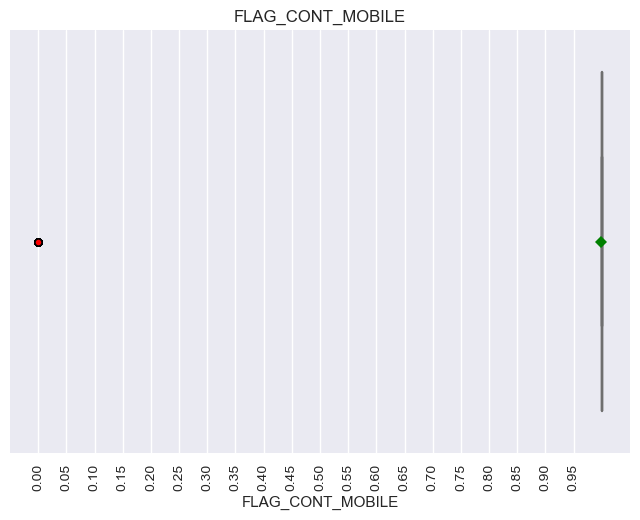

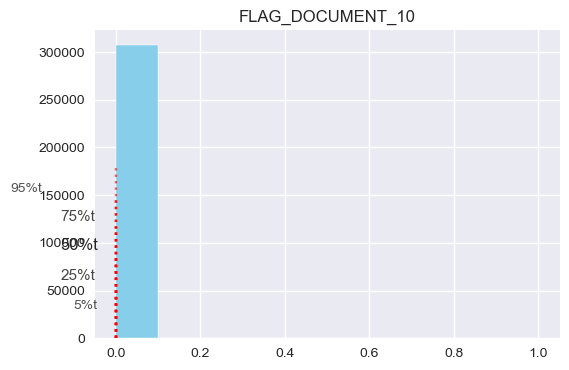

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


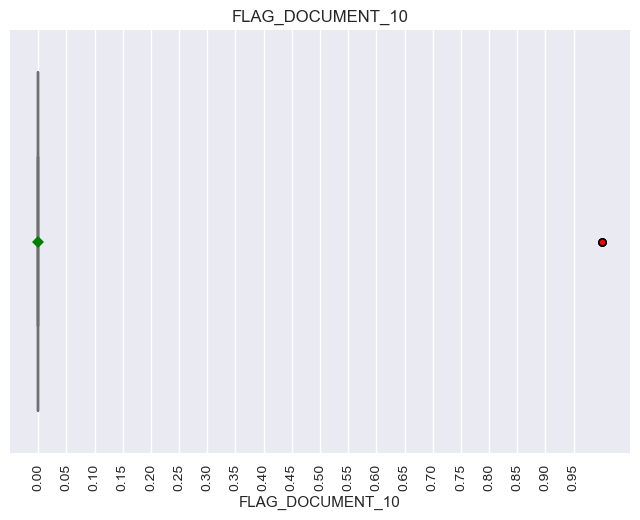

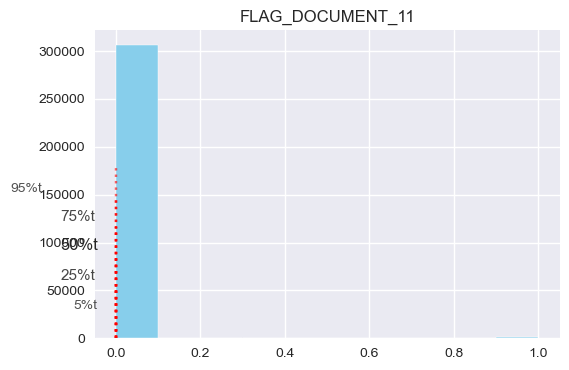

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


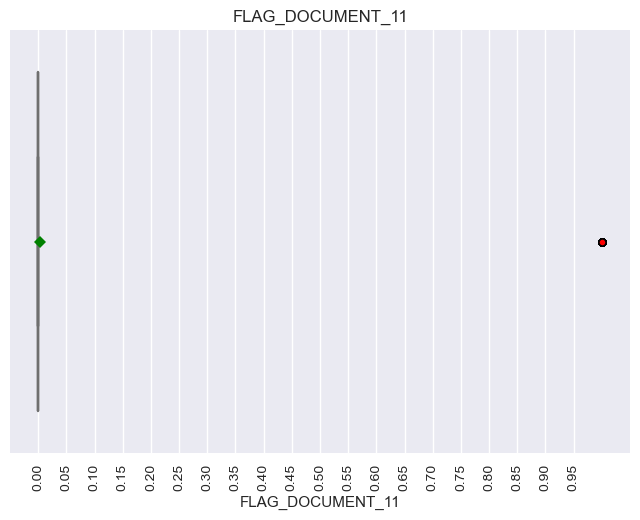

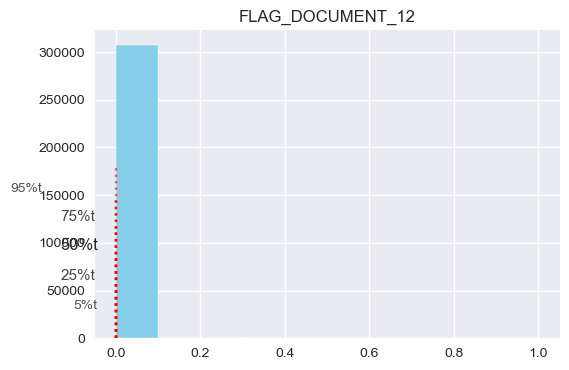

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


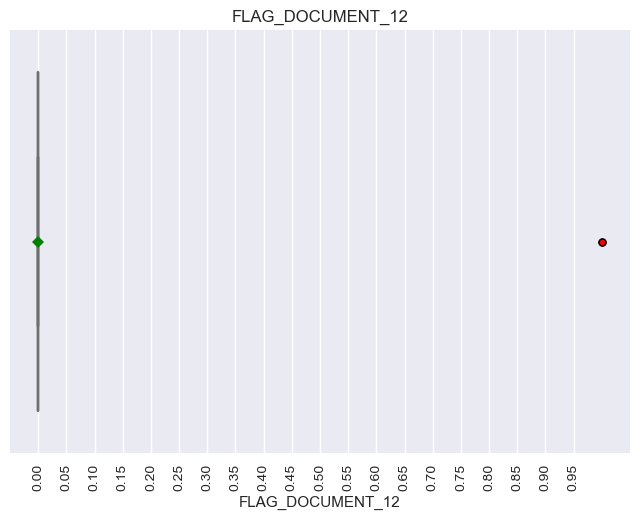

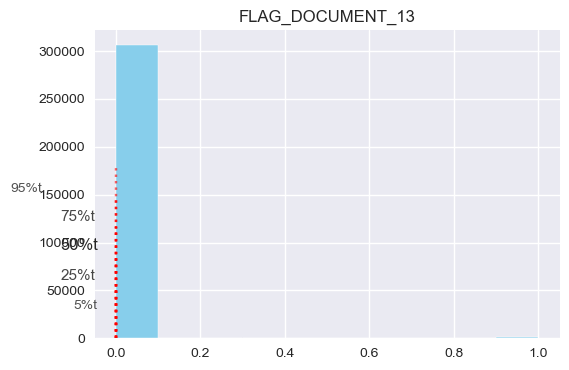

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


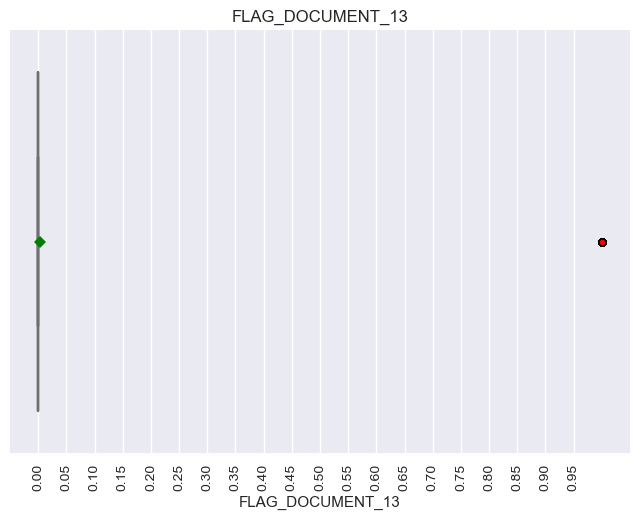

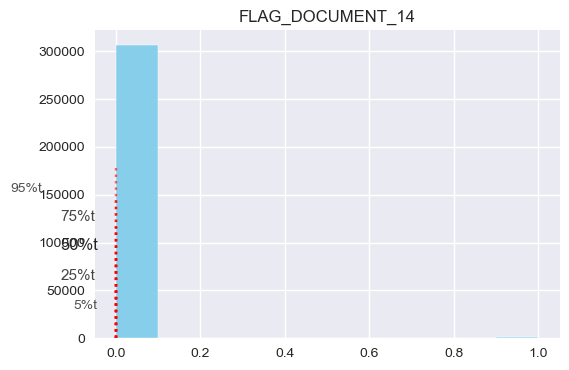

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


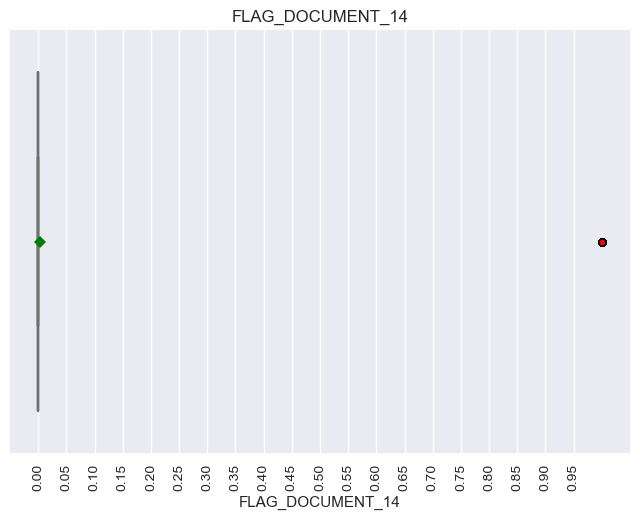

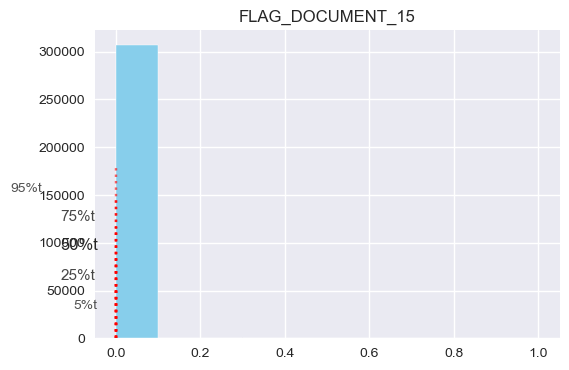

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


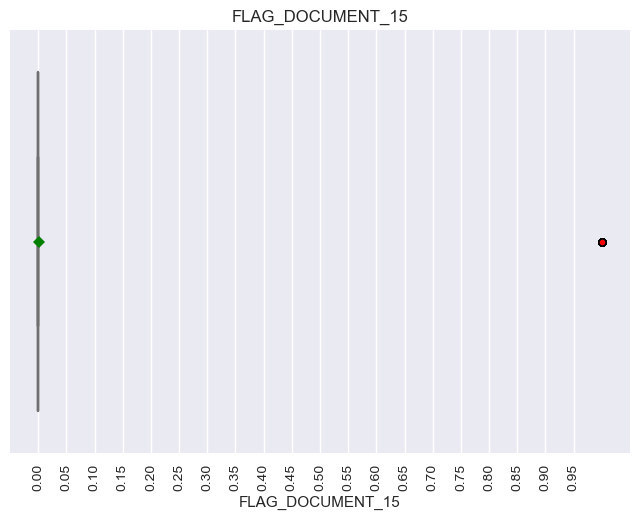

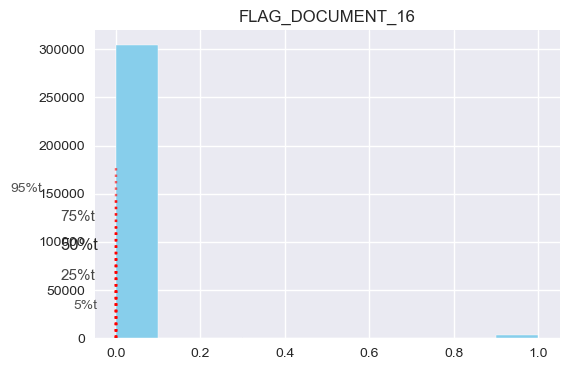

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


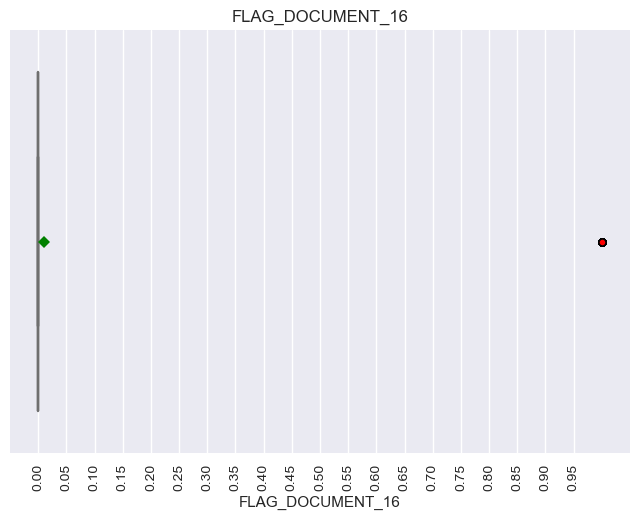

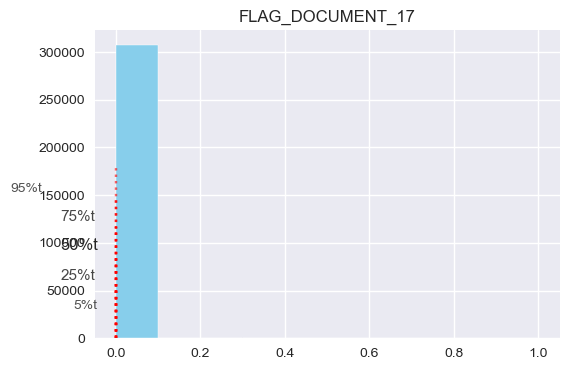

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


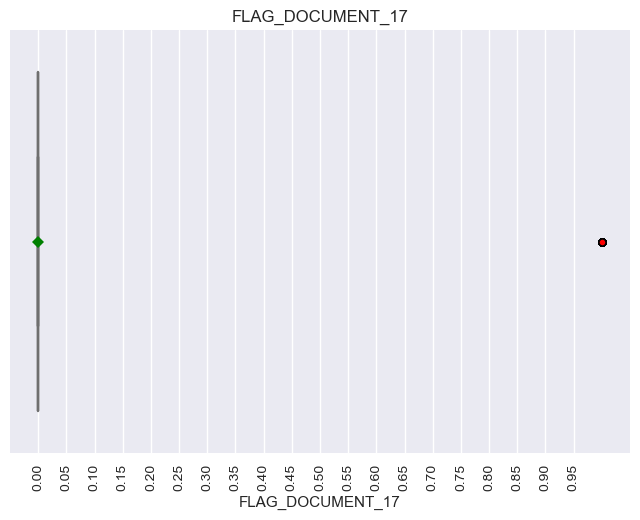

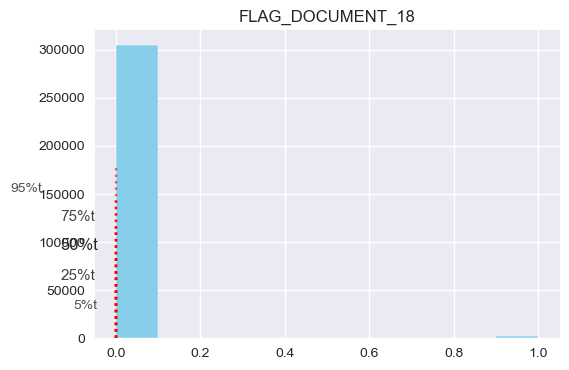

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


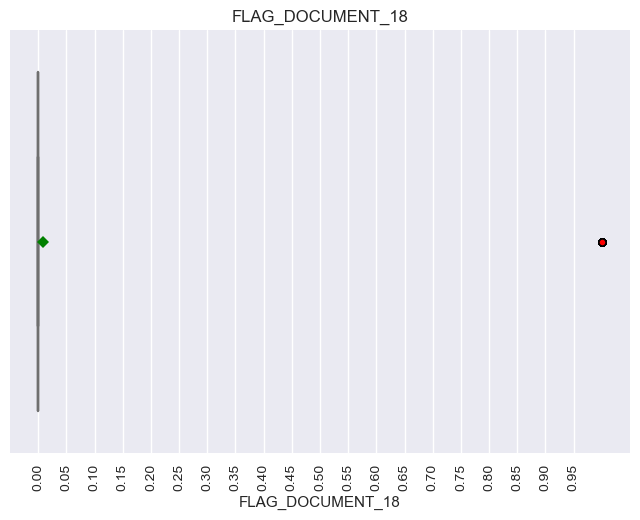

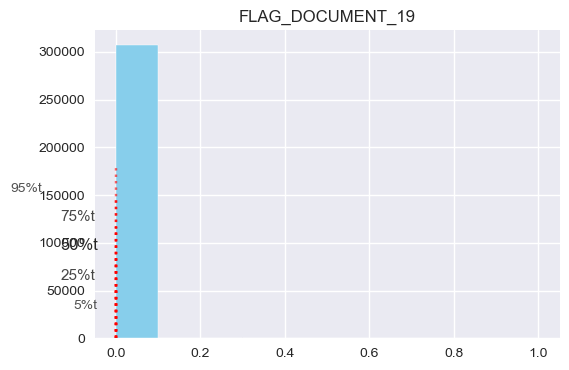

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


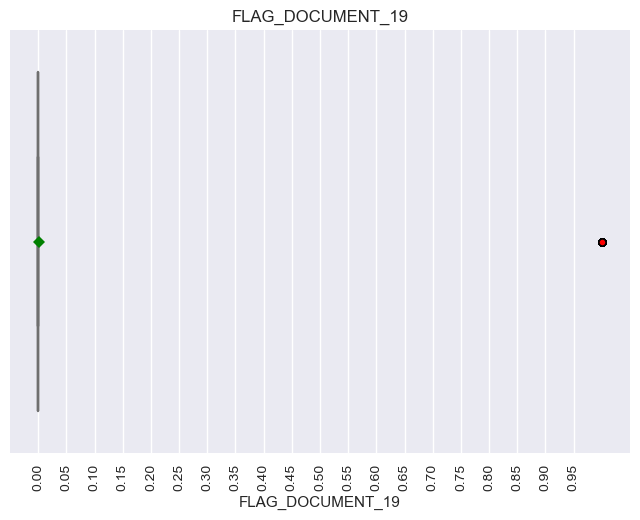

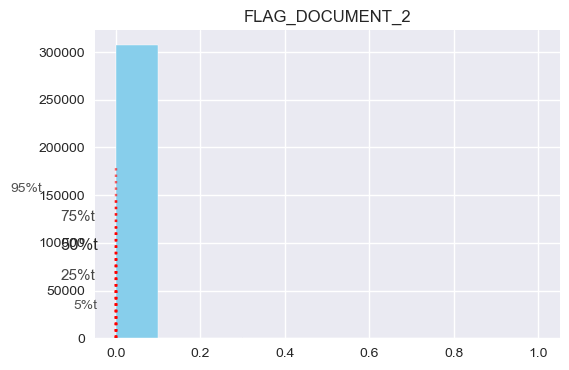

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


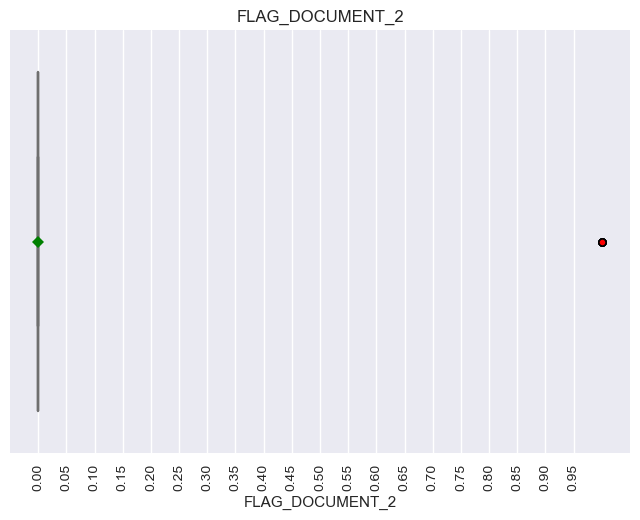

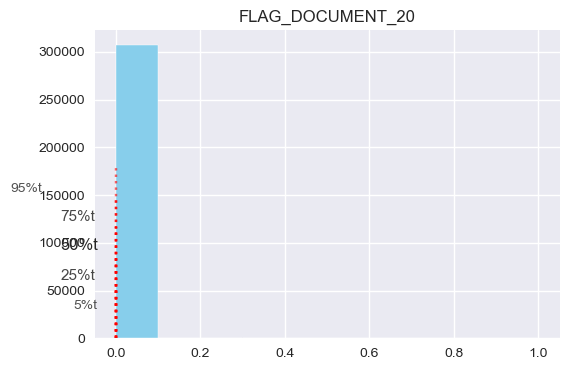

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


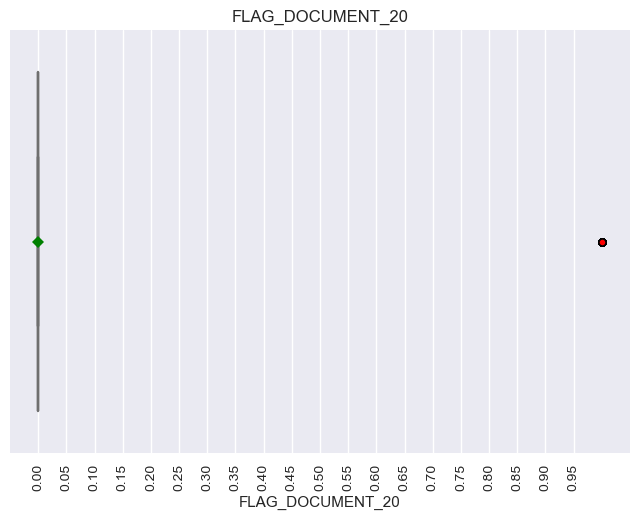

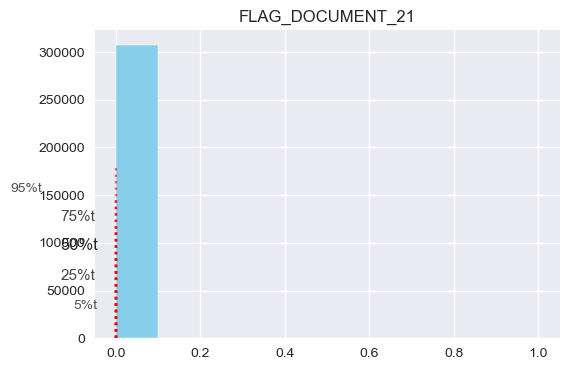

moy:      0.7
5%tile:   0.0
25%tile:  0.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.0


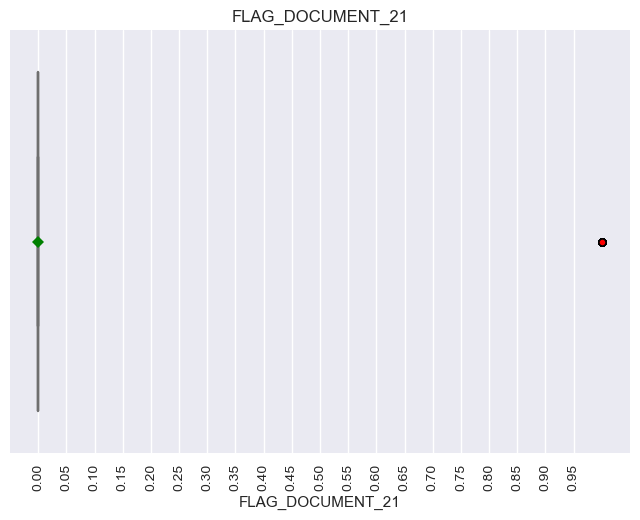

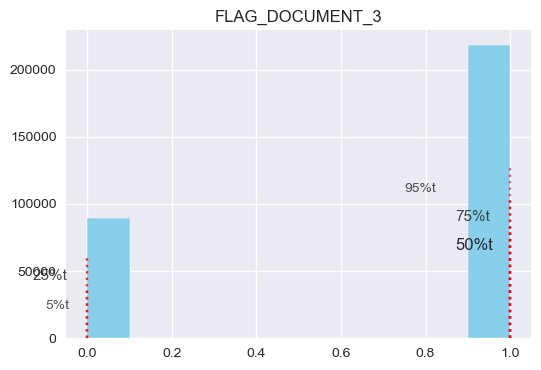

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


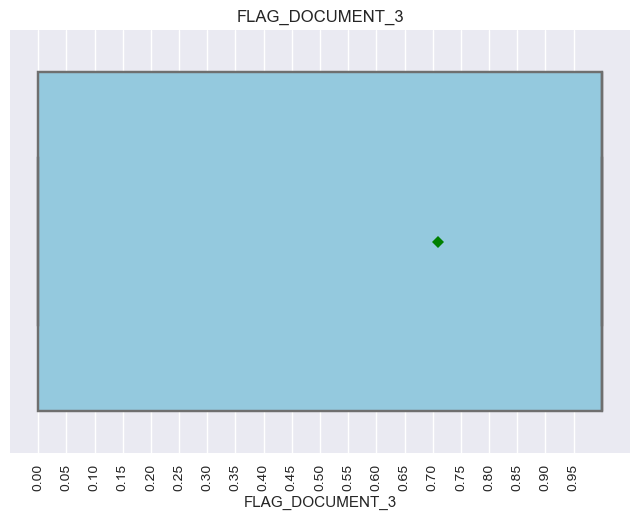

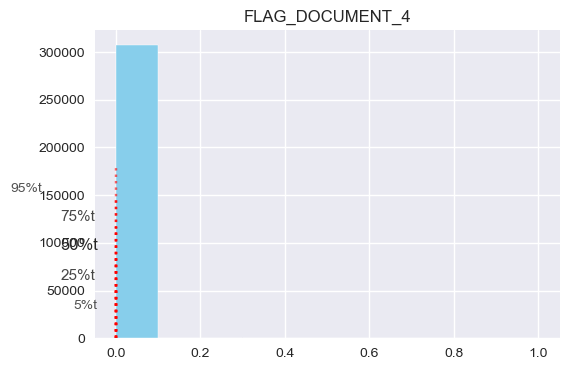

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


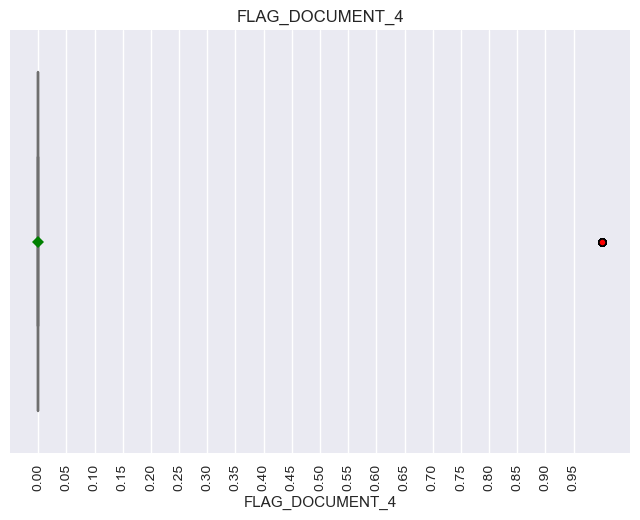

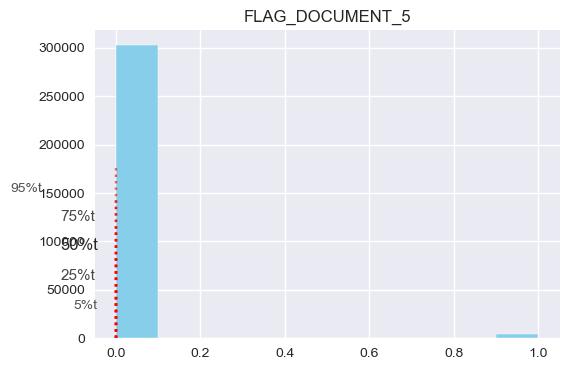

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


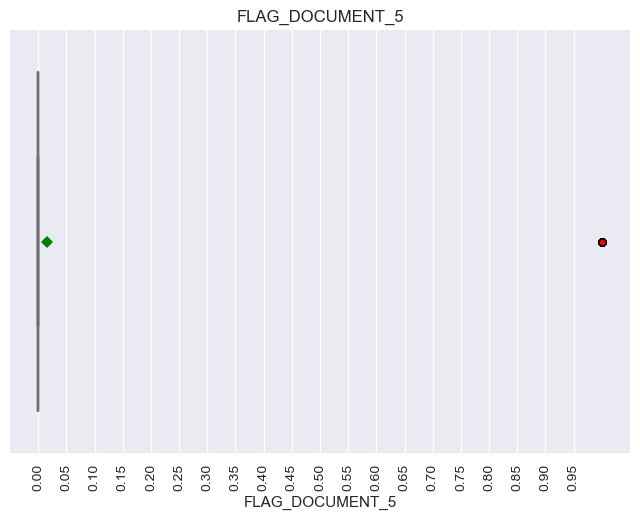

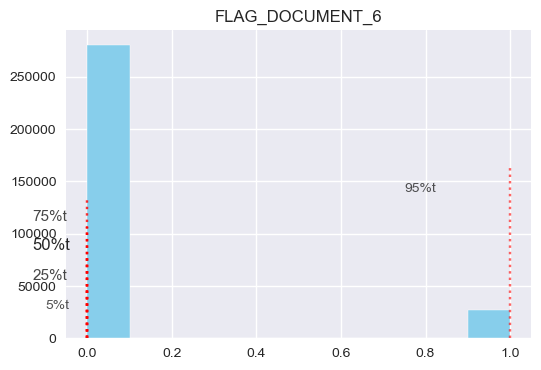

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


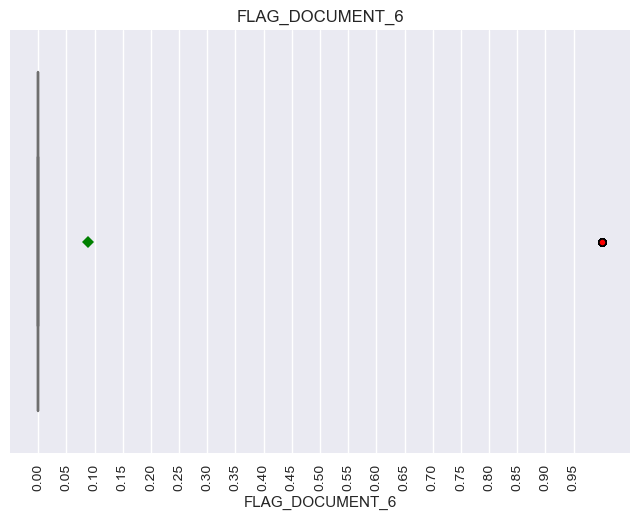

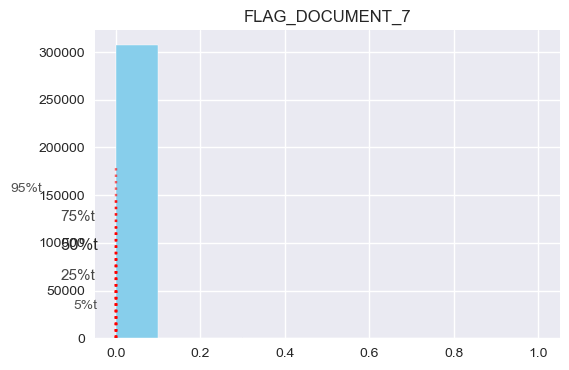

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


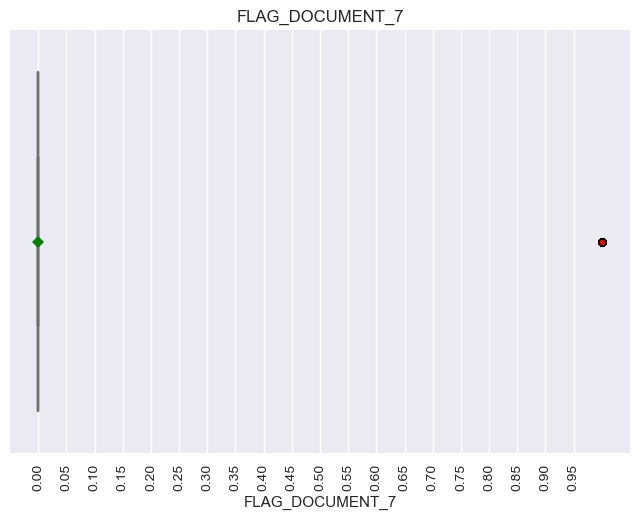

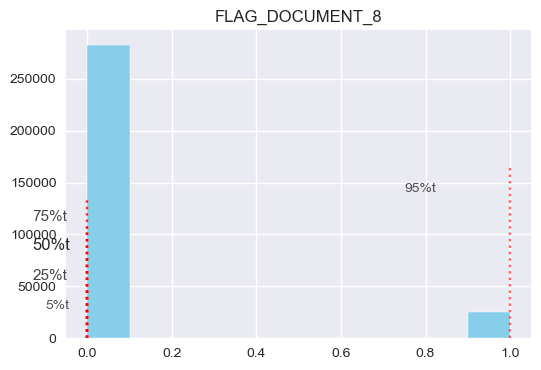

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


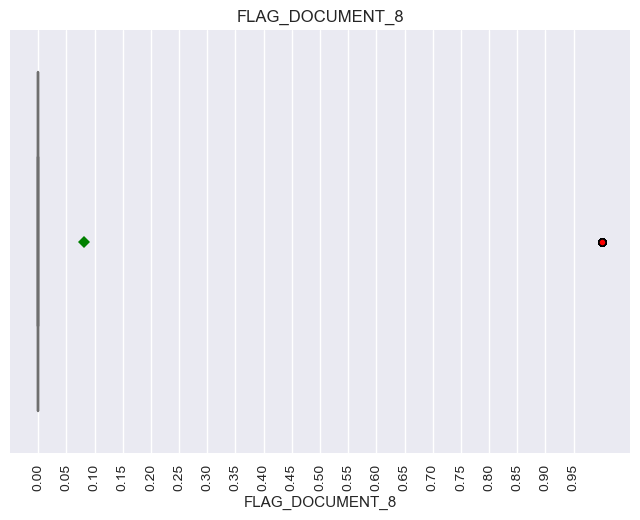

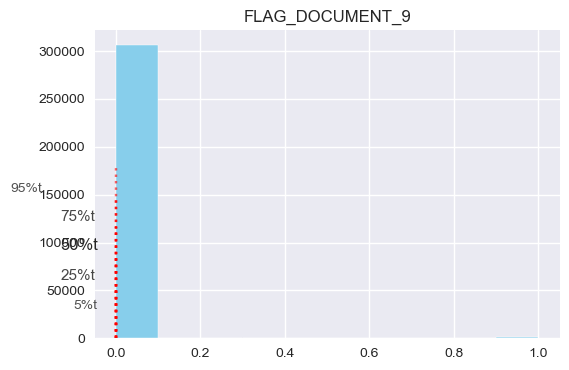

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


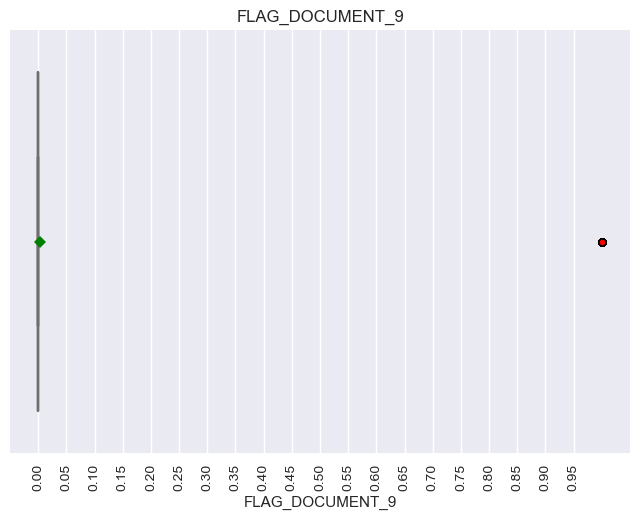

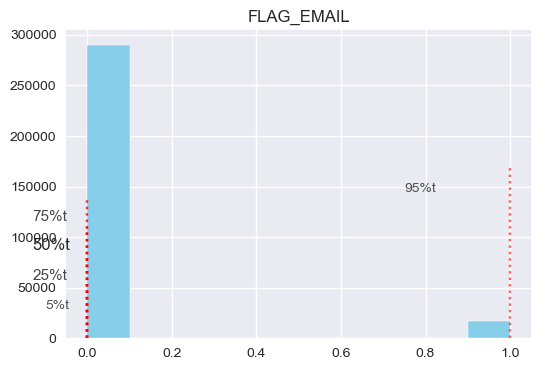

moy:      0.8
5%tile:   0.0
25%tile:  1.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.0


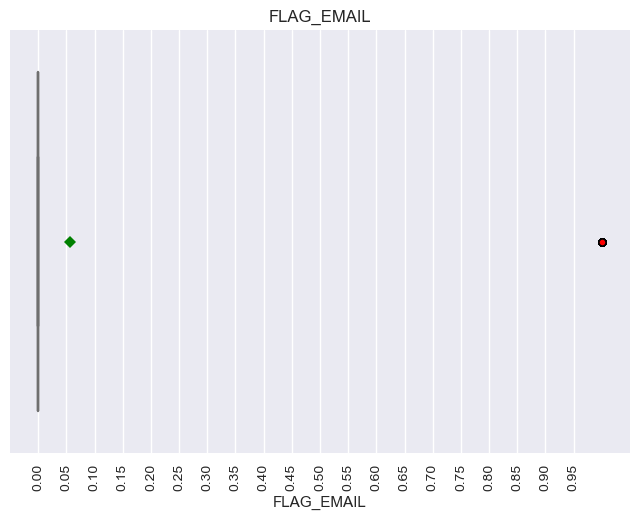

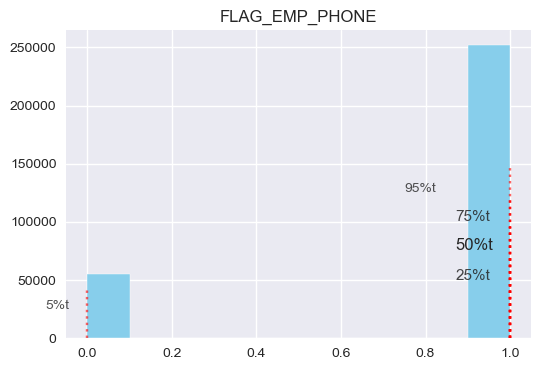

moy:      1.0
5%tile:   1.0
25%tile:  1.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.0


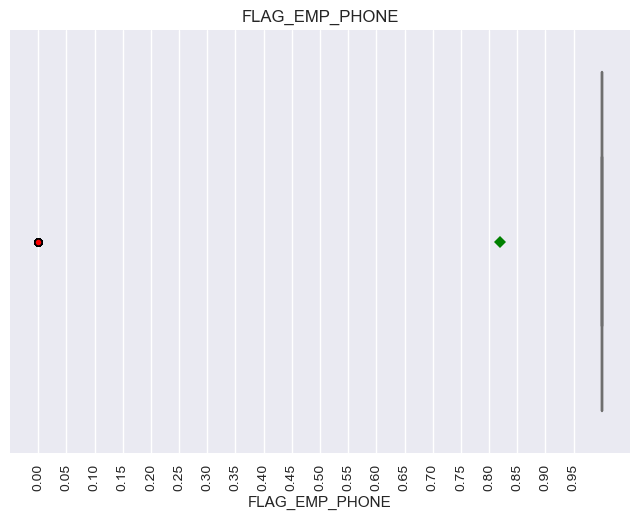

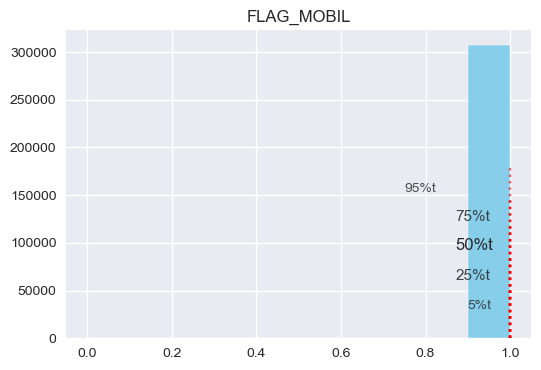

moy:      0.3
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  1.0
95%tile:  1.0


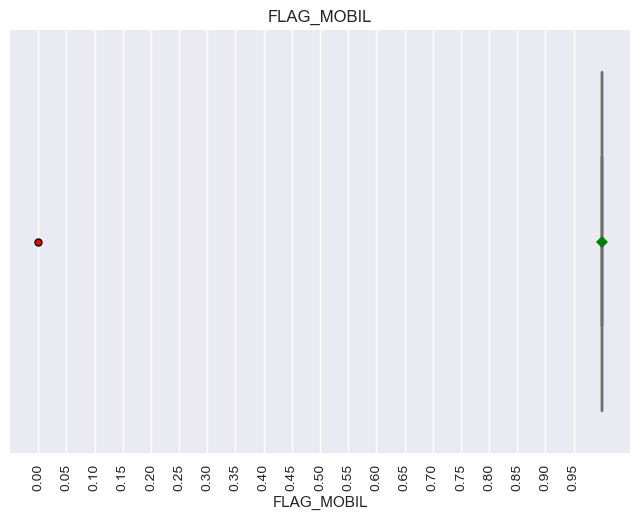

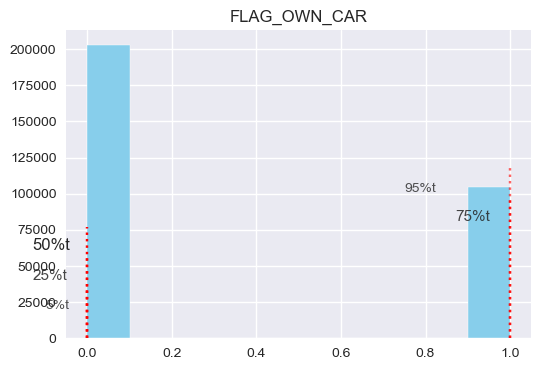

moy:      0.7
5%tile:   0.0
25%tile:  0.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.0


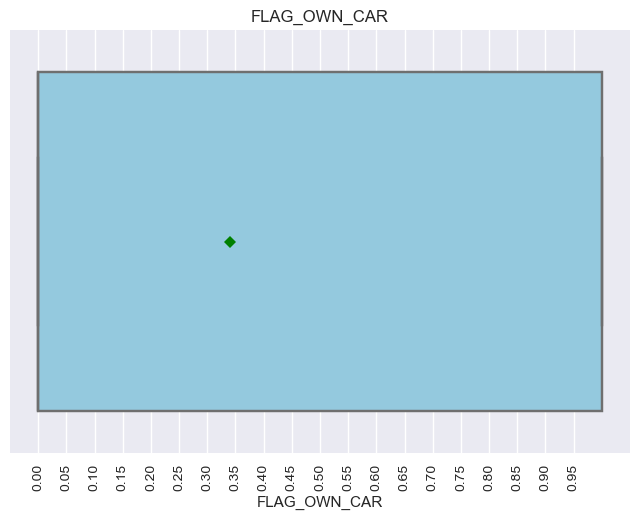

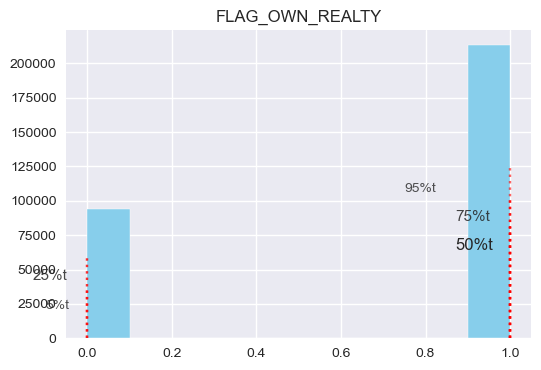

moy:      0.3
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  1.0
95%tile:  1.0


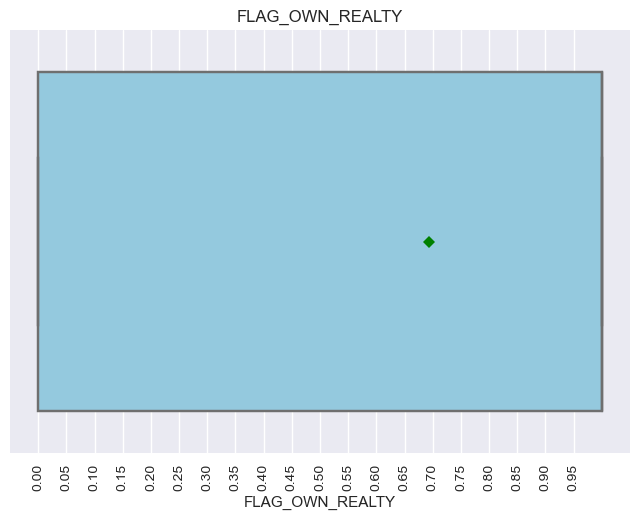

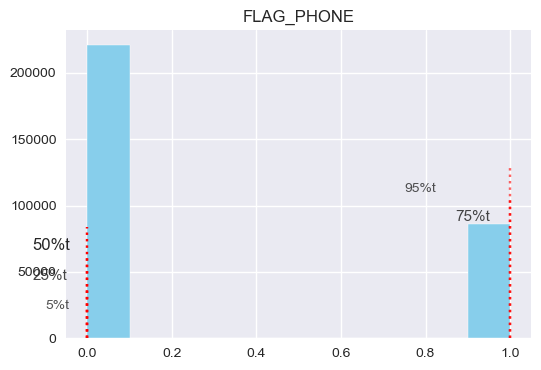

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


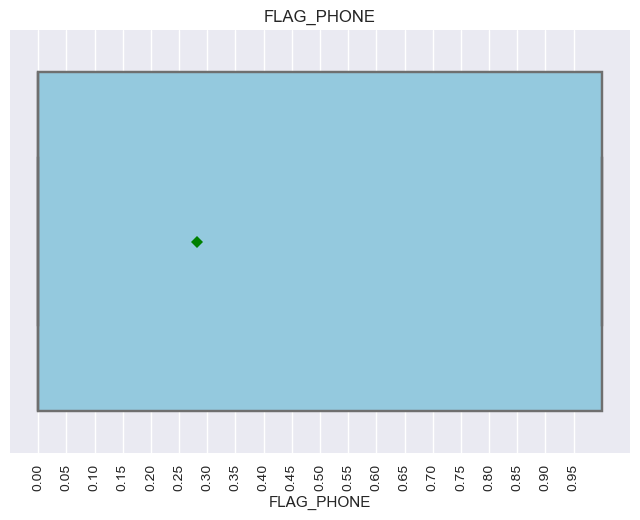

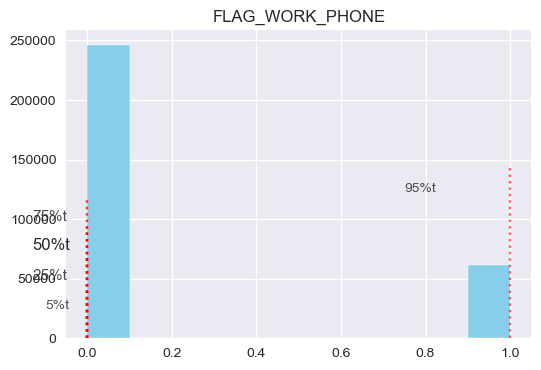

moy:      0.9
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  3.0
95%tile:  3.0


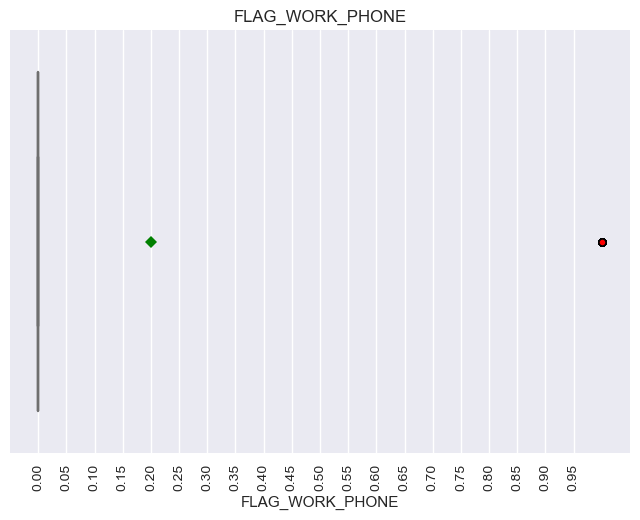

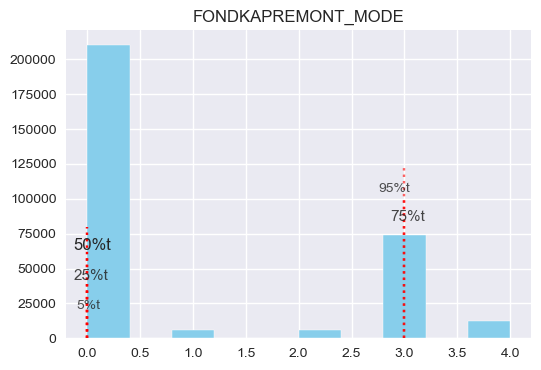

moy:      12.1
5%tile:   7.0
25%tile:  10.0
50%tile:  12.0
75%tile:  14.0
95%tile:  17.0


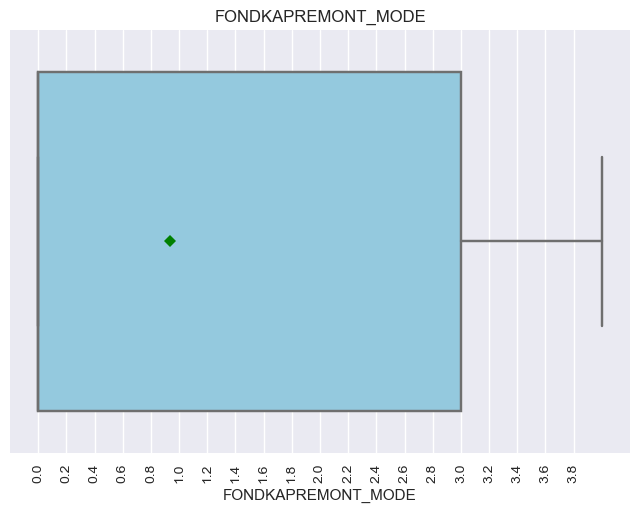

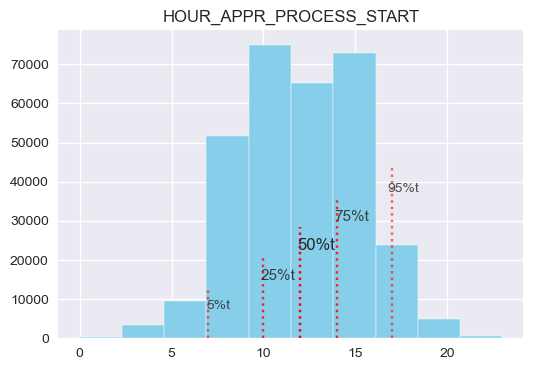

moy:      0.5
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  1.0
95%tile:  1.0


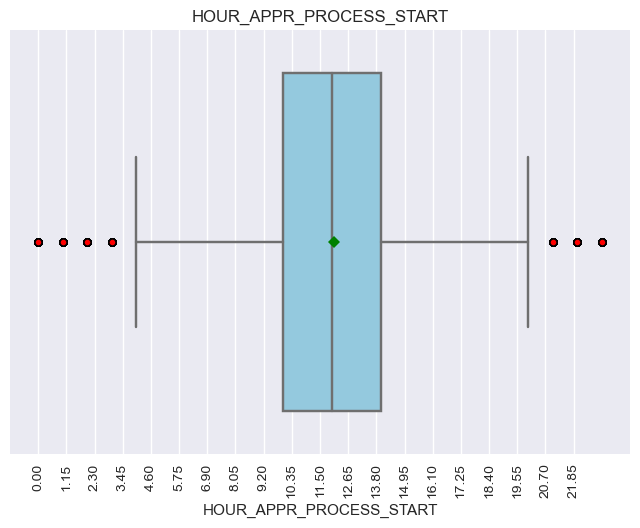

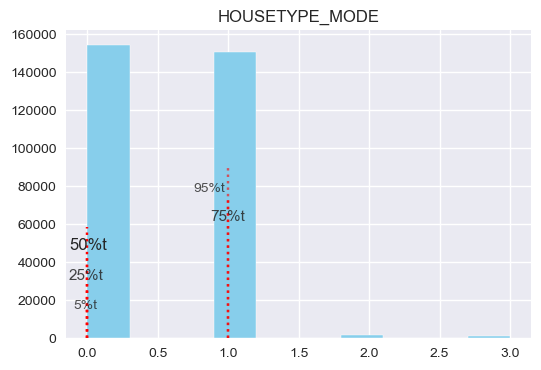

moy:      0.4
5%tile:   0.1
25%tile:  0.2
50%tile:  0.3
75%tile:  0.5
95%tile:  1.0


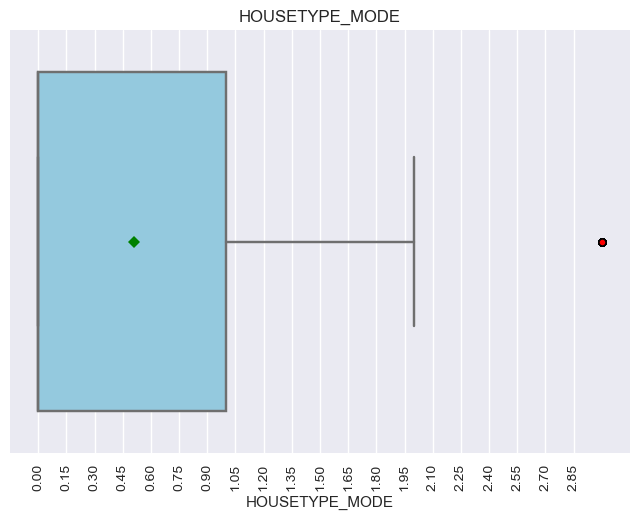

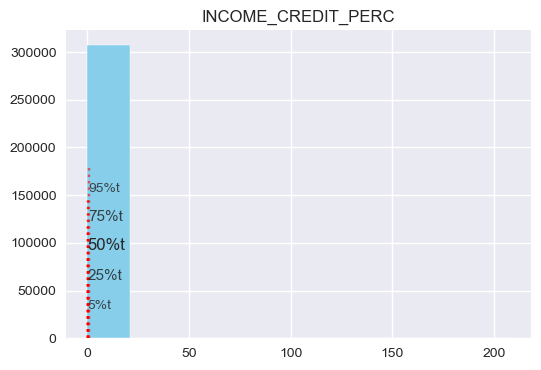

moy:      93107.4
5%tile:   27000.0
25%tile:  47250.0
50%tile:  75000.0
75%tile:  112500.0
95%tile:  225000.0


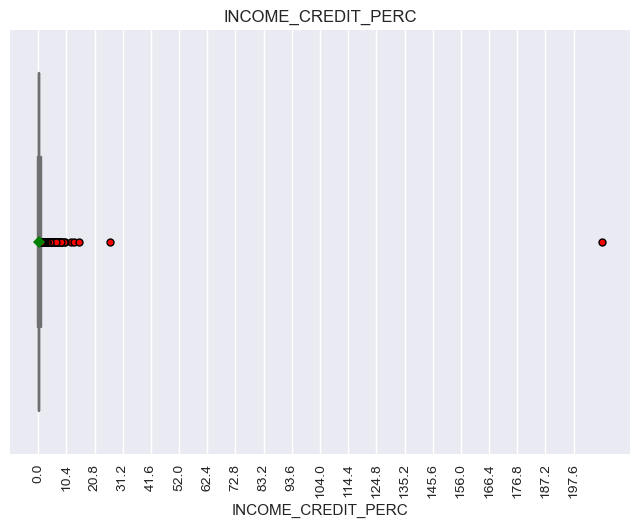

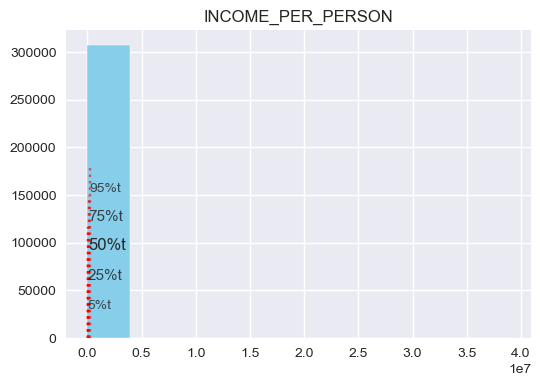

moy:      131123.5
5%tile:   5715.7
25%tile:  14685.8
50%tile:  35341.9
75%tile:  119333.8
95%tile:  650969.2


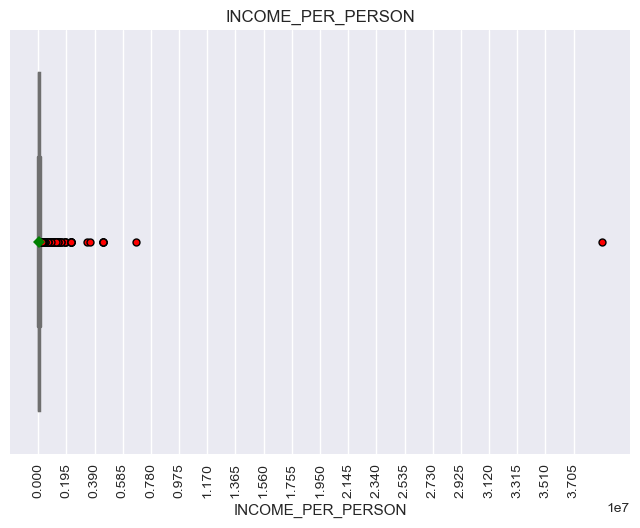

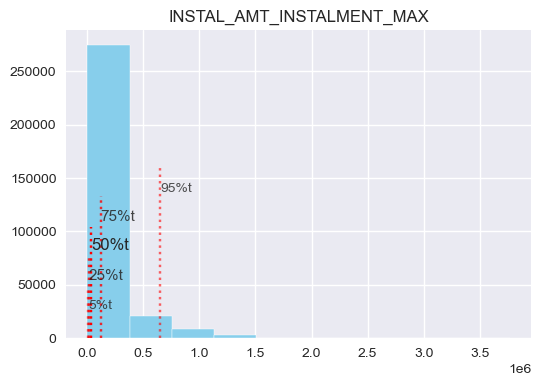

moy:      18092.2
5%tile:   4082.1
25%tile:  8041.1
50%tile:  12572.7
75%tile:  20598.6
95%tile:  49524.5


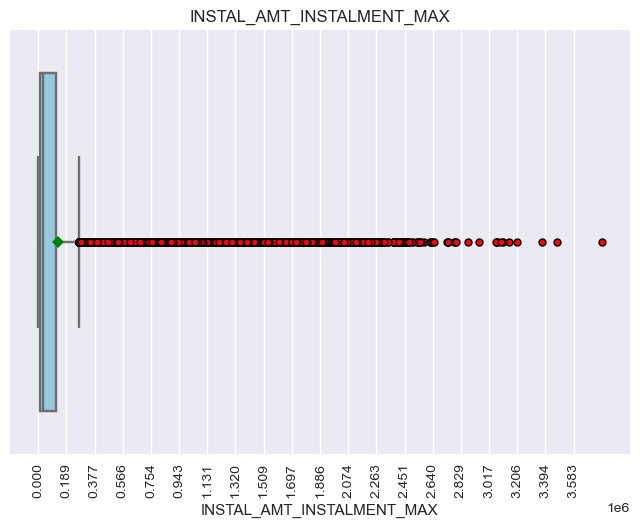

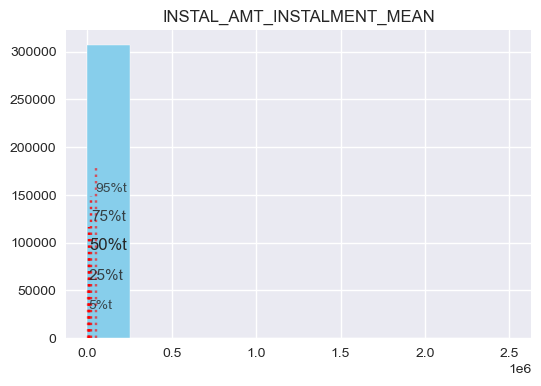

moy:      654674.9
5%tile:   44223.4
25%tile:  141556.7
50%tile:  328372.2
75%tile:  796420.4
95%tile:  2447043.8


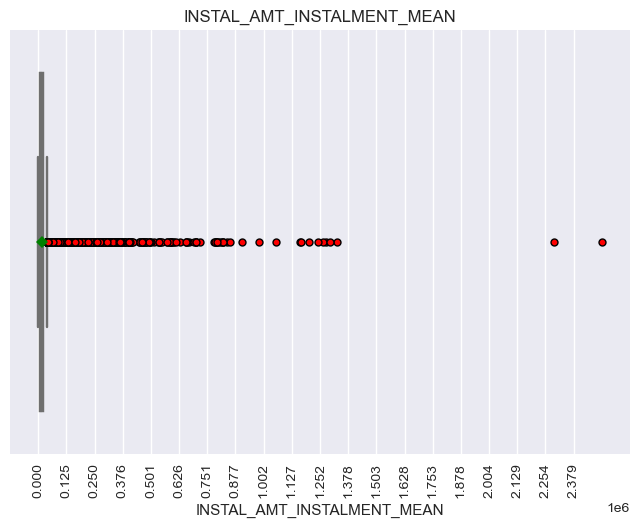

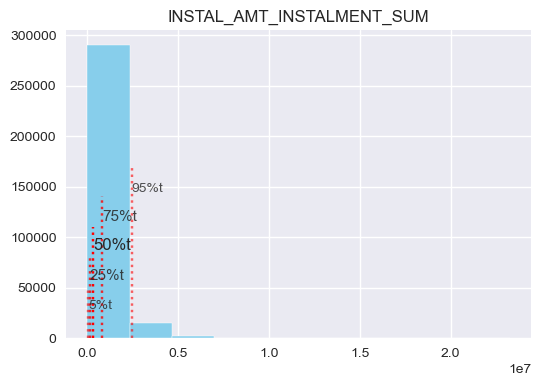

moy:      132898.1
5%tile:   5726.9
25%tile:  14770.5
50%tile:  36000.0
75%tile:  121901.8
95%tile:  666534.0


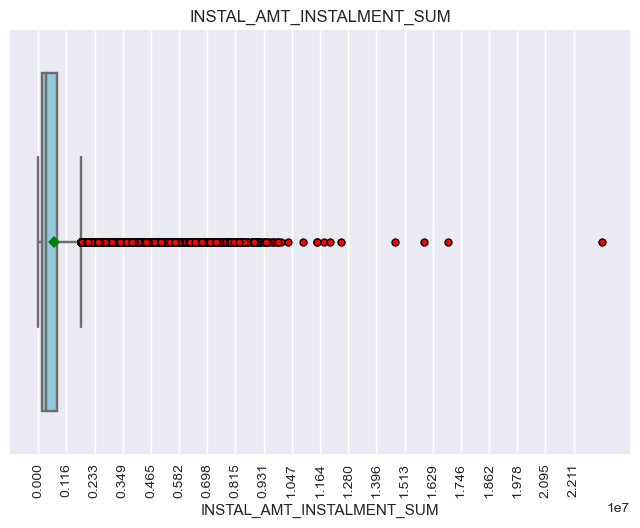

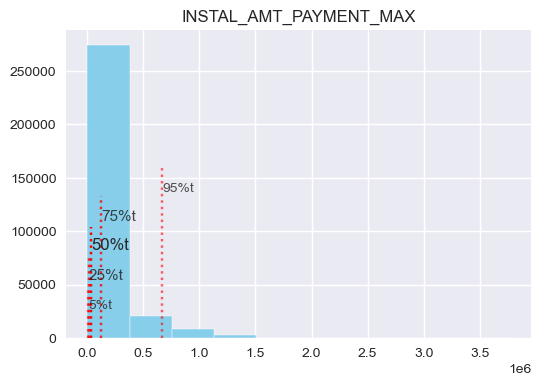

moy:      18416.5
5%tile:   3846.5
25%tile:  7710.6
50%tile:  12225.8
75%tile:  20529.1
95%tile:  52792.6


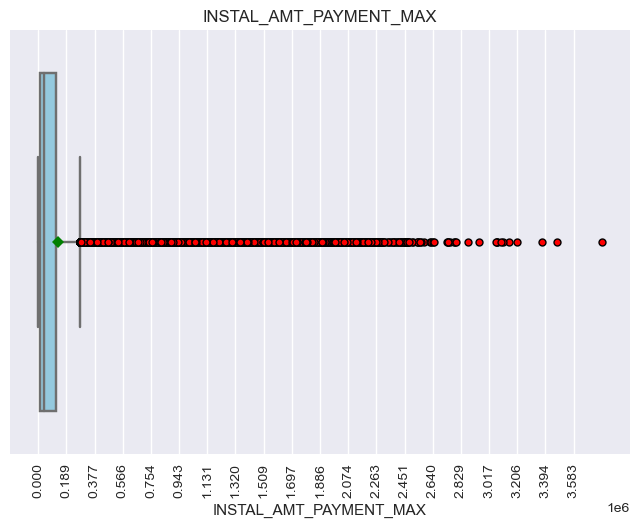

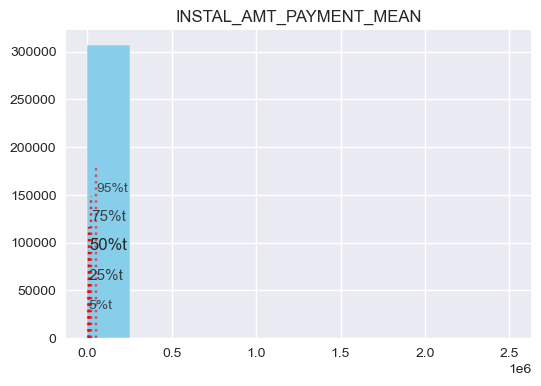

moy:      5049.3
5%tile:   1.4
25%tile:  49.4
50%tile:  2314.8
75%tile:  6758.6
95%tile:  17878.6


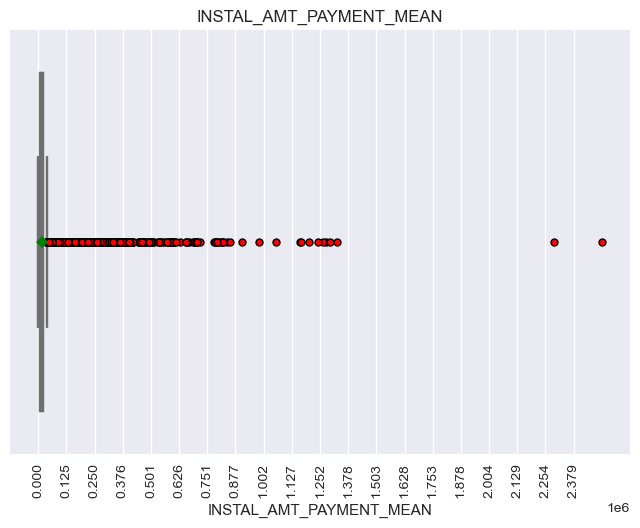

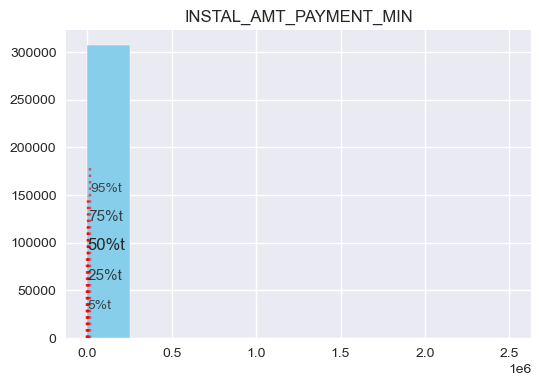

moy:      659997.5
5%tile:   42853.1
25%tile:  137614.2
50%tile:  318619.5
75%tile:  786485.5
95%tile:  2530468.4


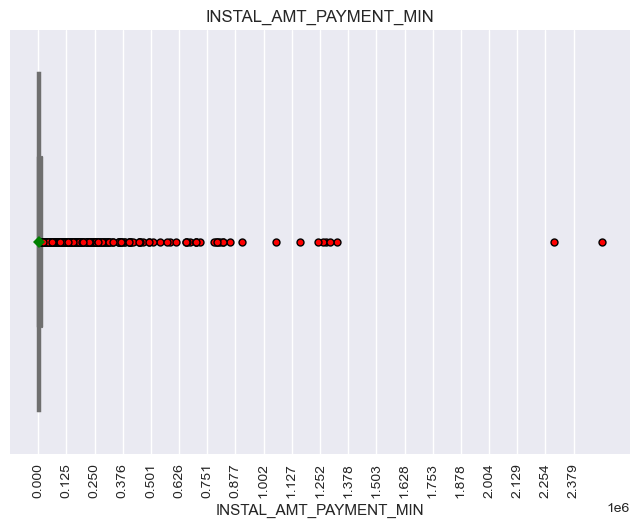

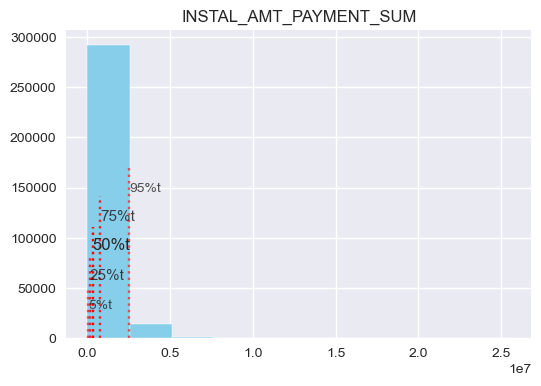

moy:      39.0
5%tile:   6.0
25%tile:  12.0
50%tile:  25.0
75%tile:  48.0
95%tile:  128.0


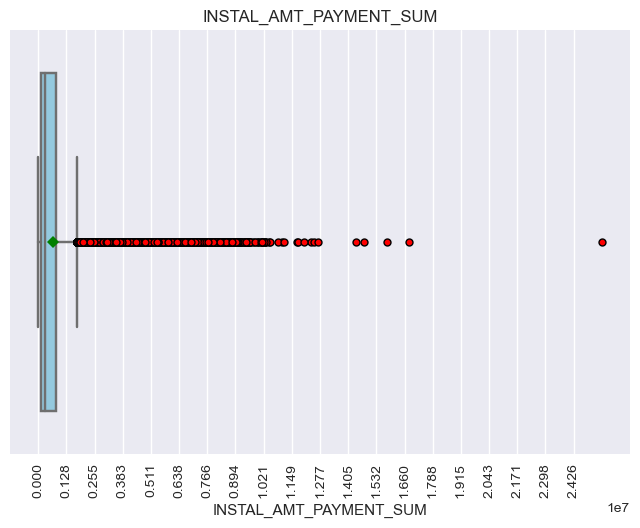

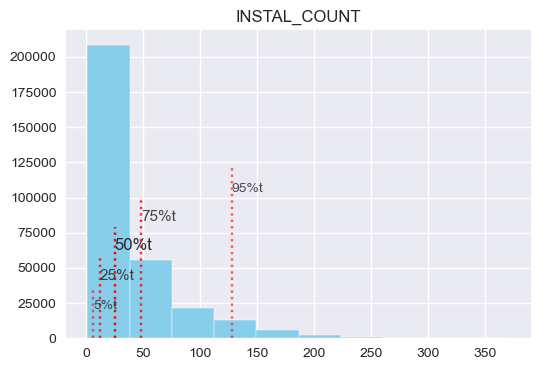

moy:      -314.3
5%tile:   -1601.0
25%tile:  -359.0
50%tile:  -66.0
75%tile:  -27.0
95%tile:  -9.0


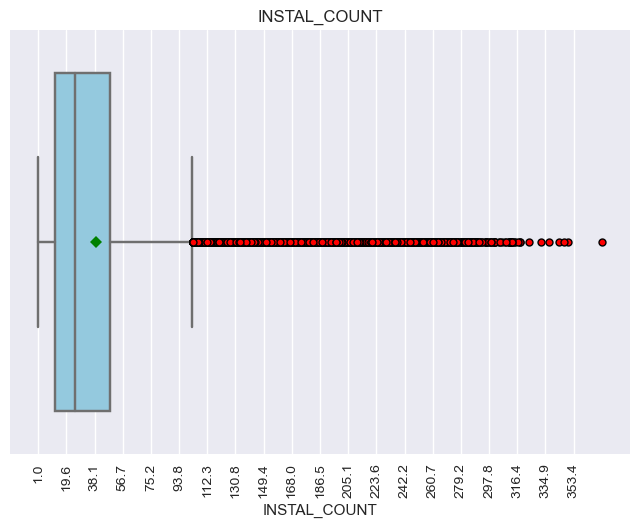

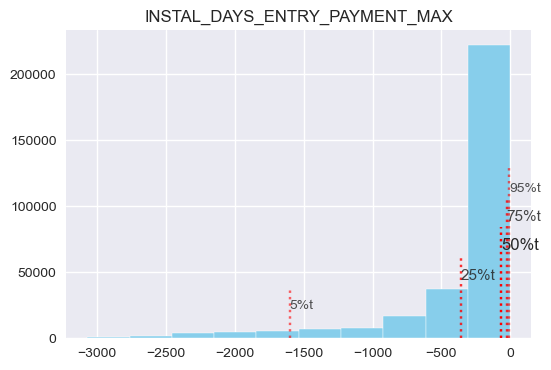

moy:      -915.1
5%tile:   -2052.2
25%tile:  -1281.5
50%tile:  -807.6
75%tile:  -450.5
95%tile:  -172.4


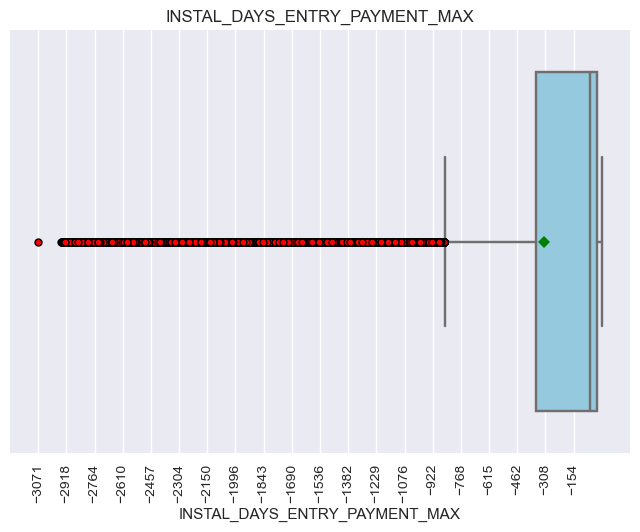

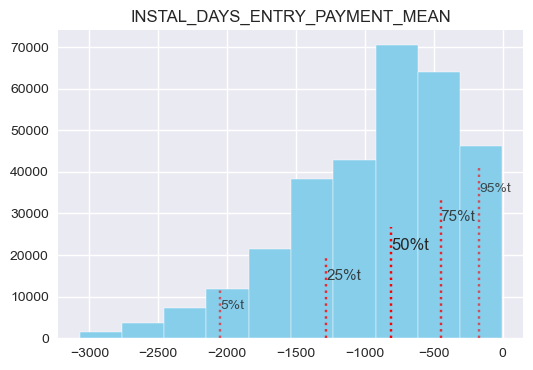

moy:      -40657.2
5%tile:   -170151.4
25%tile:  -46853.0
50%tile:  -21128.0
75%tile:  -7396.0
95%tile:  -1534.0


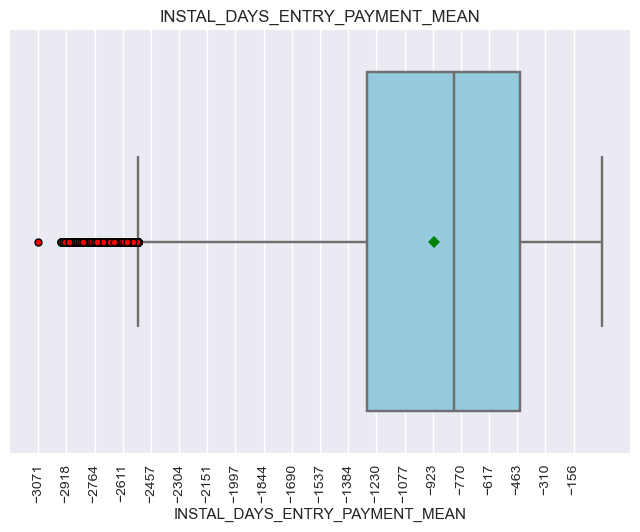

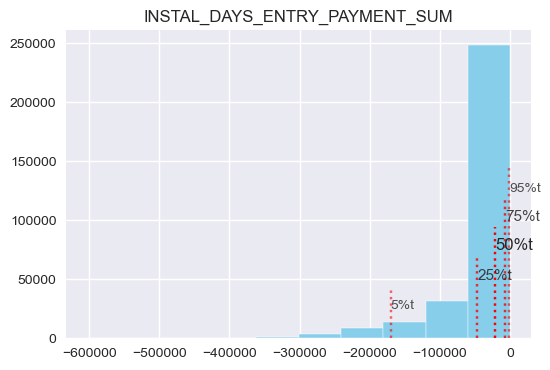

moy:      37.5
5%tile:   12.0
25%tile:  23.0
50%tile:  31.0
75%tile:  42.0
95%tile:  84.0


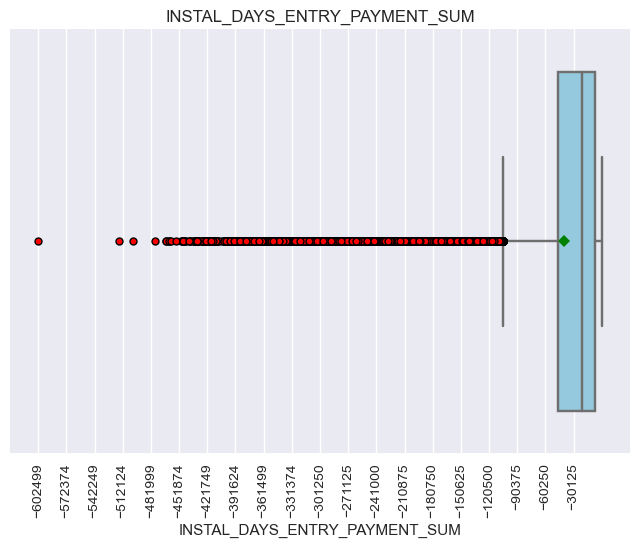

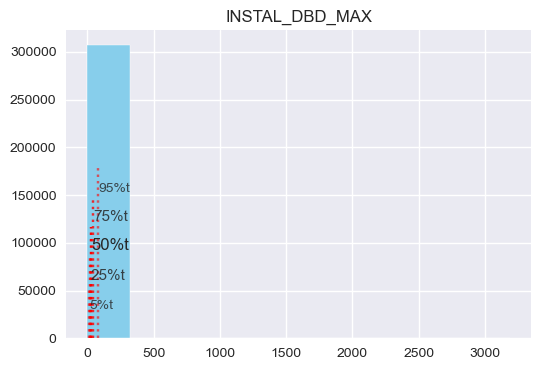

moy:      12.2
5%tile:   3.3
25%tile:  6.9
50%tile:  10.1
75%tile:  14.8
95%tile:  27.7


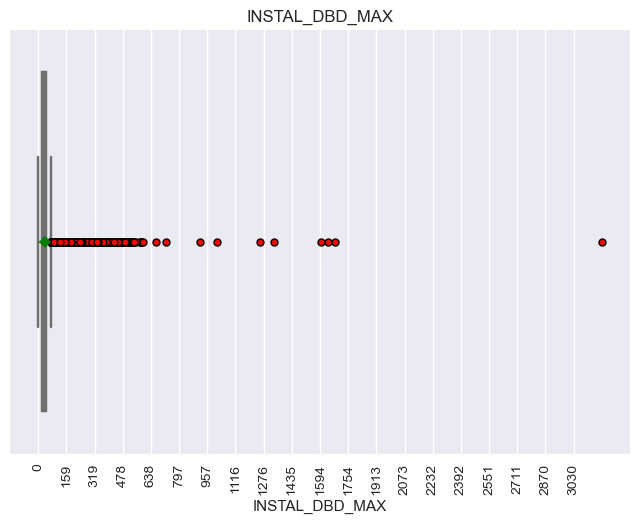

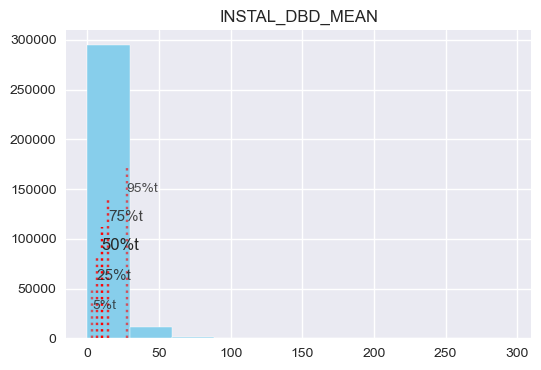

moy:      384.2
5%tile:   47.0
25%tile:  139.0
50%tile:  266.0
75%tile:  487.0
95%tile:  1130.8


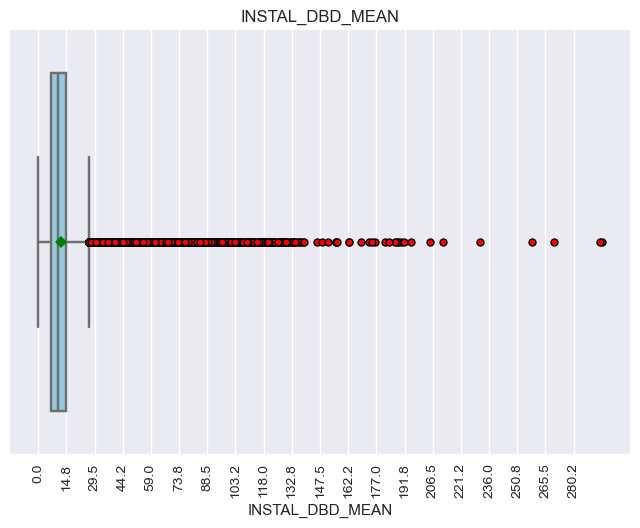

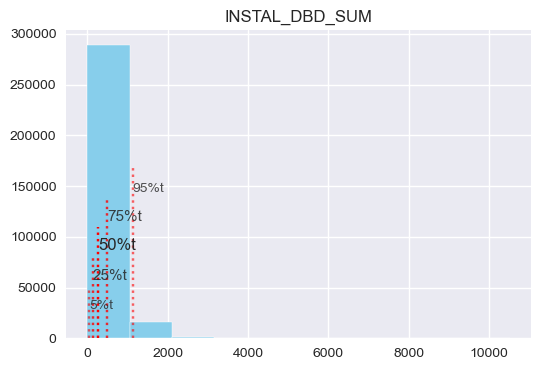

moy:      17.4
5%tile:   0.0
25%tile:  0.0
50%tile:  1.0
75%tile:  8.0
95%tile:  34.0


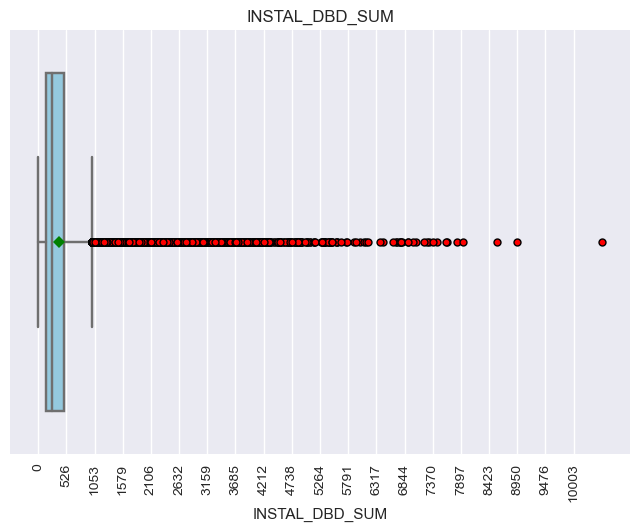

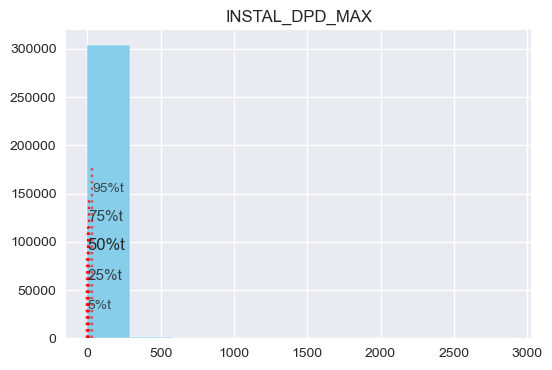

moy:      1.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.5
95%tile:  3.4


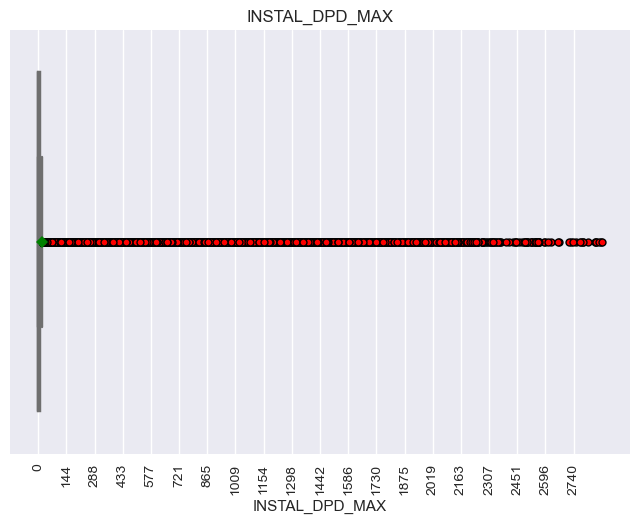

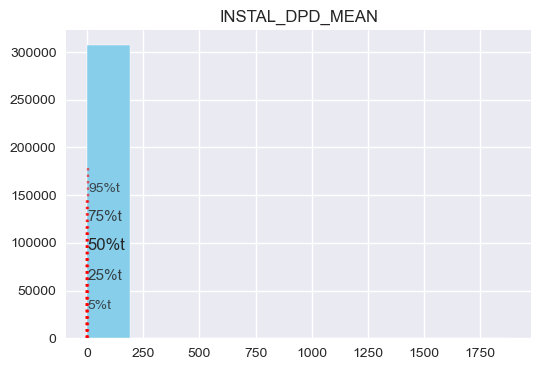

moy:      40.4
5%tile:   0.0
25%tile:  0.0
50%tile:  1.0
75%tile:  19.0
95%tile:  158.0


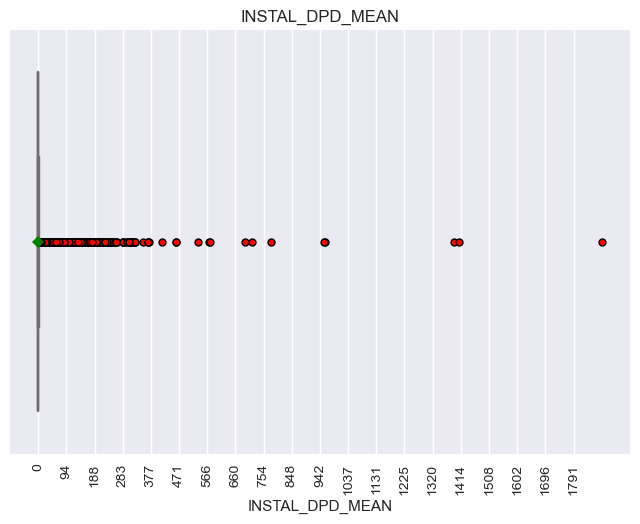

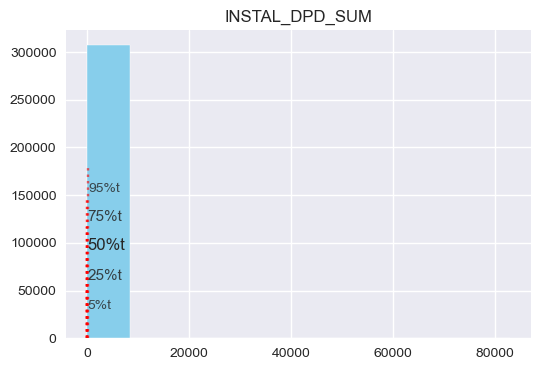

moy:      2.3
5%tile:   1.0
25%tile:  1.0
50%tile:  2.0
75%tile:  3.0
95%tile:  5.0


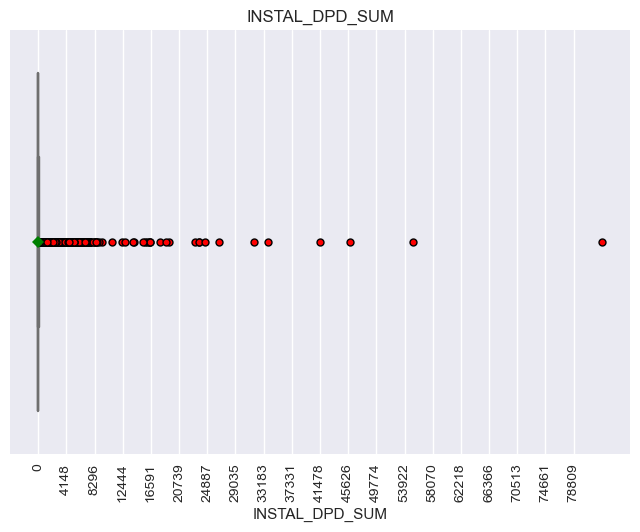

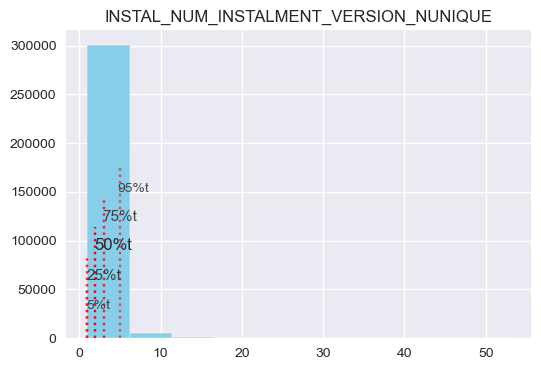

moy:      6377.5
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  8525.0
95%tile:  29774.9


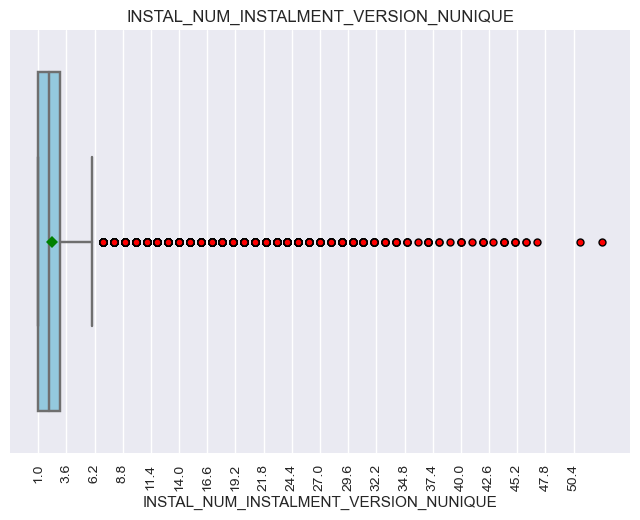

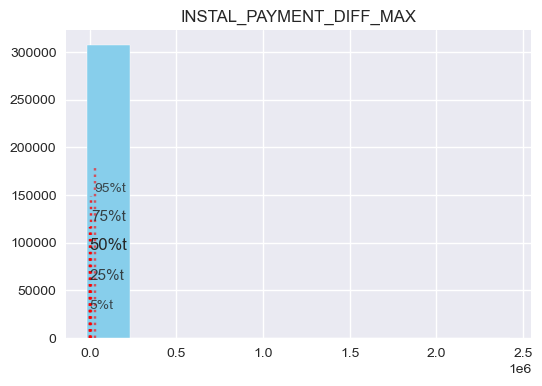

moy:      -344.4
5%tile:   -4218.8
25%tile:  0.0
50%tile:  0.0
75%tile:  389.4
95%tile:  2691.5


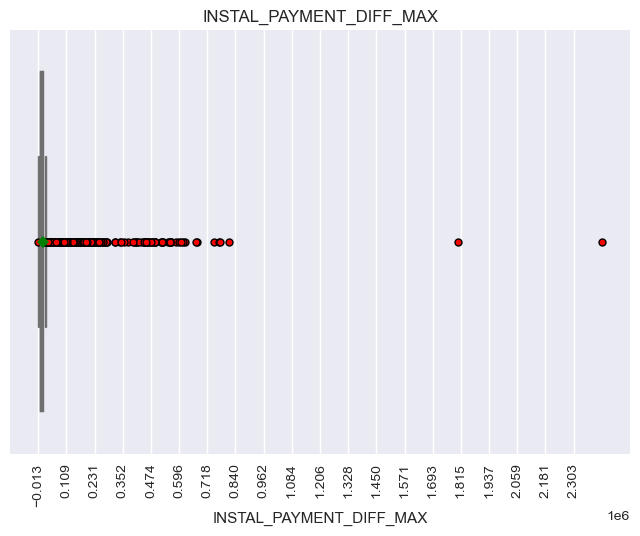

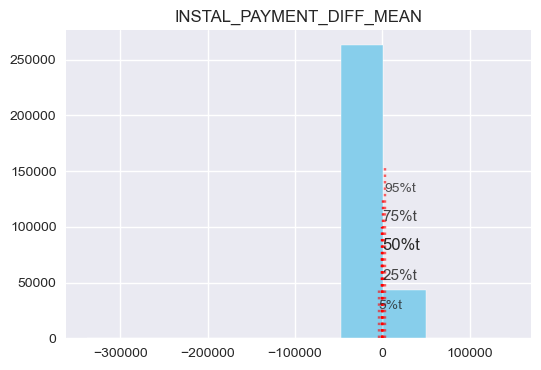

moy:      -5959.6
5%tile:   -158952.3
25%tile:  0.0
50%tile:  0.0
75%tile:  13845.5
95%tile:  126699.2


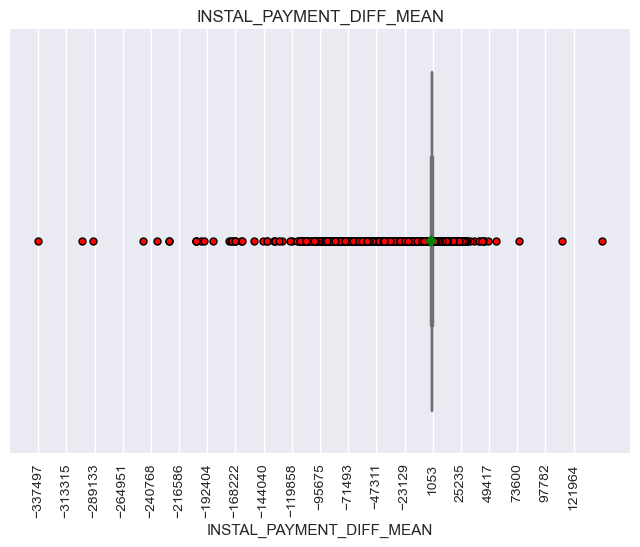

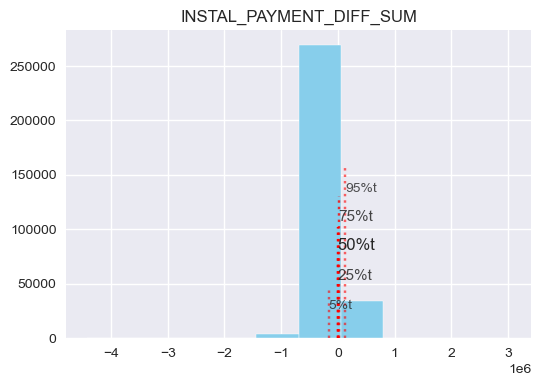

moy:      324459837.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  9624805.8
95%tile:  431307879.3


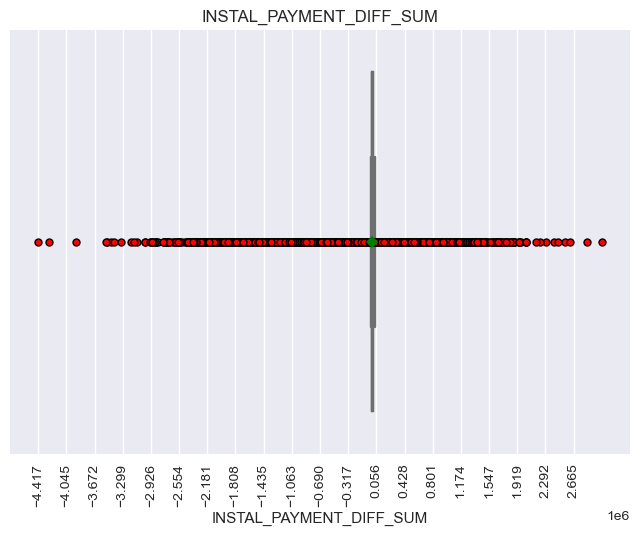

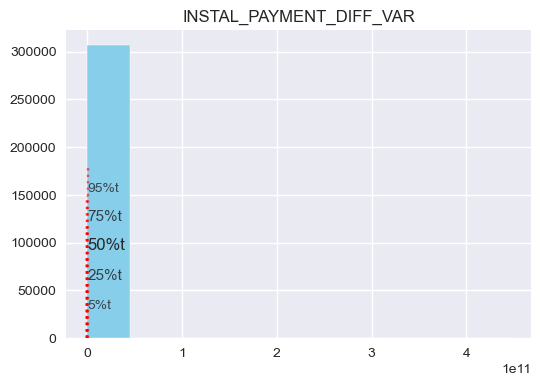

moy:      13.0
5%tile:   1.0
25%tile:  1.0
50%tile:  1.0
75%tile:  1.0
95%tile:  7.5


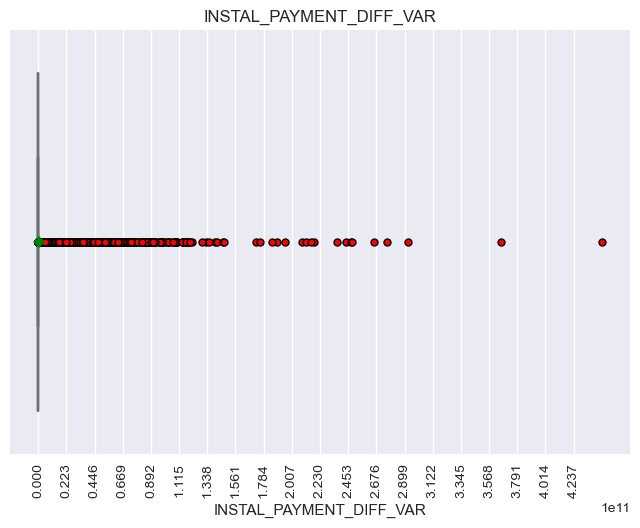

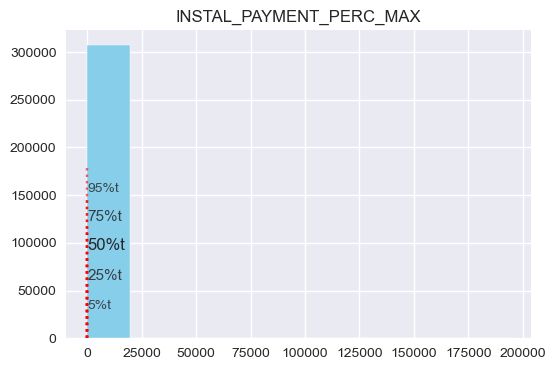

moy:      1.4
5%tile:   0.8
25%tile:  1.0
50%tile:  1.0
75%tile:  1.0
95%tile:  1.2


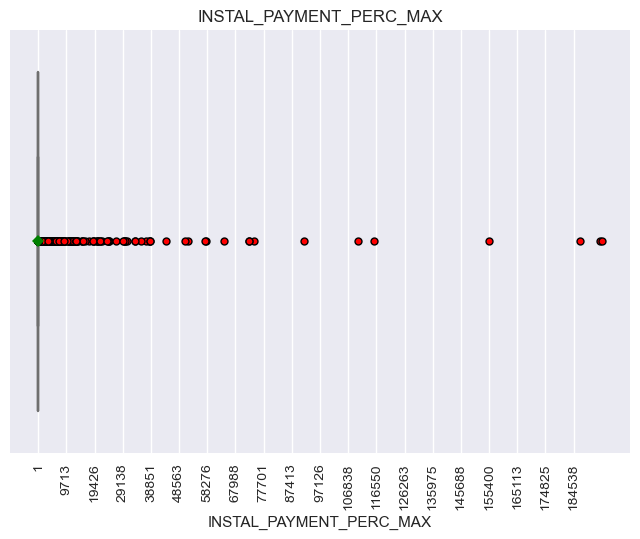

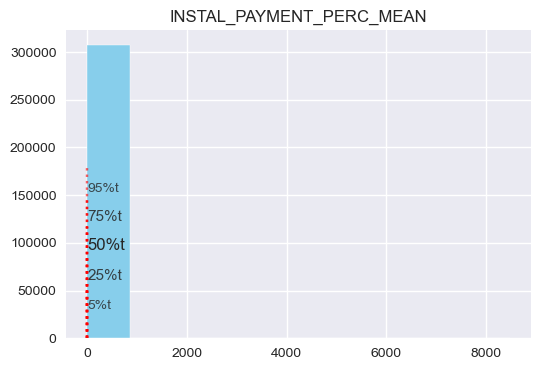

moy:      49.7
5%tile:   6.0
25%tile:  12.0
50%tile:  24.0
75%tile:  48.0
95%tile:  128.7


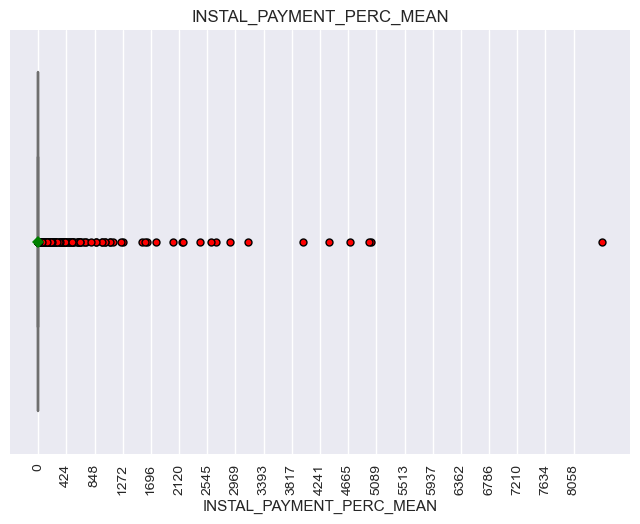

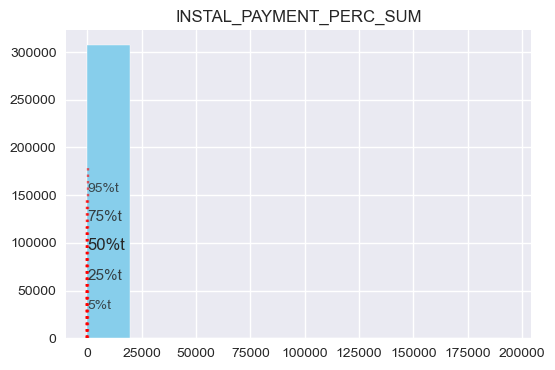

moy:      19651.9
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.1
95%tile:  1.2


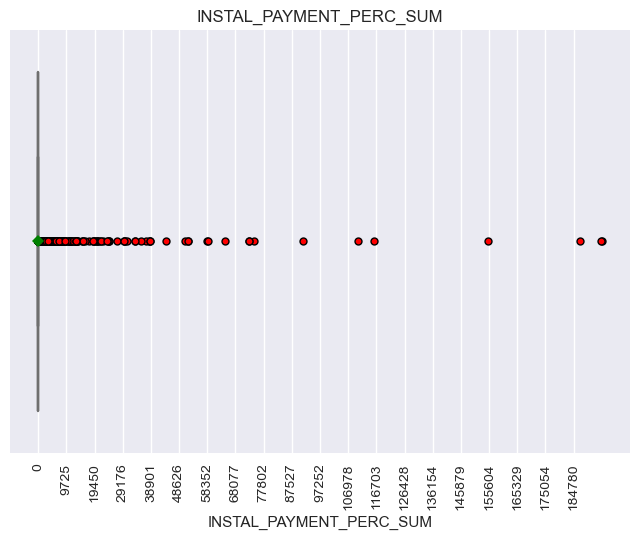

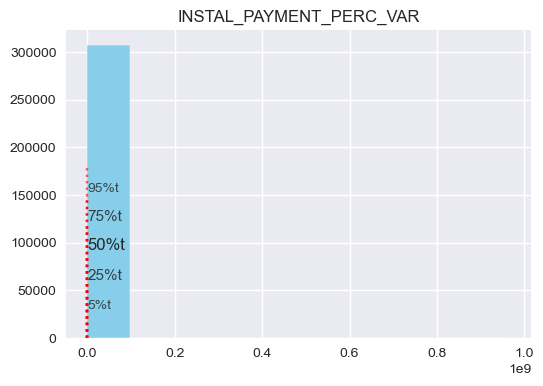

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


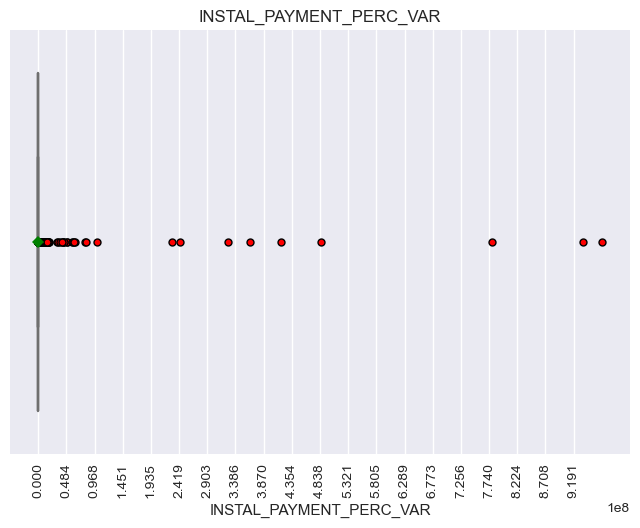

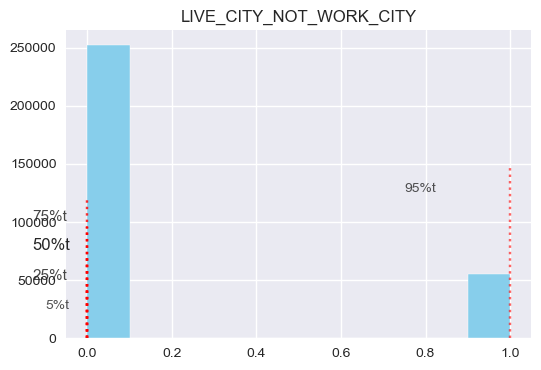

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


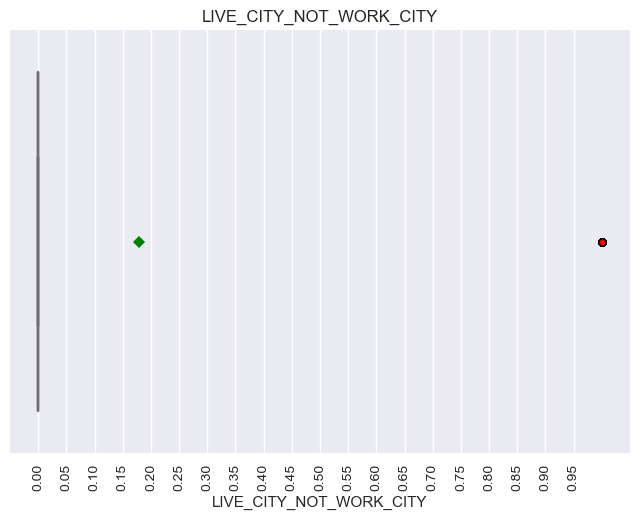

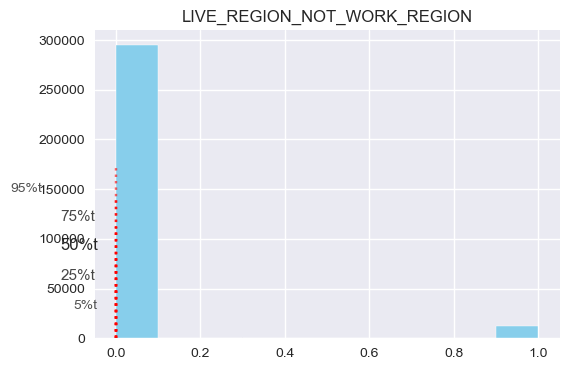

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


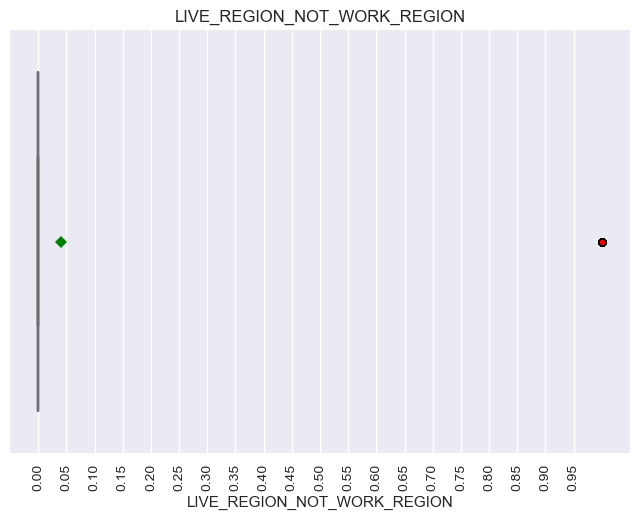

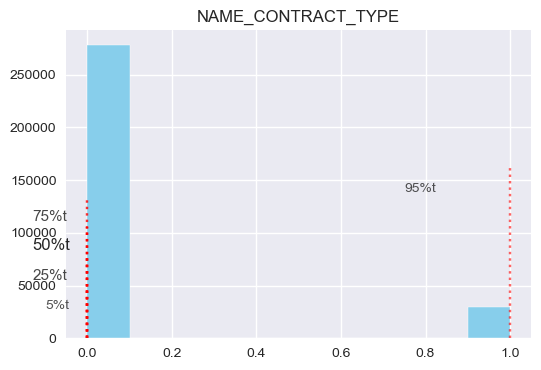

moy:      3.2
5%tile:   1.0
25%tile:  2.0
50%tile:  4.0
75%tile:  4.0
95%tile:  4.0


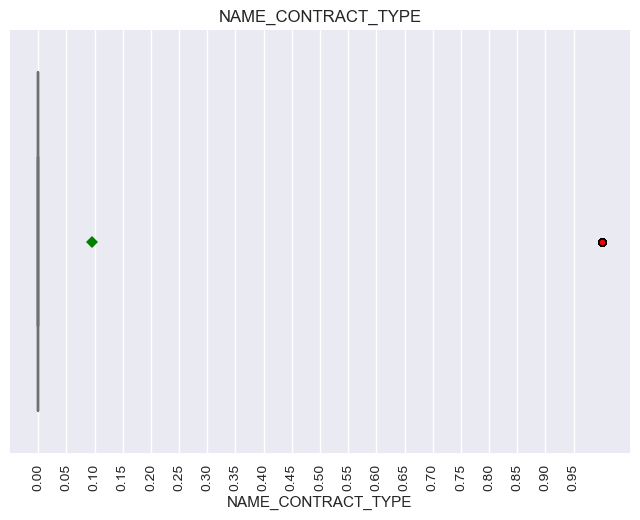

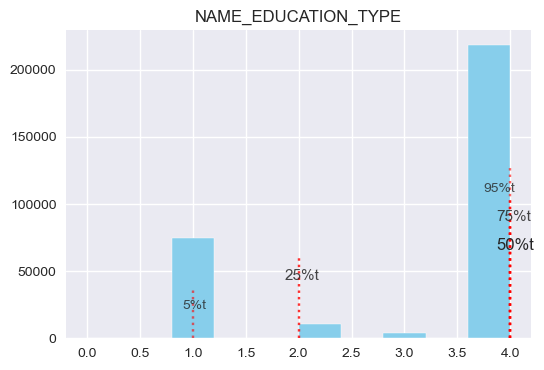

moy:      1.5
5%tile:   0.0
25%tile:  1.0
50%tile:  1.0
75%tile:  2.0
95%tile:  5.0


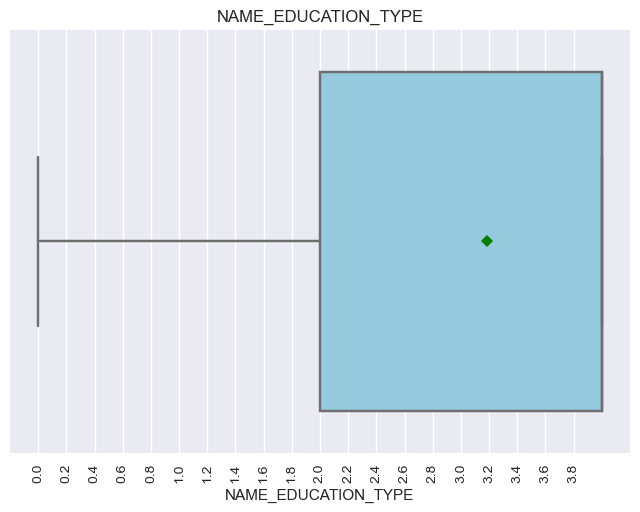

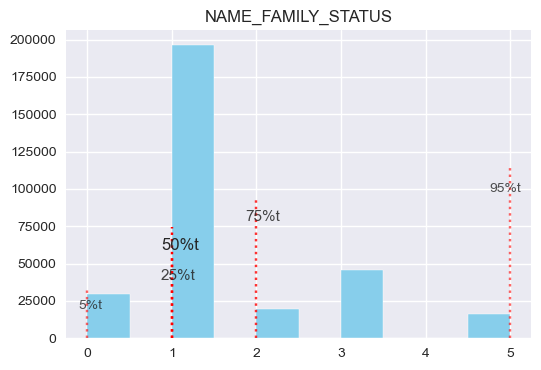

moy:      1.3
5%tile:   1.0
25%tile:  1.0
50%tile:  1.0
75%tile:  1.0
95%tile:  4.0


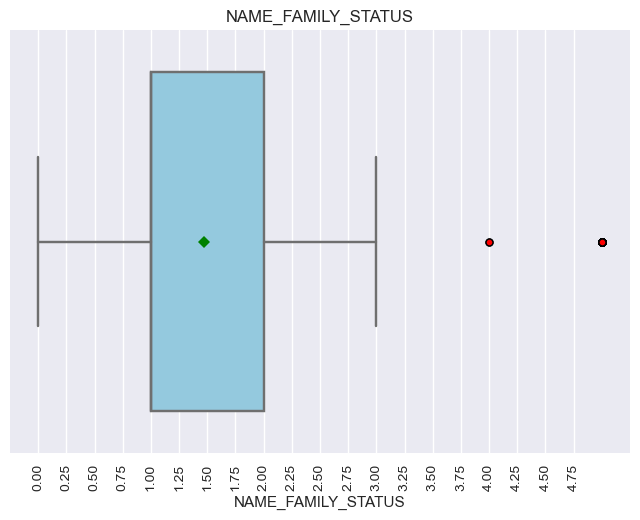

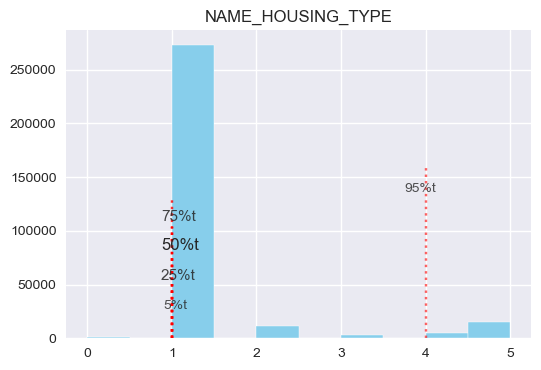

moy:      4.7
5%tile:   1.0
25%tile:  3.0
50%tile:  7.0
75%tile:  7.0
95%tile:  7.0


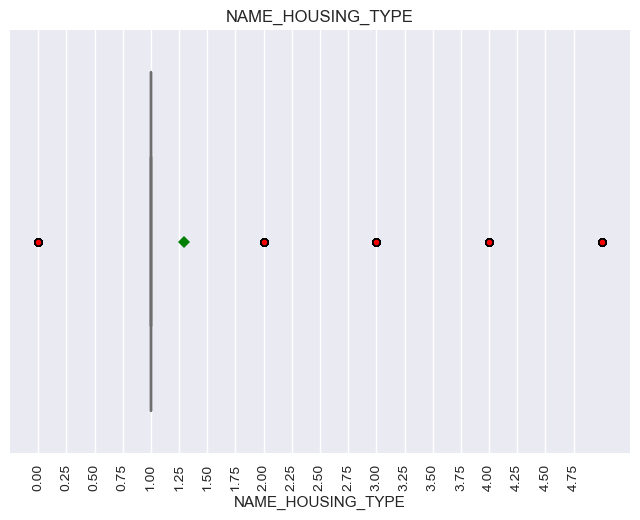

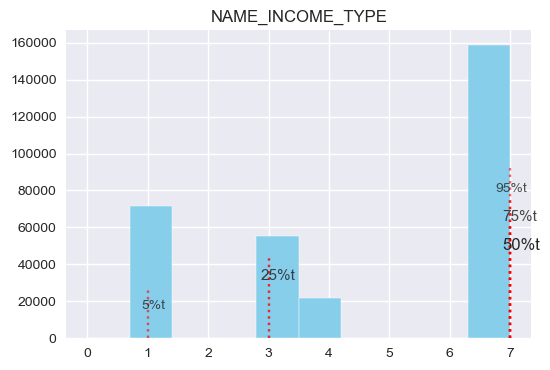

moy:      6.1
5%tile:   1.0
25%tile:  7.0
50%tile:  7.0
75%tile:  7.0
95%tile:  7.0


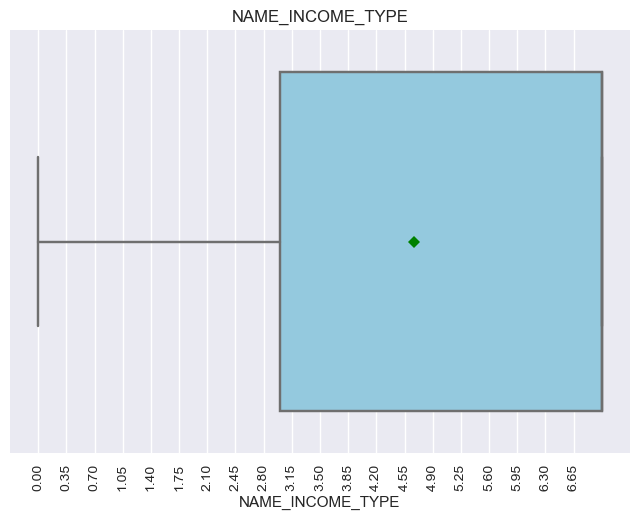

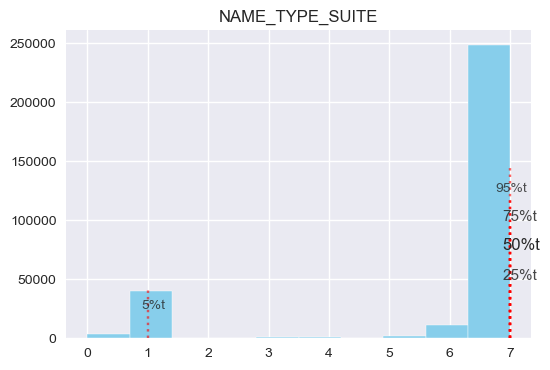

moy:      1.4
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  2.0
95%tile:  6.0


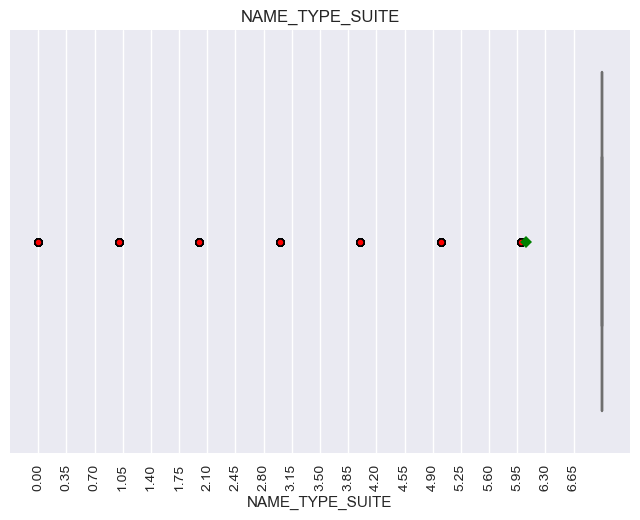

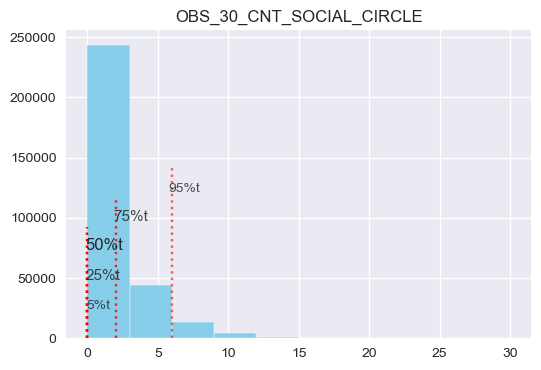

moy:      1.4
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  2.0
95%tile:  6.0


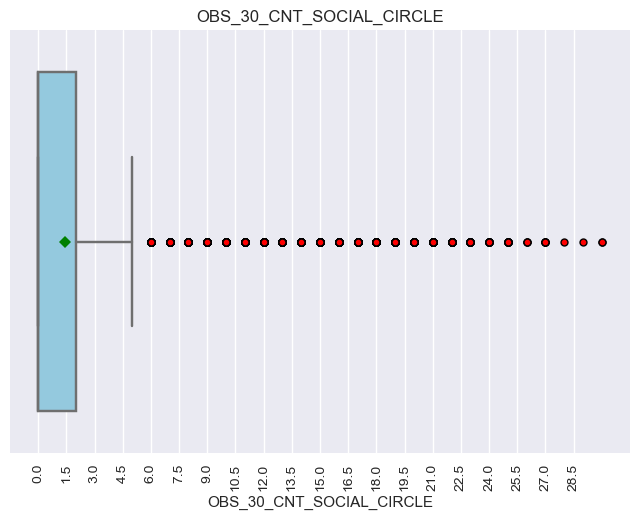

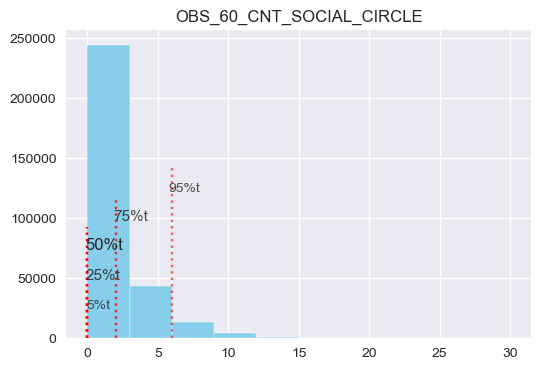

moy:      9.3
5%tile:   2.0
25%tile:  6.0
50%tile:  10.0
75%tile:  12.0
95%tile:  15.0


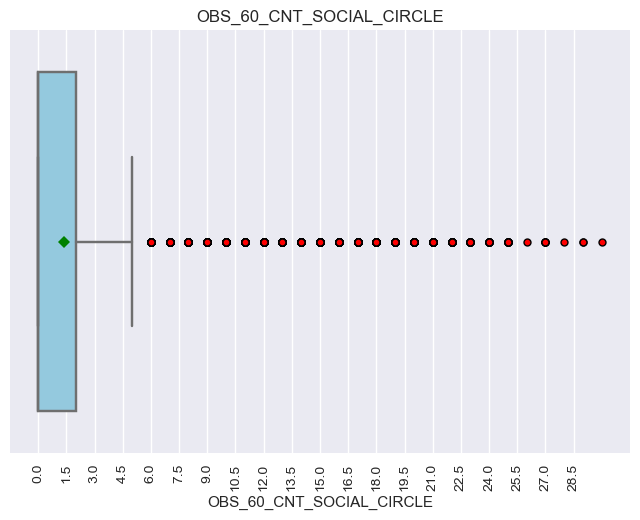

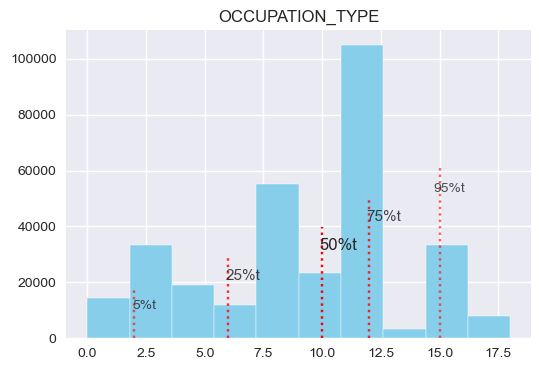

moy:      29.5
5%tile:   4.0
25%tile:  5.0
50%tile:  33.0
75%tile:  47.0
95%tile:  57.0


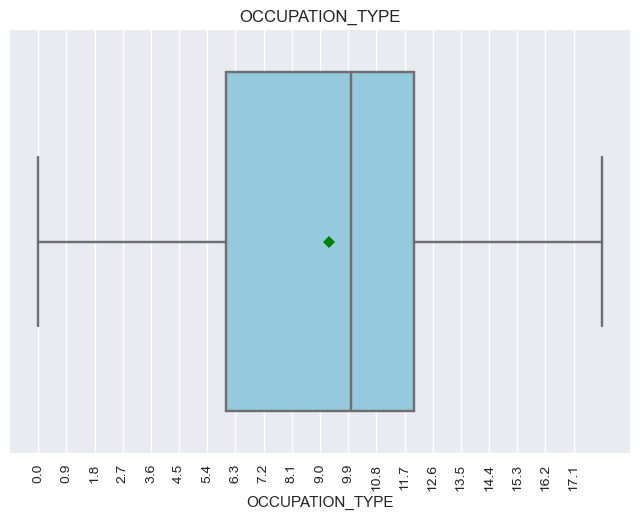

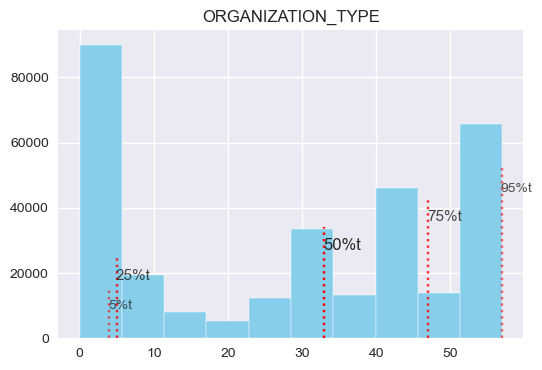

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.1
95%tile:  0.1


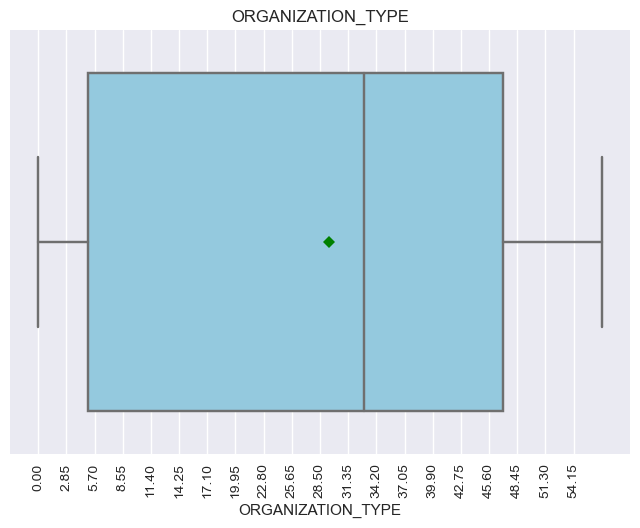

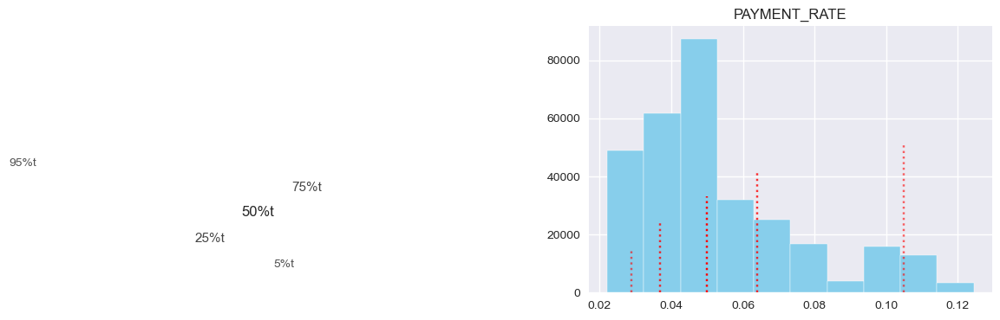

moy:      29.1
5%tile:   6.0
25%tile:  13.0
50%tile:  22.0
75%tile:  38.0
95%tile:  77.0


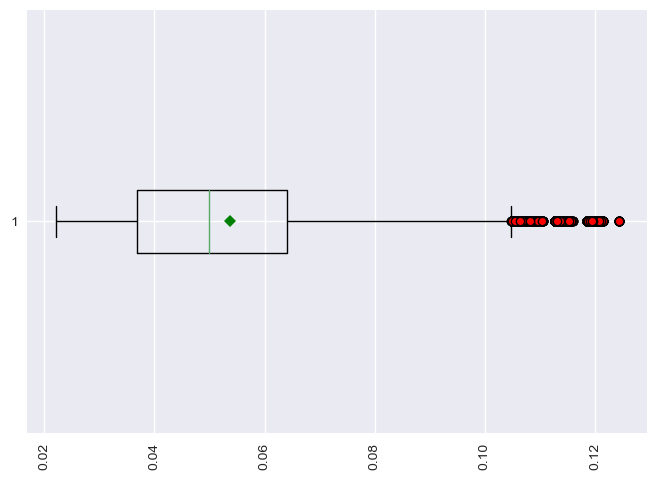

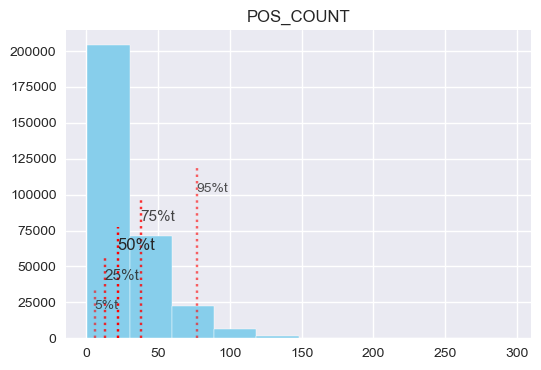

moy:      -12.1
5%tile:   -58.0
25%tile:  -14.0
50%tile:  -4.0
75%tile:  -2.0
95%tile:  -1.0


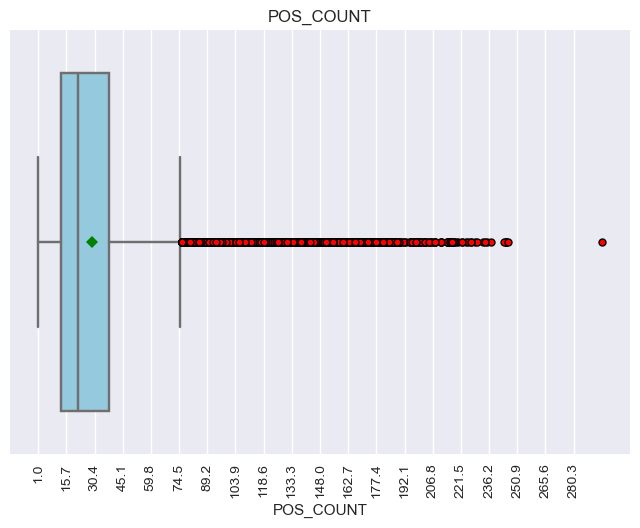

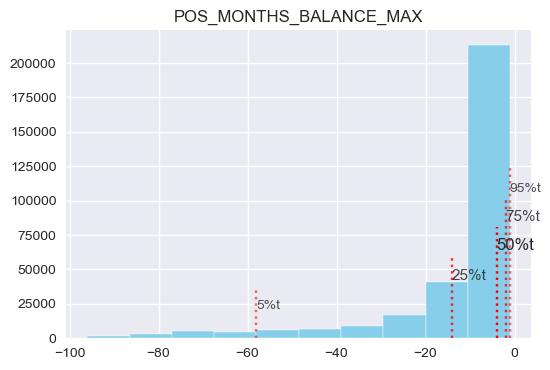

moy:      -31.6
5%tile:   -70.5
25%tile:  -42.8
50%tile:  -28.6
75%tile:  -16.2
95%tile:  -6.5


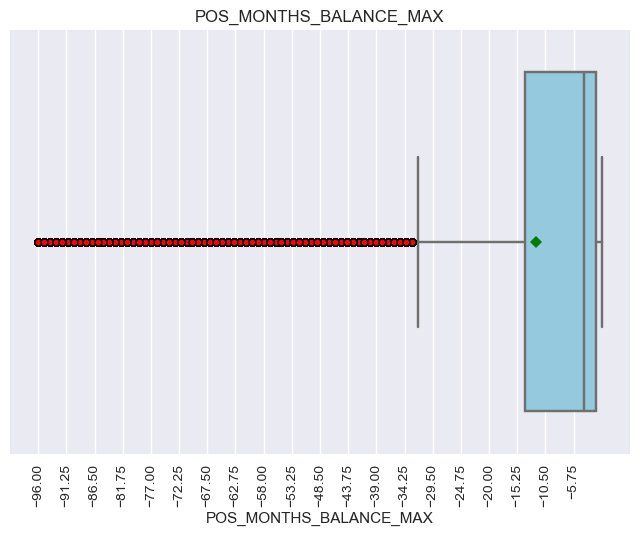

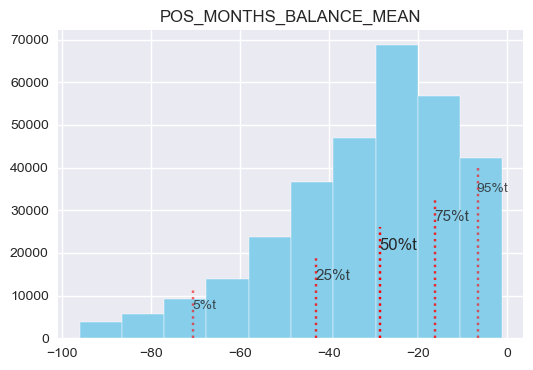

moy:      29.1
5%tile:   6.0
25%tile:  13.0
50%tile:  22.0
75%tile:  38.0
95%tile:  77.0


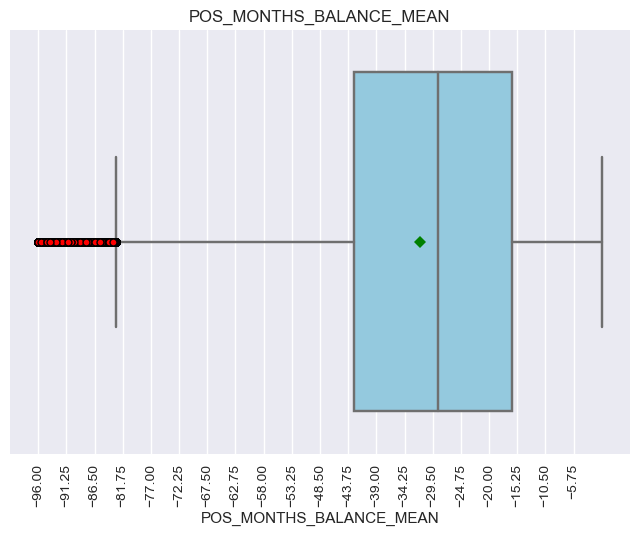

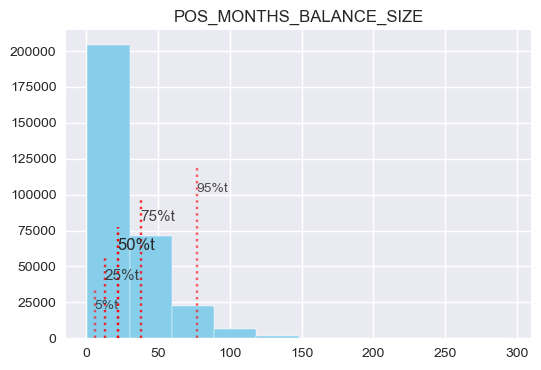

moy:      1.4
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  7.0


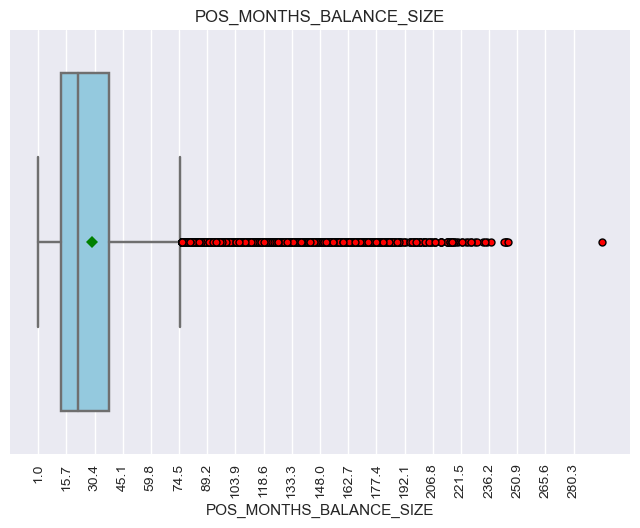

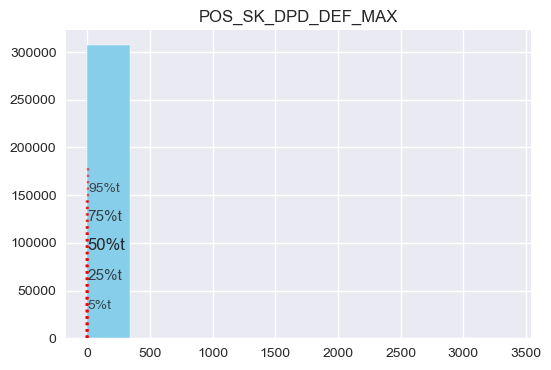

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.3


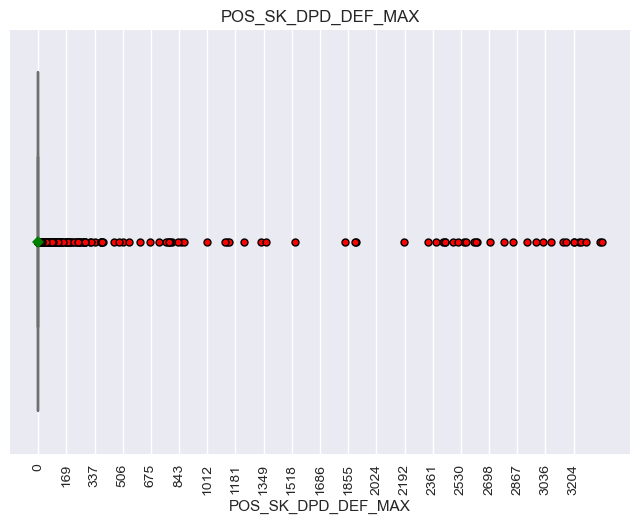

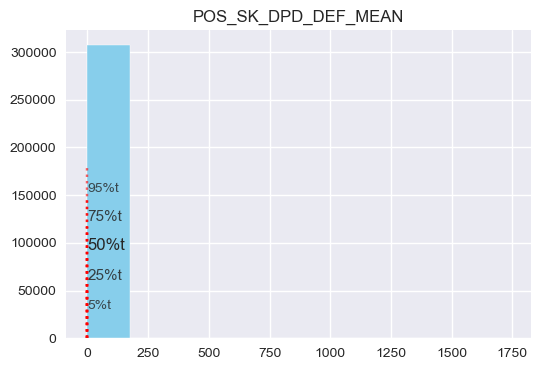

moy:      14.7
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  17.0


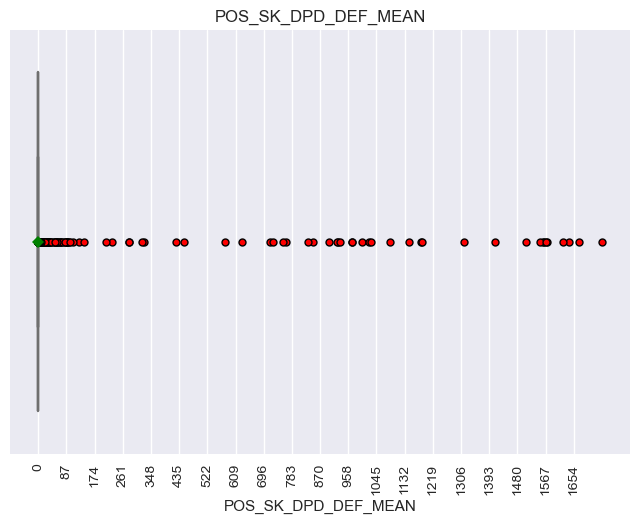

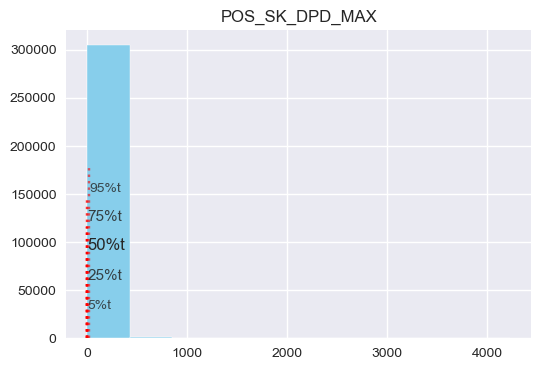

moy:      4.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.1


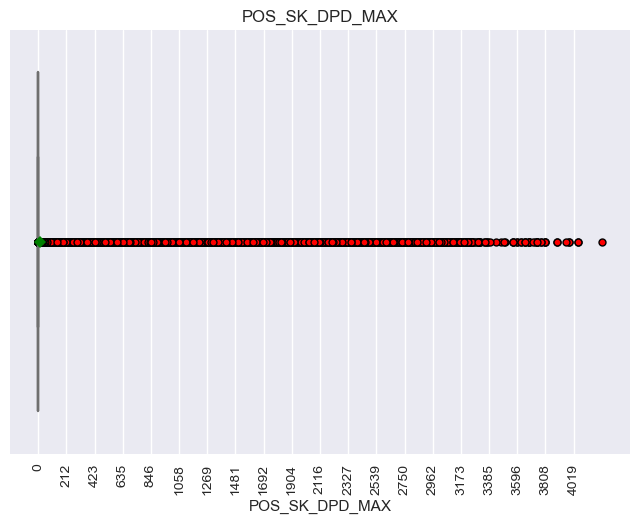

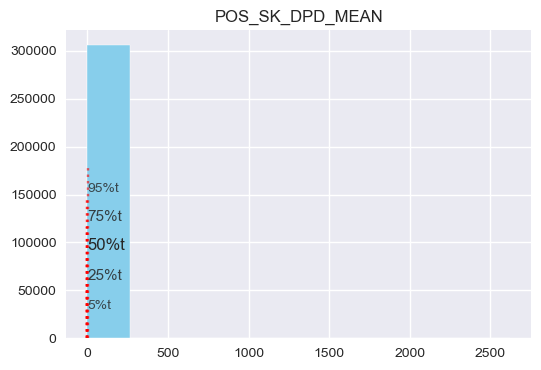

moy:      23403.3
5%tile:   4876.5
25%tile:  10788.4
50%tile:  17907.8
75%tile:  30267.6
95%tile:  58608.5


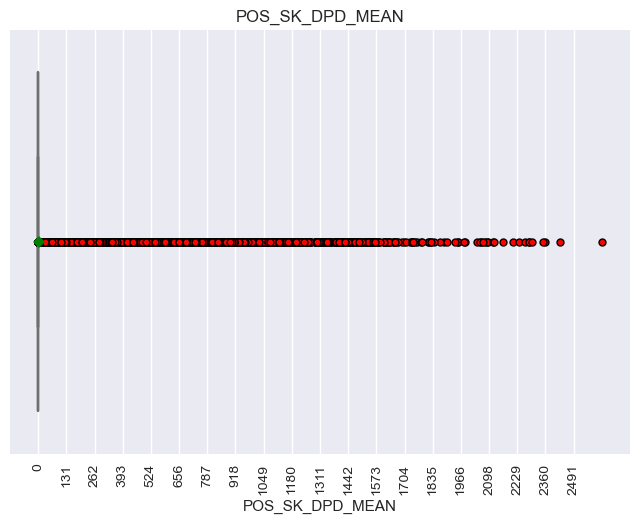

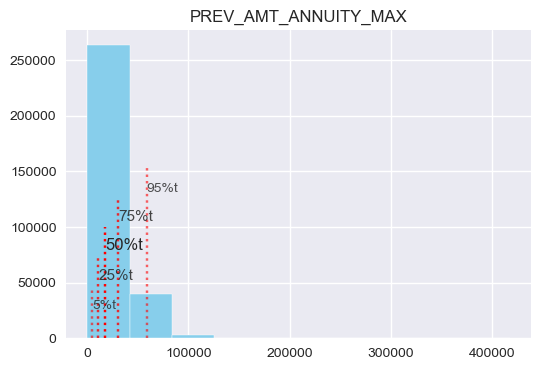

moy:      14391.9
5%tile:   4330.1
25%tile:  8055.6
50%tile:  11984.4
75%tile:  17827.7
95%tile:  32580.3


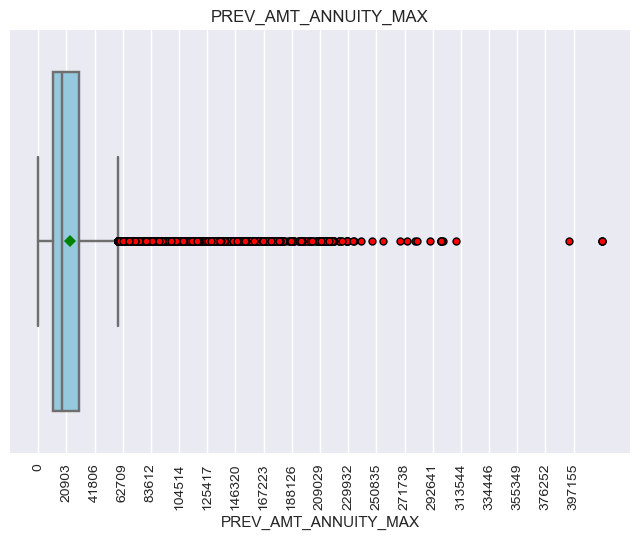

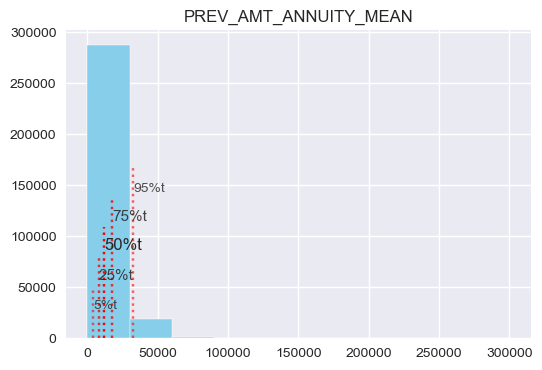

moy:      7746.5
5%tile:   2250.0
25%tile:  3633.5
50%tile:  5722.0
75%tile:  9150.3
95%tile:  20179.5


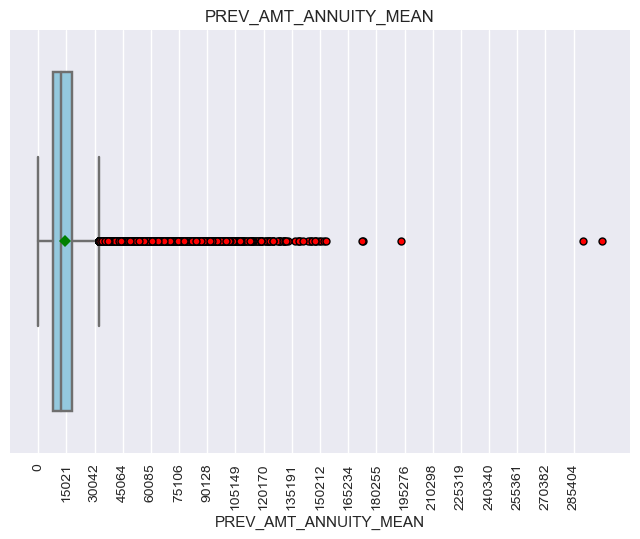

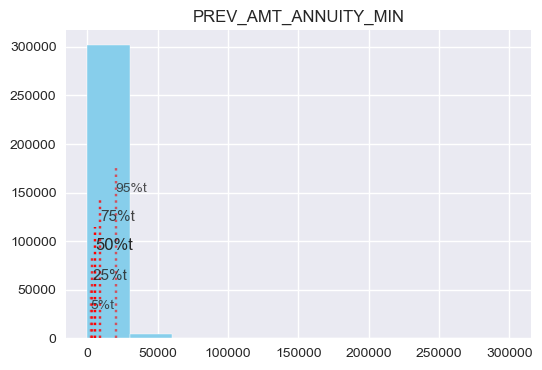

moy:      365376.1
5%tile:   38610.0
25%tile:  103234.5
50%tile:  202500.0
75%tile:  450000.0
95%tile:  1255500.0


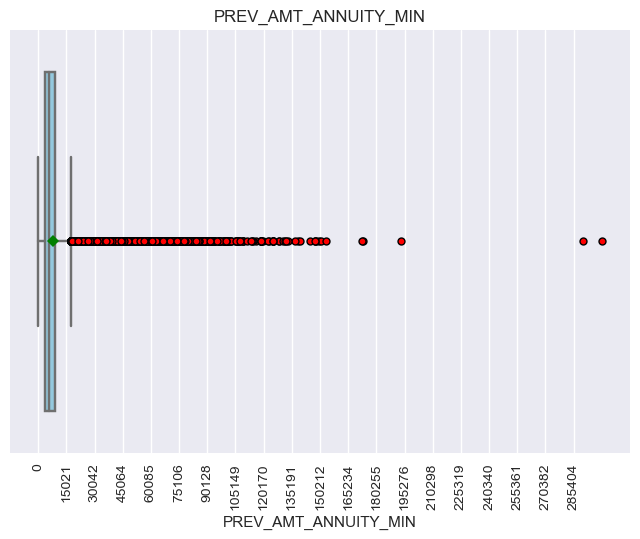

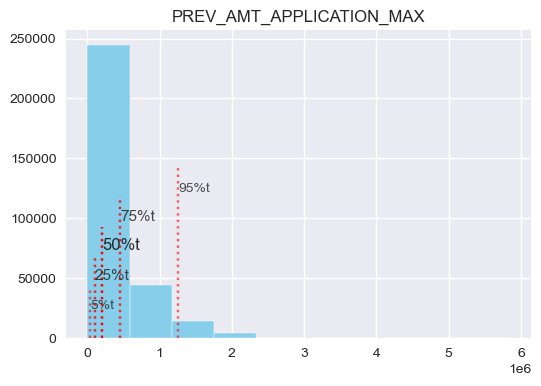

moy:      151430.1
5%tile:   28125.0
25%tile:  64080.3
50%tile:  106002.0
75%tile:  183214.3
95%tile:  431699.5


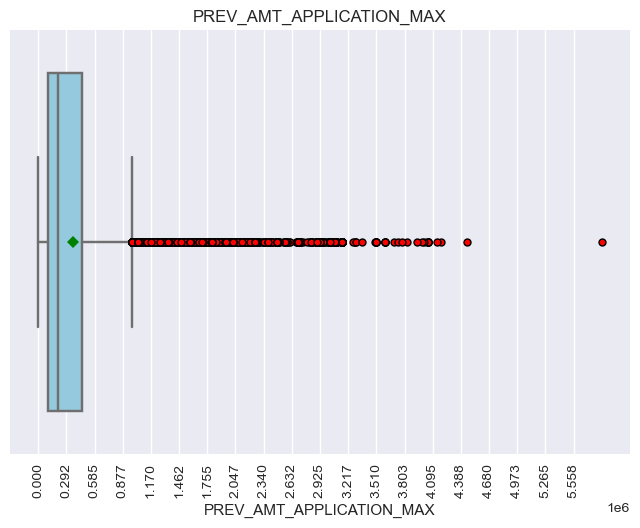

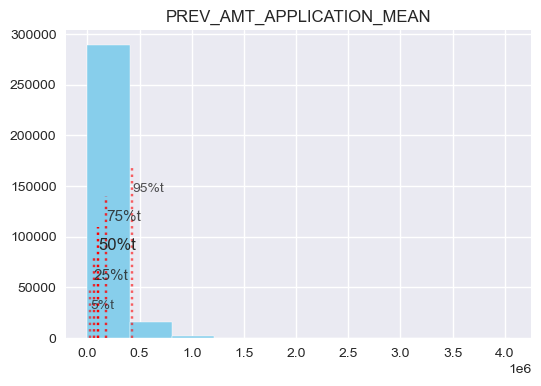

moy:      42966.9
5%tile:   0.0
25%tile:  0.0
50%tile:  18368.3
75%tile:  50521.5
95%tile:  160303.5


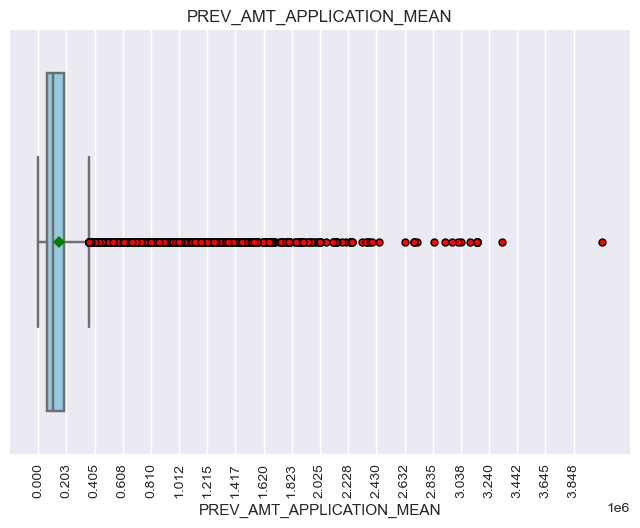

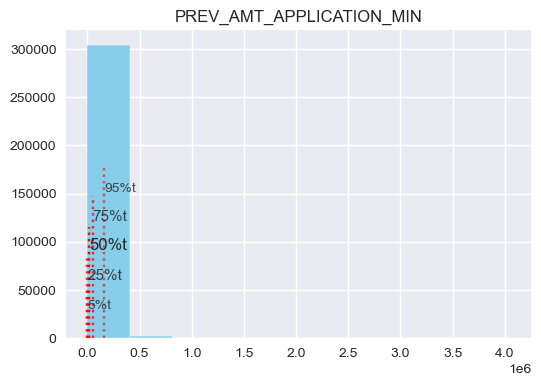

moy:      403753.7
5%tile:   39524.4
25%tile:  109606.5
50%tile:  225000.0
75%tile:  528817.5
95%tile:  1345036.5


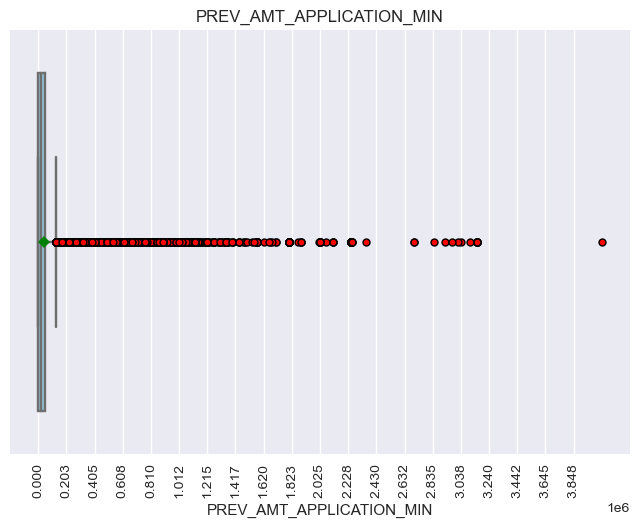

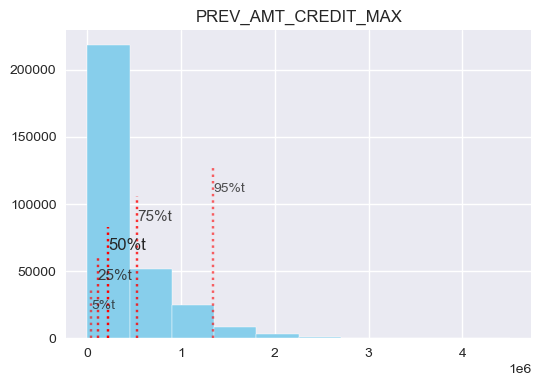

moy:      167247.9
5%tile:   30026.2
25%tile:  69156.0
50%tile:  117450.0
75%tile:  207434.2
95%tile:  471150.0


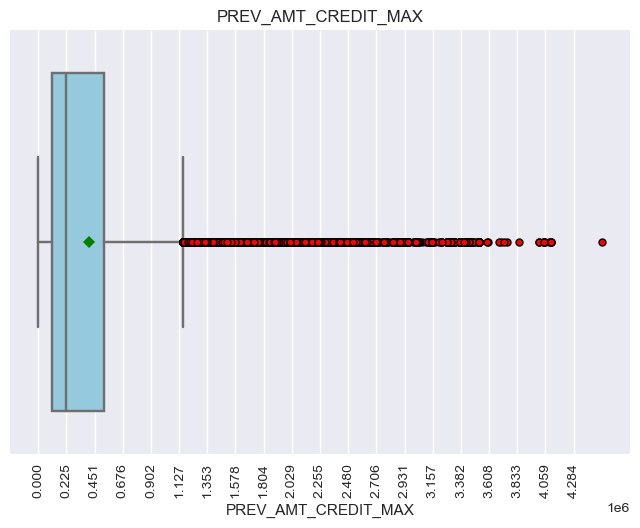

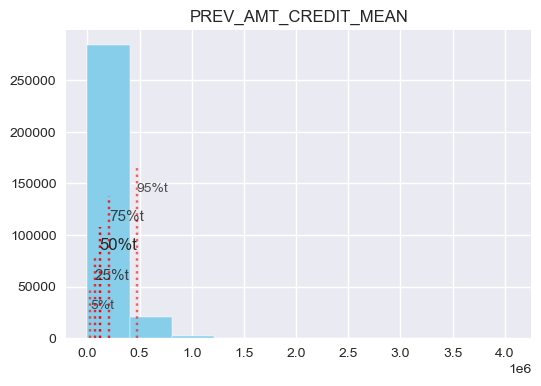

moy:      47356.3
5%tile:   0.0
25%tile:  0.0
50%tile:  23805.0
75%tile:  55188.0
95%tile:  168570.0


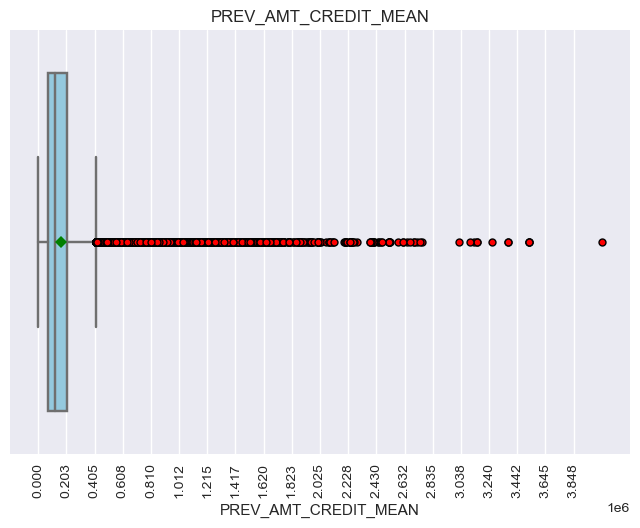

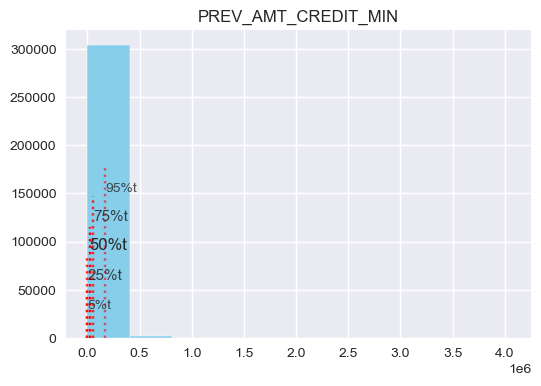

moy:      11036.9
5%tile:   0.0
25%tile:  0.0
50%tile:  5850.0
75%tile:  12627.0
95%tile:  40035.6


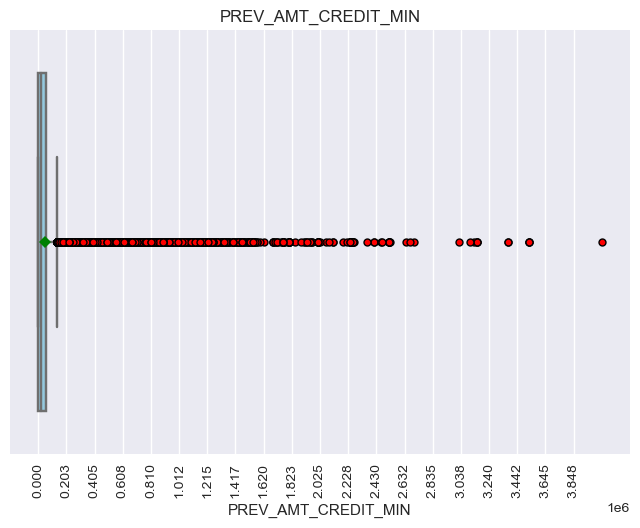

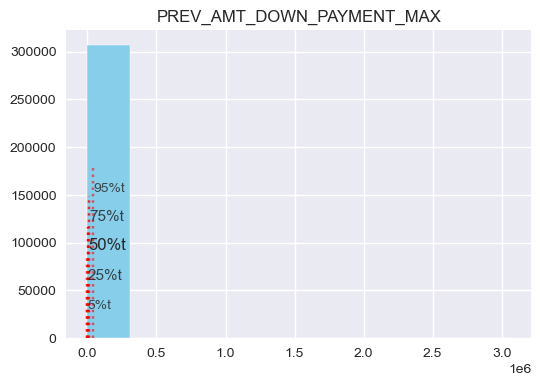

moy:      6670.7
5%tile:   0.0
25%tile:  0.0
50%tile:  3375.0
75%tile:  7312.5
95%tile:  22621.5


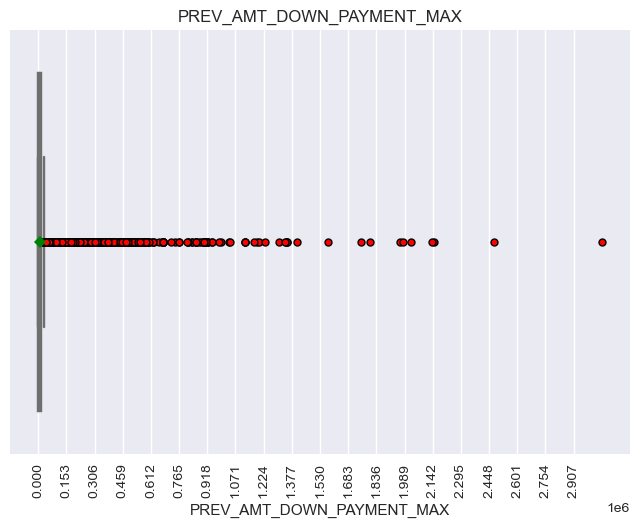

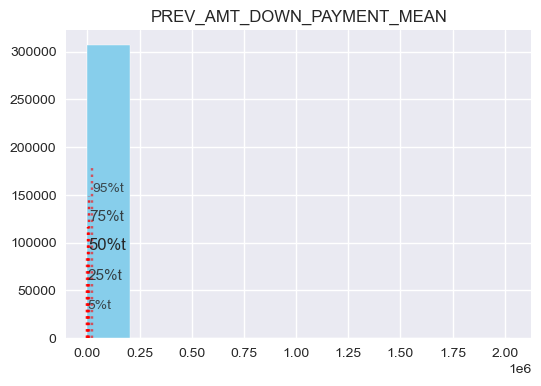

moy:      3523.7
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  2700.0
95%tile:  17104.5


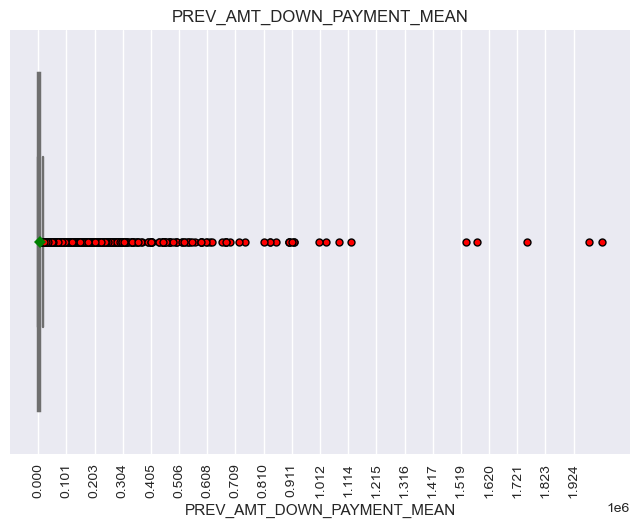

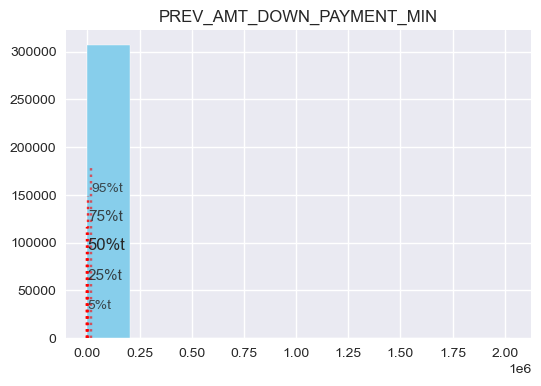

moy:      366053.3
5%tile:   39988.8
25%tile:  103851.0
50%tile:  202617.4
75%tile:  450000.0
95%tile:  1255500.0


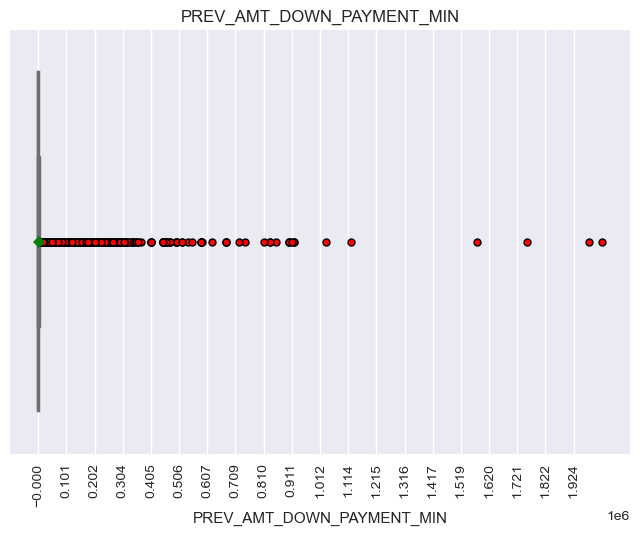

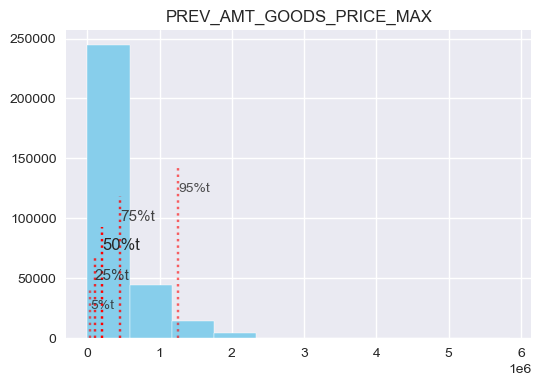

moy:      190183.7
5%tile:   34965.0
25%tile:  76410.0
50%tile:  128591.2
75%tile:  233991.0
95%tile:  558013.5


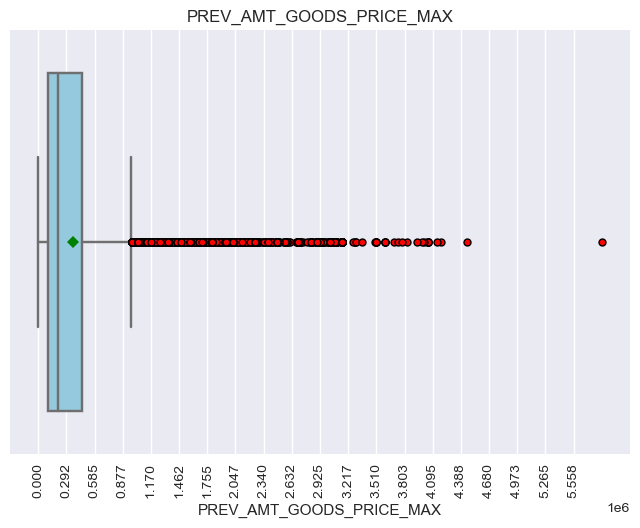

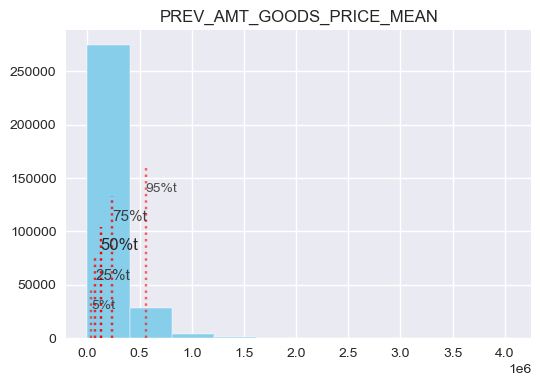

moy:      77489.0
5%tile:   16987.5
25%tile:  30141.0
50%tile:  45630.0
75%tile:  88852.5
95%tile:  225000.0


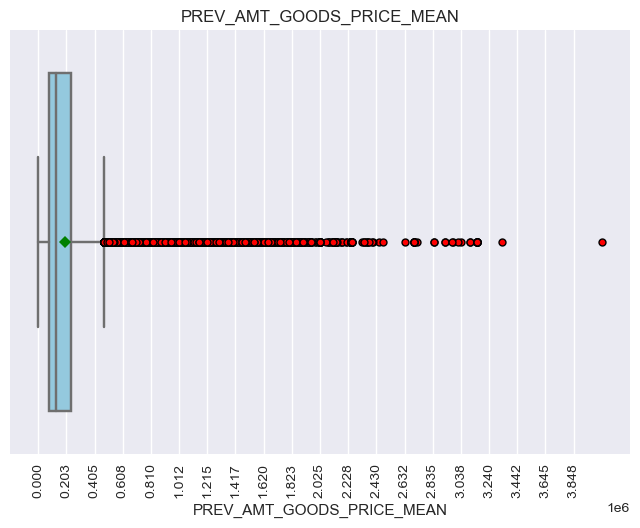

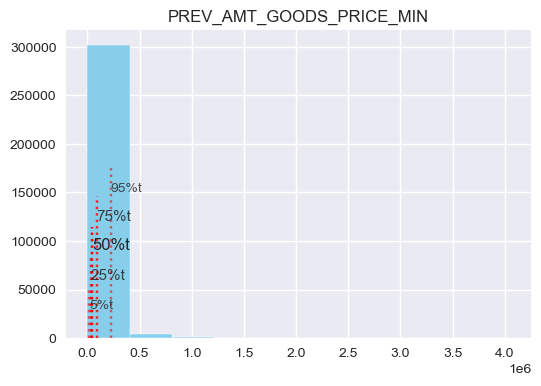

moy:      1.1
5%tile:   0.9
25%tile:  1.0
50%tile:  1.0
75%tile:  1.1
95%tile:  1.5


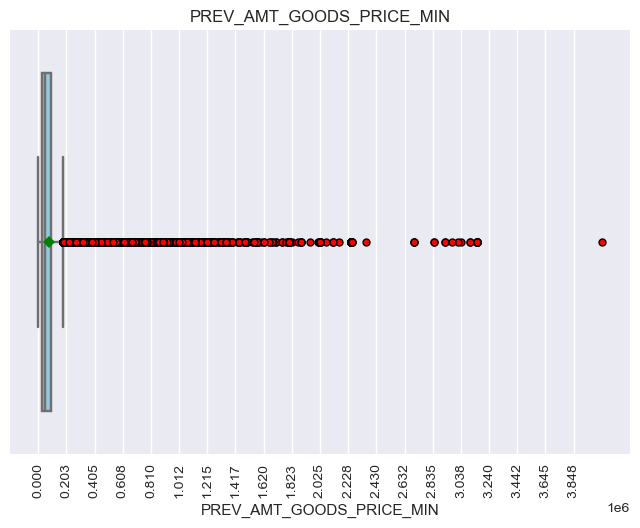

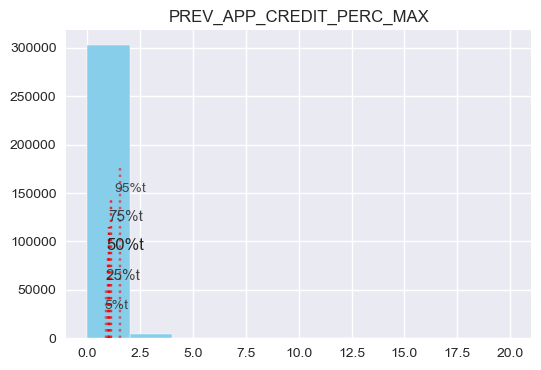

moy:      1.0
5%tile:   0.7
25%tile:  0.9
50%tile:  1.0
75%tile:  1.0
95%tile:  1.2


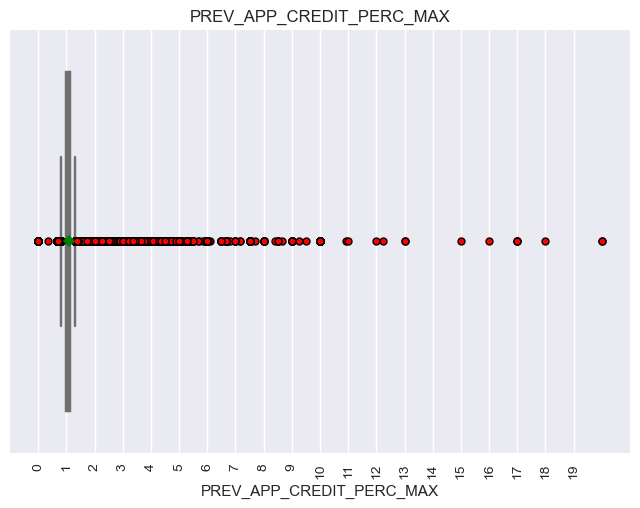

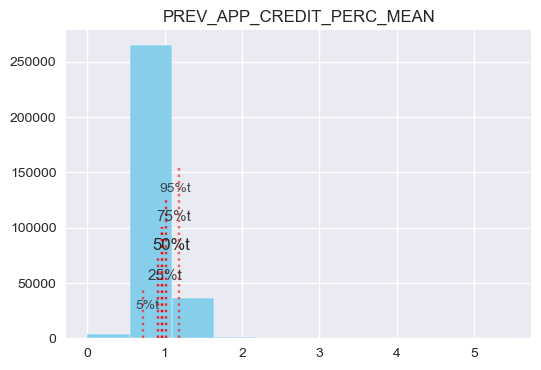

moy:      0.8
5%tile:   0.0
25%tile:  0.8
50%tile:  0.9
75%tile:  1.0
95%tile:  1.1


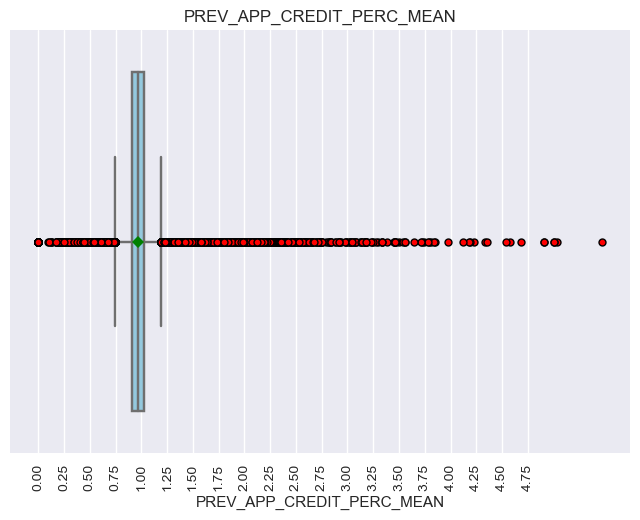

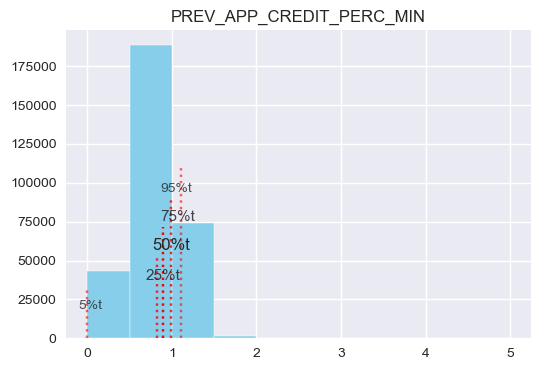

moy:      14.4
5%tile:   5.6
25%tile:  9.0
50%tile:  12.0
75%tile:  18.0
95%tile:  31.0


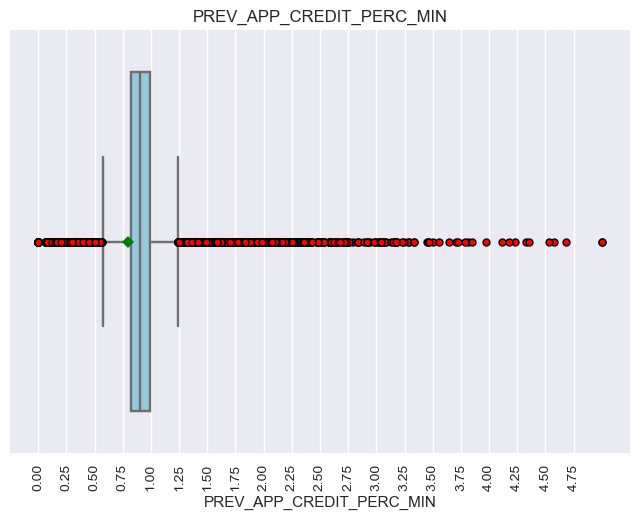

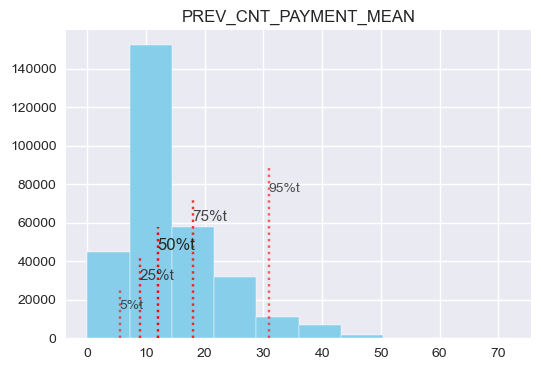

moy:      59.7
5%tile:   6.0
25%tile:  18.0
50%tile:  36.0
75%tile:  72.0
95%tile:  192.0


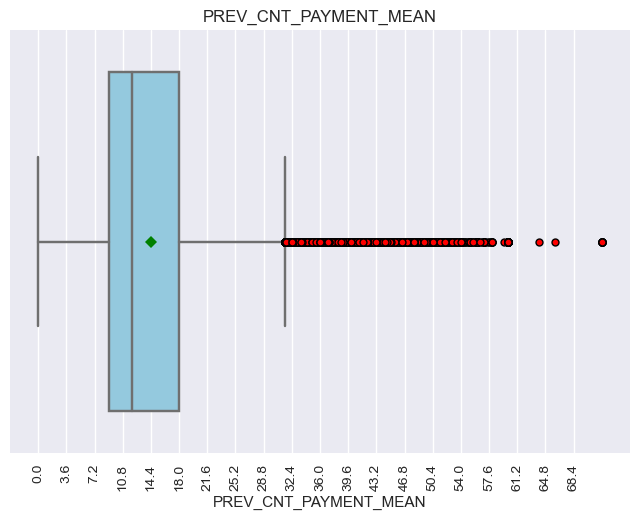

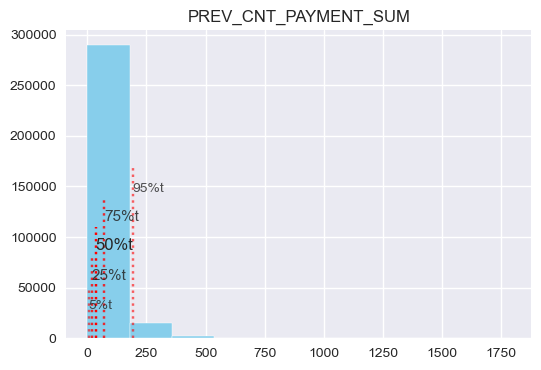

moy:      -471.1
5%tile:   -1715.0
25%tile:  -569.0
50%tile:  -299.0
75%tile:  -155.0
95%tile:  -24.0


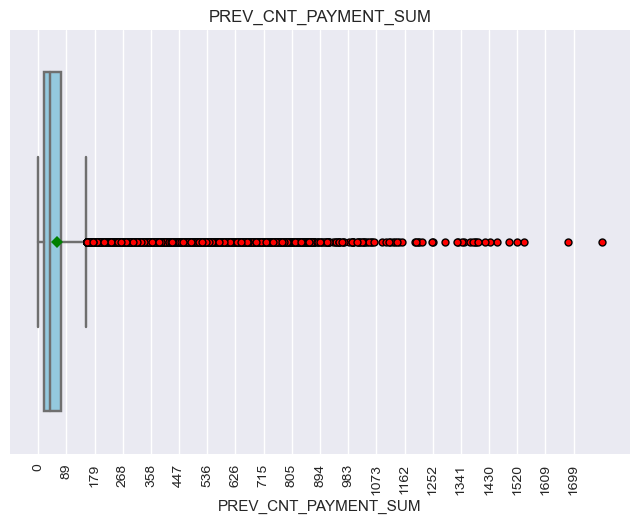

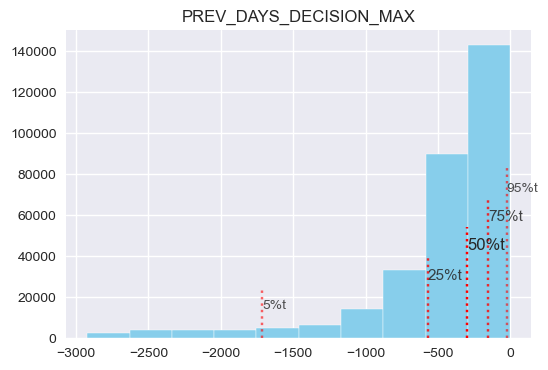

moy:      -912.6
5%tile:   -2060.6
25%tile:  -1213.3
50%tile:  -789.0
75%tile:  -483.0
95%tile:  -236.2


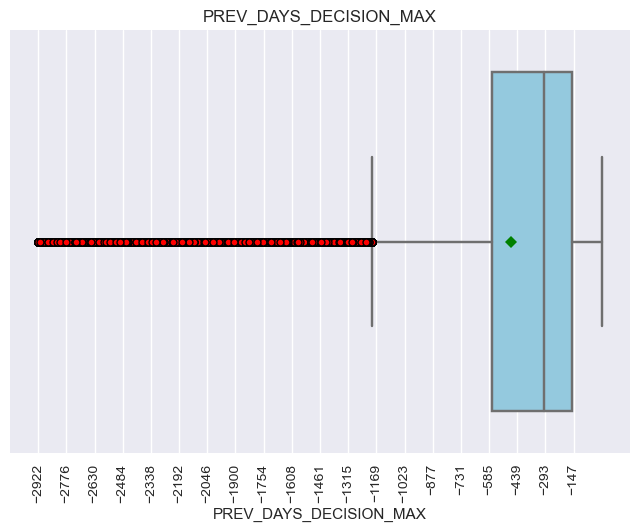

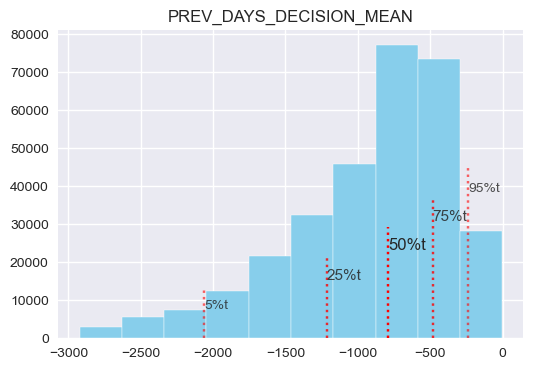

moy:      -1537.8
5%tile:   -2814.0
25%tile:  -2350.0
50%tile:  -1503.0
75%tile:  -756.0
95%tile:  -312.0


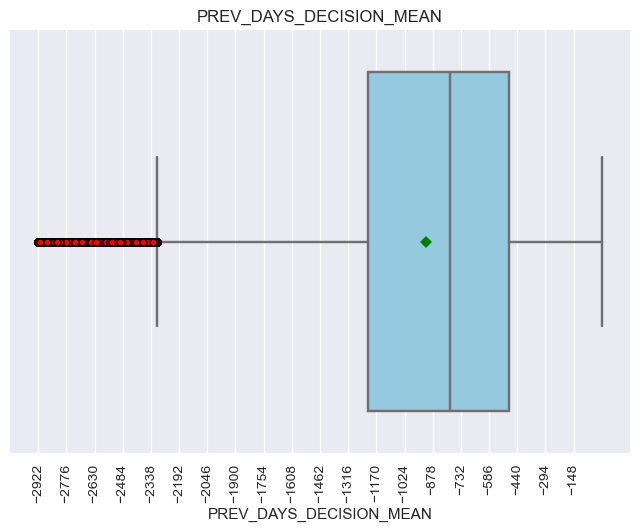

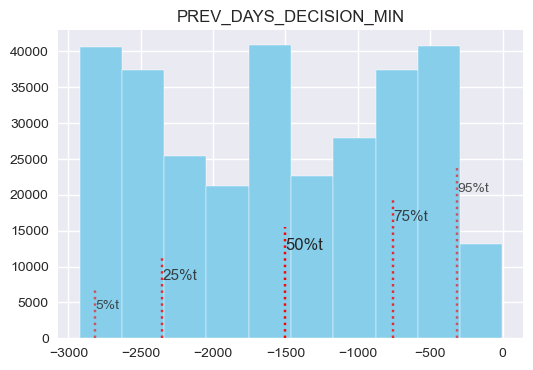

moy:      14.8
5%tile:   9.0
25%tile:  13.0
50%tile:  15.0
75%tile:  17.0
95%tile:  19.0


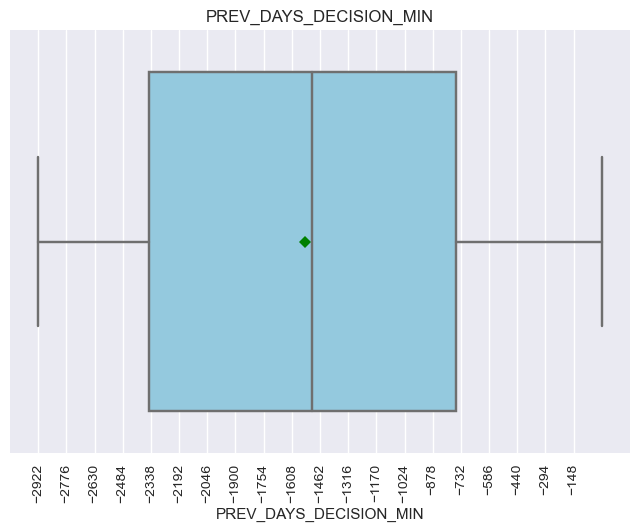

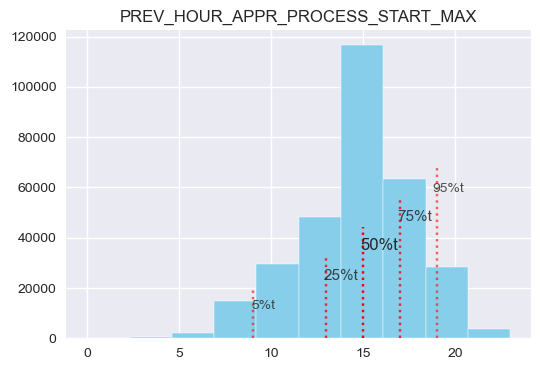

moy:      12.7
5%tile:   8.0
25%tile:  11.0
50%tile:  12.8
75%tile:  14.4
95%tile:  17.0


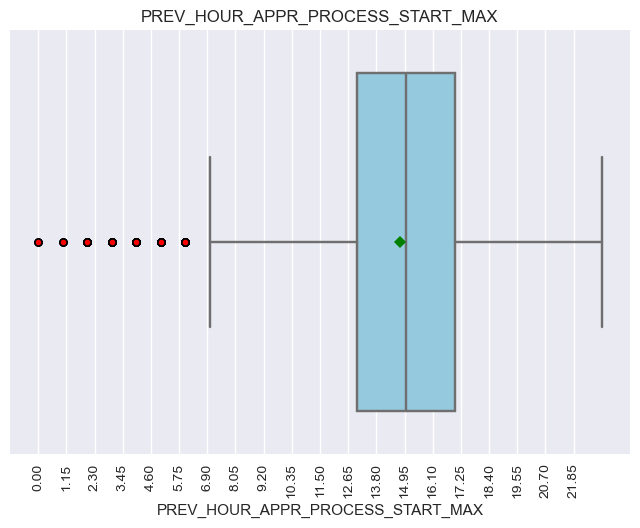

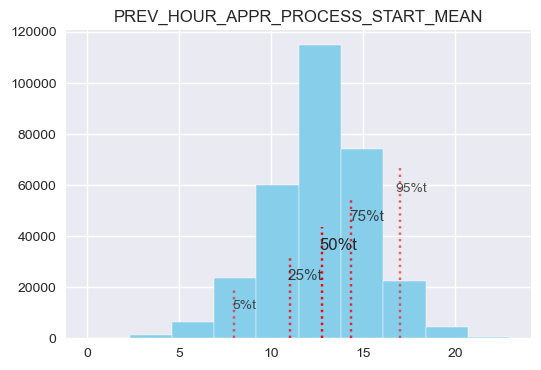

moy:      10.7
5%tile:   6.0
25%tile:  9.0
50%tile:  10.0
75%tile:  12.0
95%tile:  16.0


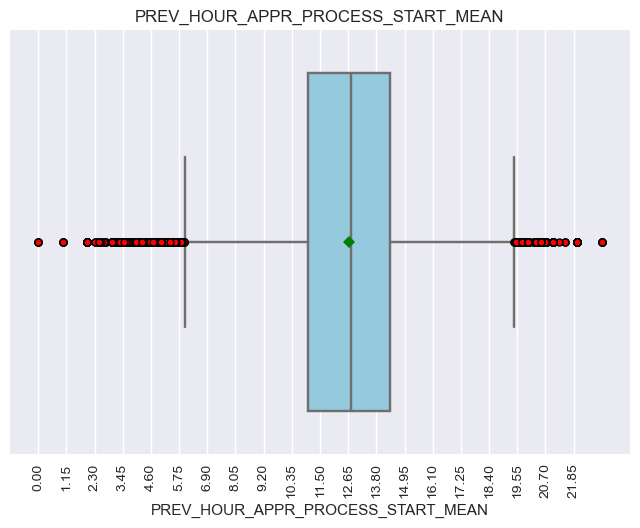

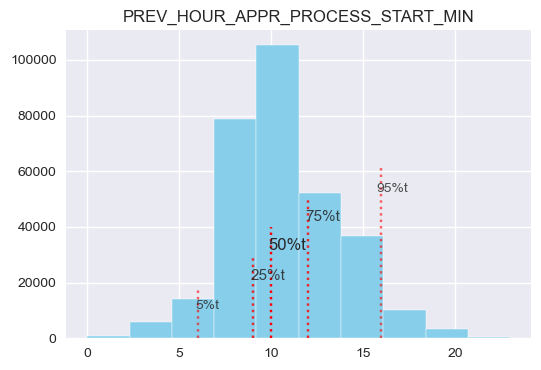

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.1
75%tile:  0.2
95%tile:  0.4


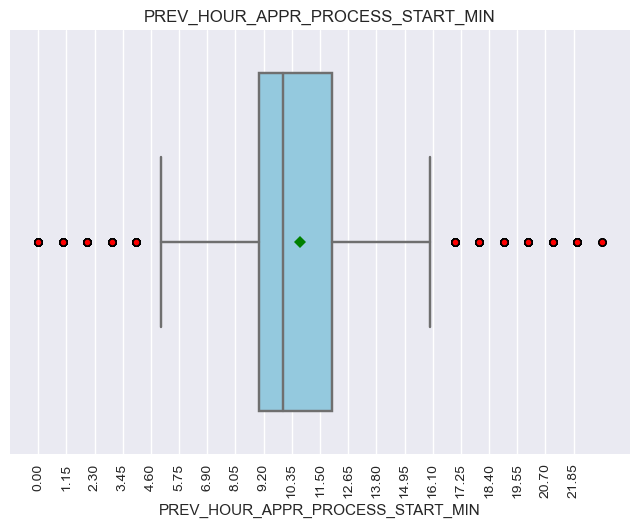

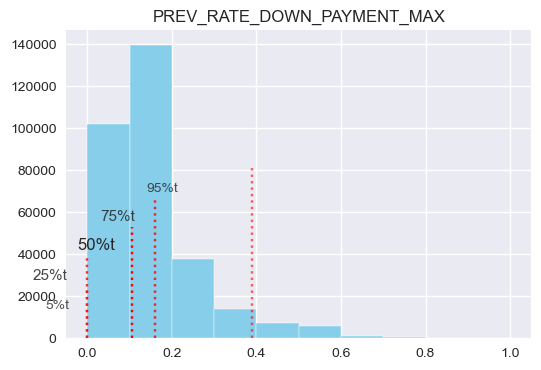

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.1
75%tile:  0.1
95%tile:  0.2


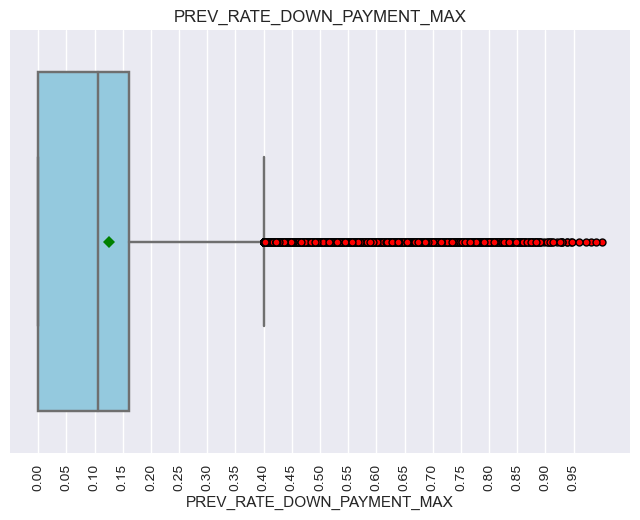

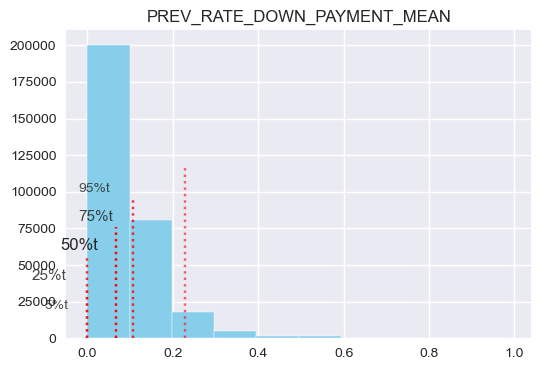

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.1
95%tile:  0.2


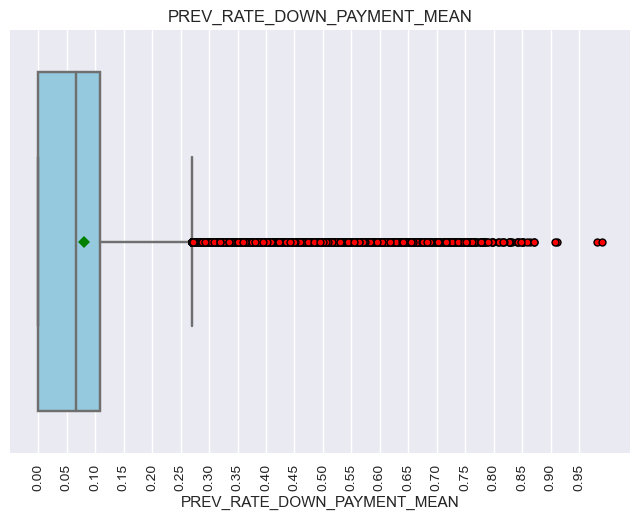

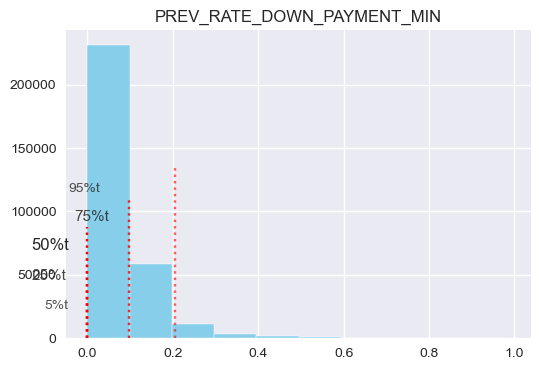

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


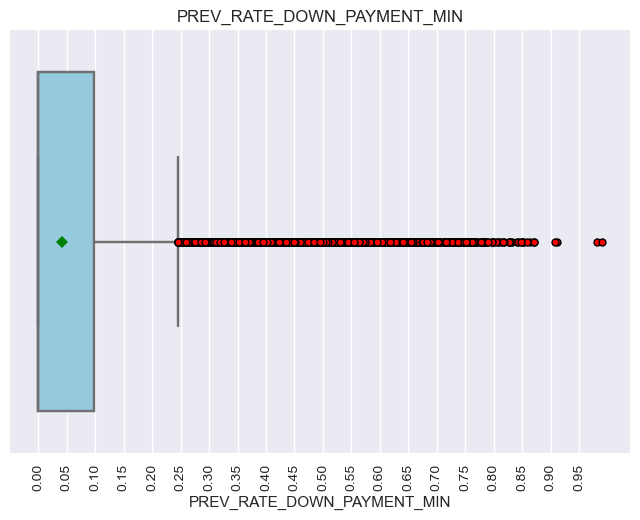

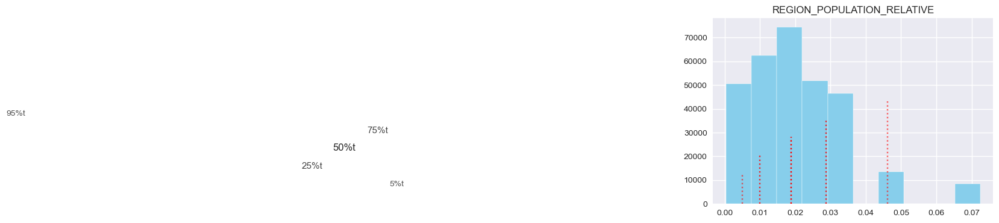

moy:      2.1
5%tile:   1.0
25%tile:  2.0
50%tile:  2.0
75%tile:  2.0
95%tile:  3.0


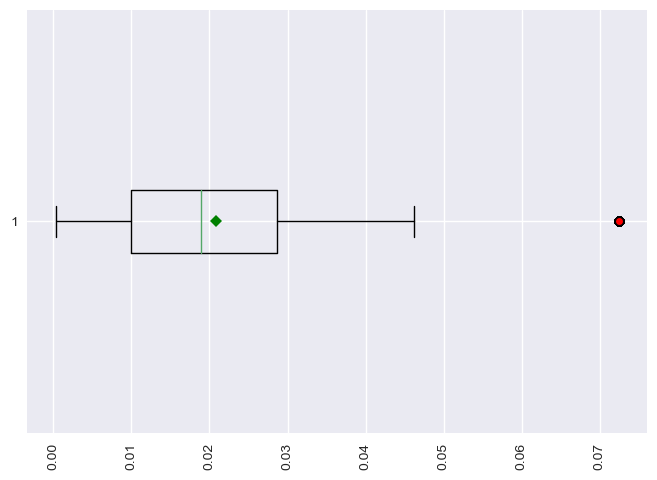

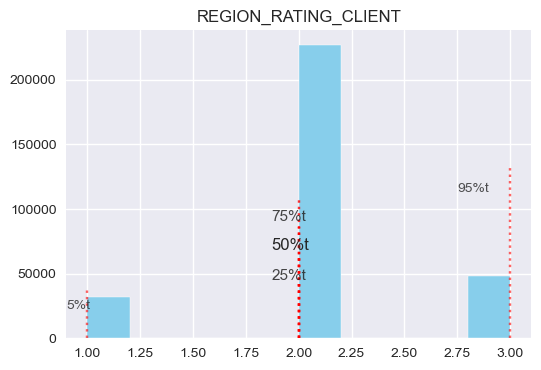

moy:      2.0
5%tile:   1.0
25%tile:  2.0
50%tile:  2.0
75%tile:  2.0
95%tile:  3.0


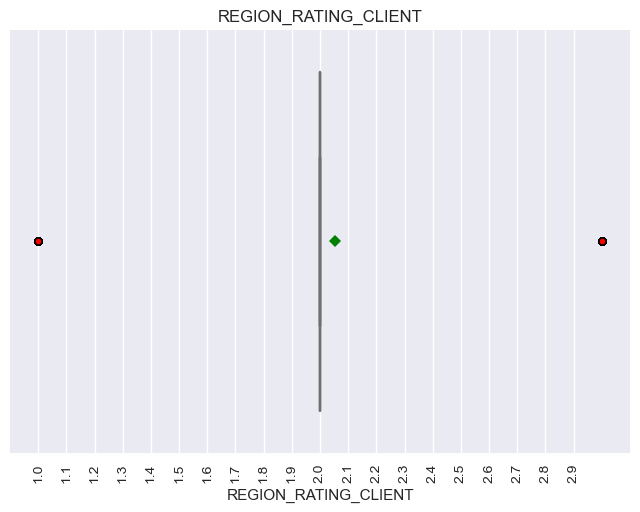

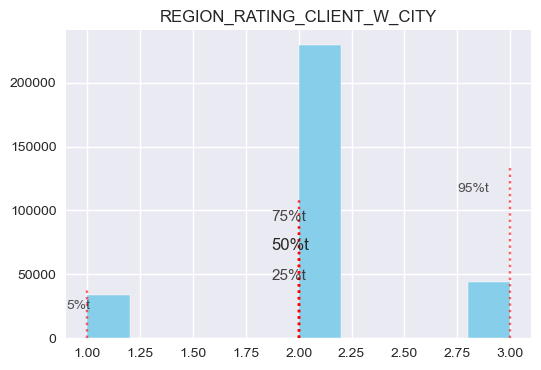

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


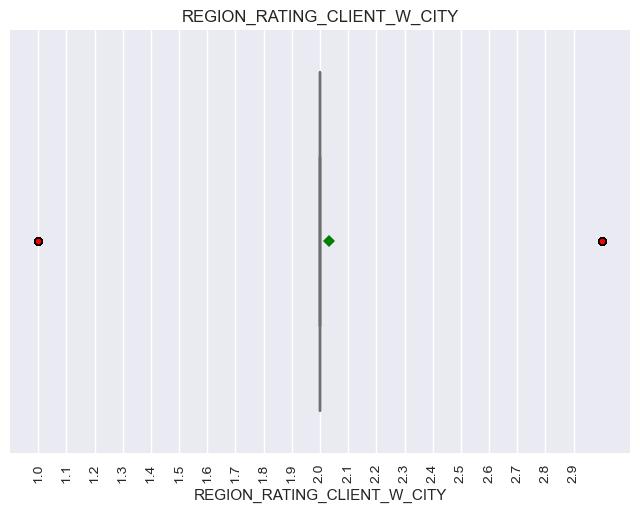

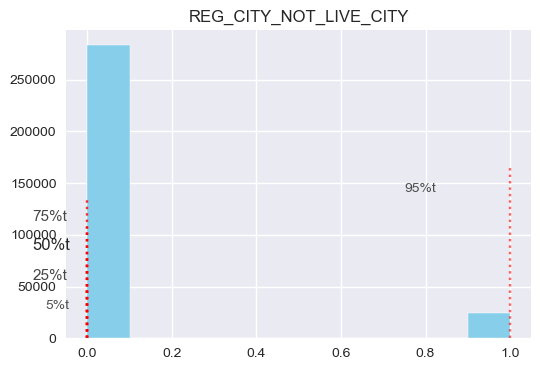

moy:      0.2
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


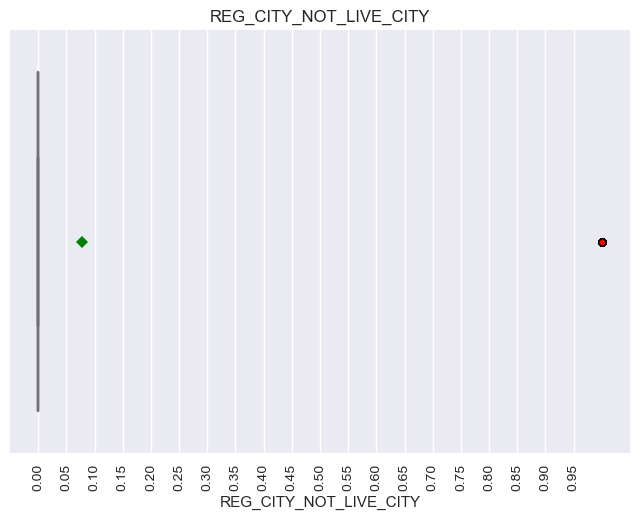

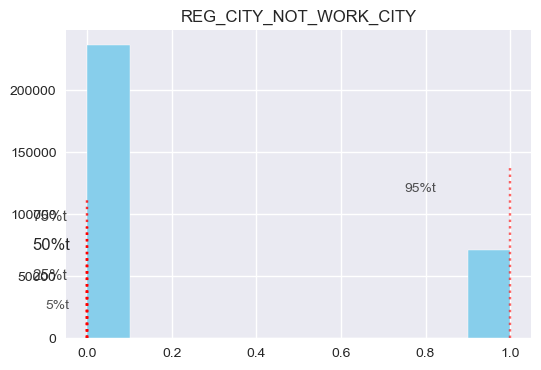

moy:      0.0
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  0.0


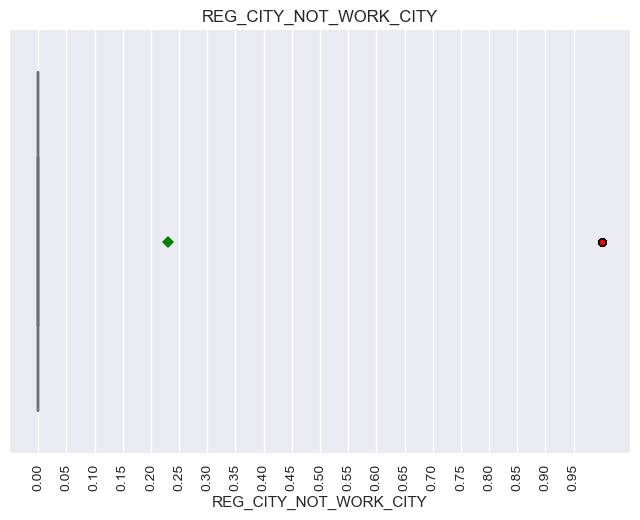

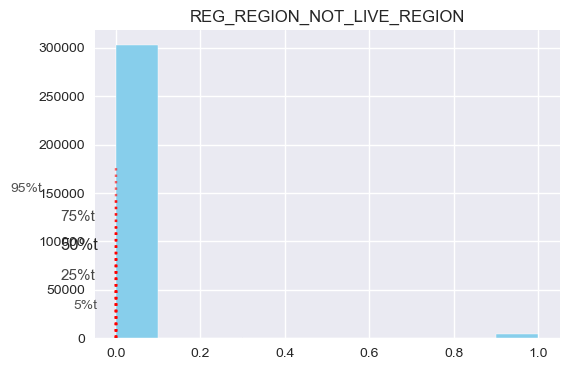

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


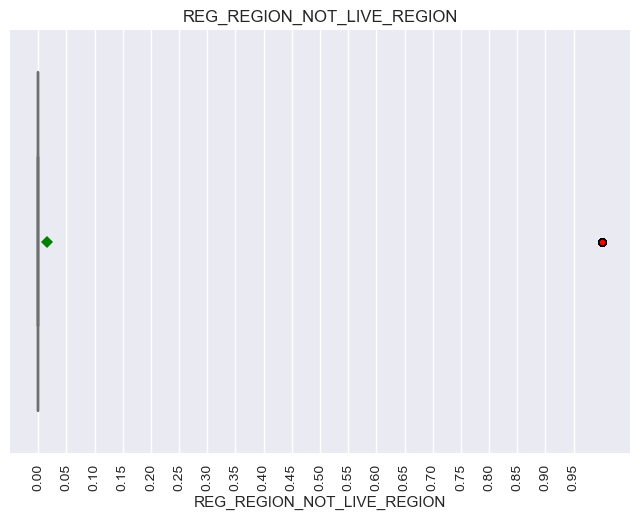

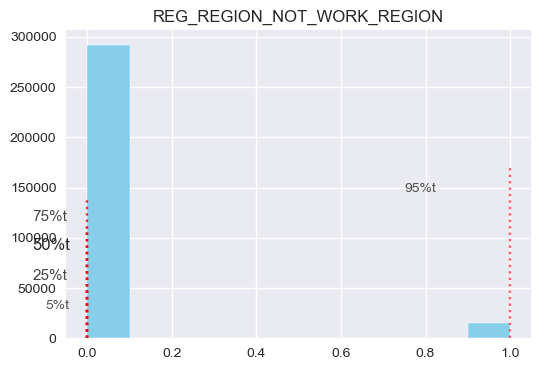

moy:      278178.1
5%tile:   117945.2
25%tile:  189140.0
50%tile:  278200.0
75%tile:  367140.0
95%tile:  438426.8


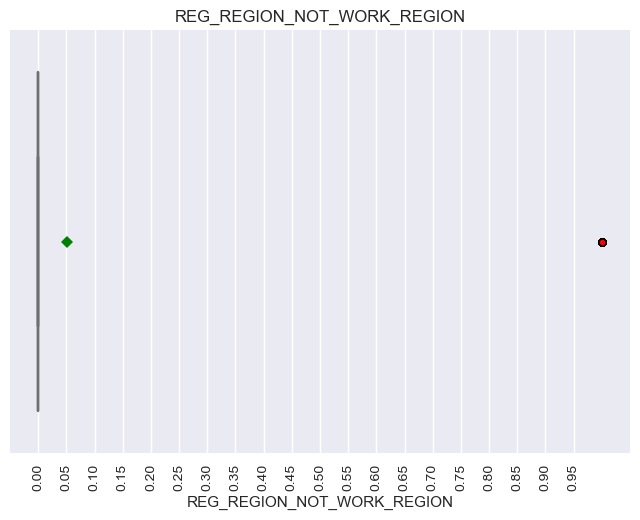

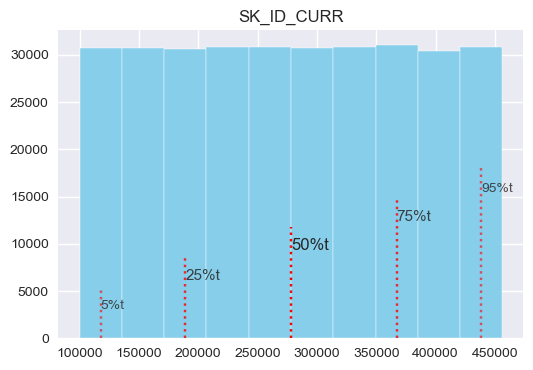

moy:      0.1
5%tile:   0.0
25%tile:  0.0
50%tile:  0.0
75%tile:  0.0
95%tile:  1.0


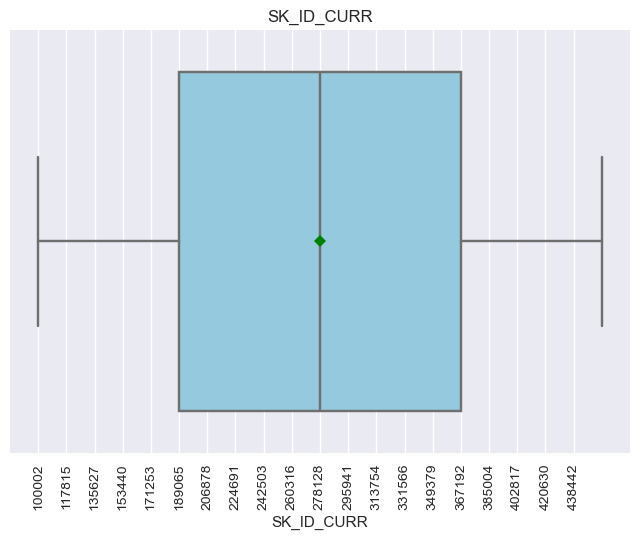

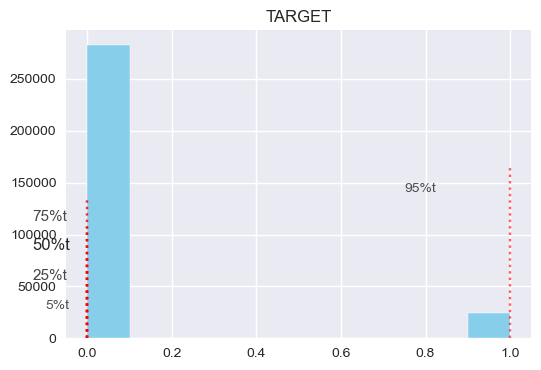

moy:      4.0
5%tile:   3.0
25%tile:  3.0
50%tile:  3.0
75%tile:  5.0
95%tile:  6.0


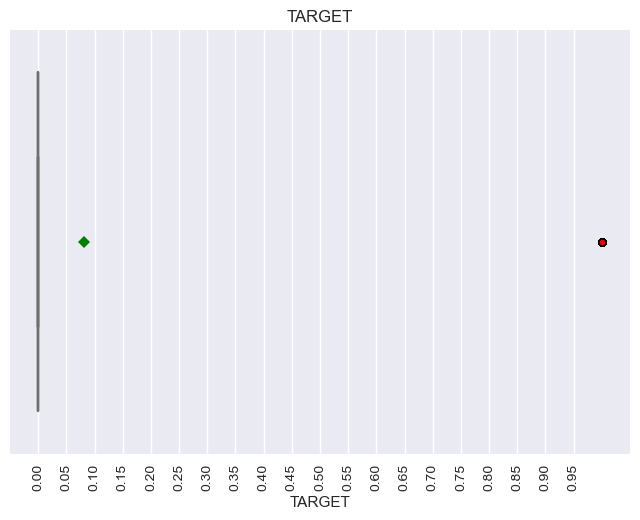

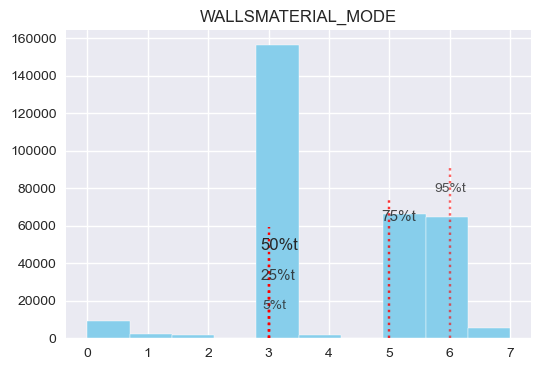

moy:      3.1
5%tile:   0.0
25%tile:  1.0
50%tile:  4.0
75%tile:  5.0
95%tile:  6.0


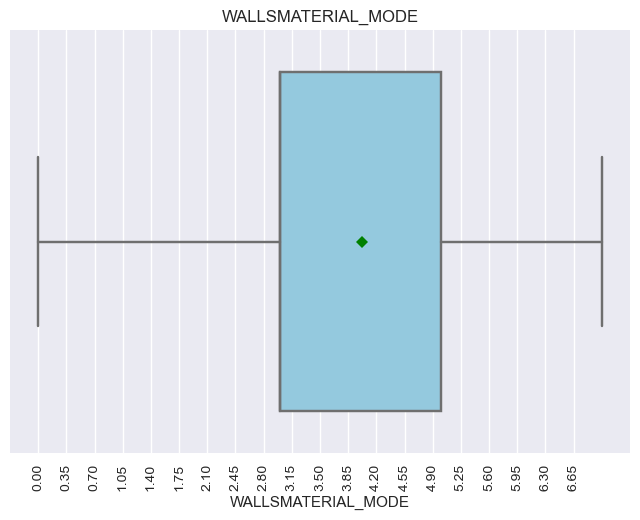

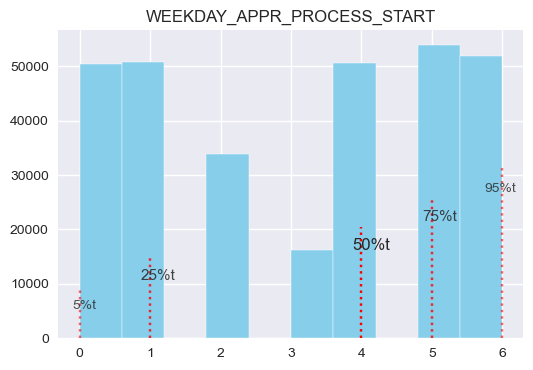

moy:      153752.9
5%tile:   15375.2
25%tile:  76873.0
50%tile:  153753.0
75%tile:  230630.0
95%tile:  292133.8


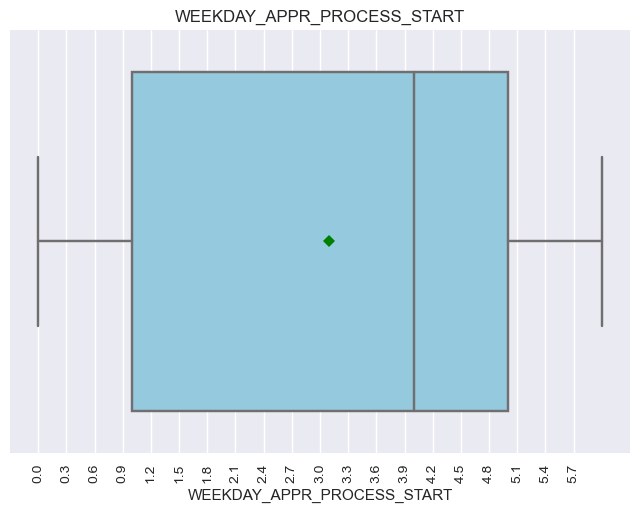

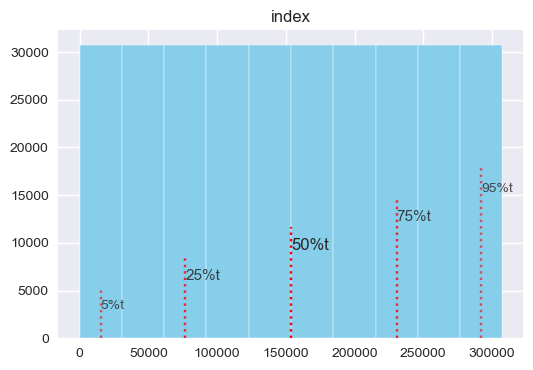

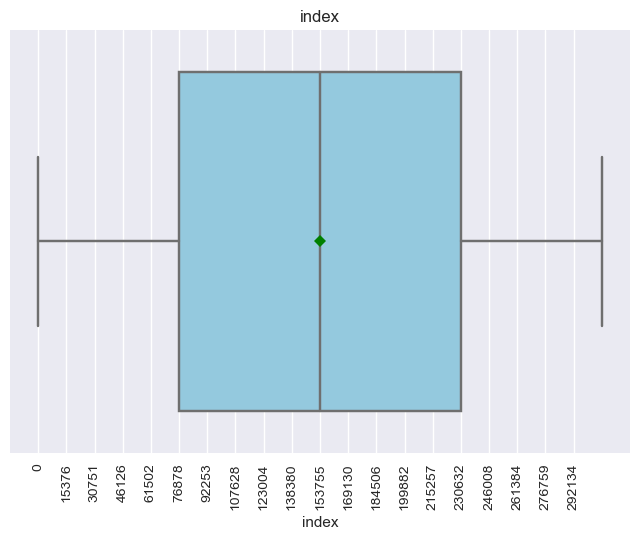

In [25]:
for col in df:
    feature_distribution(df, col)

Liste des colonnes qui contiennent des outliers d'après la visualisation des boxplots:
- PREV_NAME_PORTFOLIO_Cars_MEAN
- PREV_NAME_GOODS_CATEGORY_Insurance_MEAN
- PREV_NAME_GOODS_CATEGORY_Direct Sales_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Additional Service_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Payments on other loans_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Money for a third person_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Car repairs_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Buying a garage_MEAN
- PREV_NAME_CASH_LOAN_PURPOSE_Business development_MEAN
- PREV_CODE_REJECT_REASON_XNA_SYSTEM_MEAN
- PREV_CODE_REJECT_REASON_SYSTEM_MEAN
- PREV_CHANNEL_TYPE_Car dealer_MEAN
- PREV_AMT_GOODS_PRICE_MEAN
- PREV_AMT_GOODS_PRICE_MAX
- PREV_AMT_DOWN_PAYMENT_MAX
- PREV_AMT_APPLICATION_MEAN
- PREV_AMT_APPLICATION_MAX
- PREV_AMT_ANNUITY_MIN
- PREV_AMT_ANNUITY_MEAN
- PREV_AMT_ANNUITY_MAX
- POS_NAME_CONTRACT_STATUS_Returned to the store_MEAN
- POS_NAME_CONTRACT_STATUS_Completed_MEAN
- POS_NAME_CONTRACT_STATUS_Approved_MEAN
- POS_MONTHS_BALANCE_SIZE
- POS_COUNT
- INSTAL_PAYMENT_PERC_MEAN
- INSTAL_PAYMENT_DIFF_MAX
- INSTAL_DPD_MEAN
- INSTAL_DBD_SUM
- INSTAL_DBD_MAX
- INSTAL_DAYS_ENTRY_PAYMENT_SUM
- INSTAL_AMT_PAYMENT_SUM
- INSTAL_AMT_PAYMENT_MIN
- INSTAL_AMT_PAYMENT_MEAN
- INSTAL_AMT_INSTALMENT_SUM
- INSTAL_AMT_INSTALMENT_MEAN
- INCOME_PER_PERSON
- BURO_AMT_CREDIT_SUM_SUM
- BURO_AMT_CREDIT_SUM_MEAN
- BURO_AMT_CREDIT_SUM_MAX
- BURO_AMT_CREDIT_SUM_DEBT_SUM
- BURO_AMT_CREDIT_SUM_DEBT_MAX
- APPROVED_AMT_DOWN_PAYMENT_MIN
- APPROVED_AMT_DOWN_PAYMENT_MEAN
- APPROVED_AMT_DOWN_PAYMENT_MAX
- APPROVED_AMT_CREDIT_MIN
- APPROVED_AMT_CREDIT_MEAN
- APPROVED_AMT_CREDIT_MAX
- APPROVED_AMT_APPLICATION_MIN
- APPROVED_AMT_APPLICATION_MEAN
- APPROVED_AMT_APPLICATION_MAX
- APPROVED_AMT_ANNUITY_MIN
- APPROVED_AMT_ANNUITY_MEAN
- APPROVED_AMT_ANNUITY_MAX
- ANNUITY_INCOME_PERC
- AMT_REQ_CREDIT_BUREAU_QRT
- AMT_INCOME_TOTAL
- AMT_ANNUITY

## 2.6. Elimination des outliers après identification

In [26]:
df.drop(df.index[df['AMT_ANNUITY'] > 246000], inplace=True)

In [27]:
len(df.loc[df['AMT_REQ_CREDIT_BUREAU_QRT'] > 18])

2

In [28]:
df.drop(df.index[df['AMT_REQ_CREDIT_BUREAU_QRT'] > 18], inplace=True)

In [29]:
len(df.loc[df['ANNUITY_INCOME_PERC'] > 1.8])

1

In [30]:
df.drop(df.index[df['ANNUITY_INCOME_PERC'] > 1.8], inplace=True)

In [31]:
len(df.loc[df['APPROVED_AMT_ANNUITY_MAX'] > 3700000])

0

In [32]:
len(df.loc[df['APPROVED_AMT_ANNUITY_MEAN'] > 2700000])

0

In [33]:
len(df.loc[df['APPROVED_AMT_ANNUITY_MIN'] > 2700000])

0

In [34]:
len(df.loc[df['INCOME_PER_PERSON'] > 3.7e7])

1

In [35]:
df.drop(df.index[df['INCOME_PER_PERSON'] > 3.7e7], inplace=True)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307480 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [37]:
len(df.loc[df['AMT_INCOME_TOTAL'] > 1e8])

0

In [38]:
len(df.loc[df['APPROVED_AMT_APPLICATION_MAX'] > 5e6])

1

In [39]:
df.drop(df.index[df['APPROVED_AMT_APPLICATION_MAX'] > 5e6], inplace=True)

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307479 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [41]:
len(df.loc[df['APPROVED_AMT_APPLICATION_MEAN'] > 3.5e6])

1

In [42]:
df.drop(df.index[df['APPROVED_AMT_APPLICATION_MEAN'] > 3.5e6], inplace=True)

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307478 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [44]:
len(df.loc[df['APPROVED_AMT_APPLICATION_MIN'] > 3.5e6])

0

In [45]:
len(df.loc[df['APPROVED_AMT_CREDIT_MAX'] > 3.9e6])

1

In [46]:
df.drop(df.index[df['APPROVED_AMT_CREDIT_MAX'] > 3.9e6], inplace=True)

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307477 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [48]:
len(df.loc[df['APPROVED_AMT_CREDIT_MEAN'] > 3.8e6])

0

In [49]:
len(df.loc[df['APPROVED_AMT_CREDIT_MIN'] > 3.8e6])

0

In [50]:
len(df.loc[df['APPROVED_AMT_DOWN_PAYMENT_MAX'] > 2.9e6])

1

In [51]:
df.drop(df.index[df['APPROVED_AMT_DOWN_PAYMENT_MAX'] > 2.9e6], inplace=True)

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307476 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [53]:
len(df.loc[df['APPROVED_AMT_DOWN_PAYMENT_MEAN'] > 1.9e6])

2

In [54]:
df.drop(df.index[df['APPROVED_AMT_DOWN_PAYMENT_MEAN'] > 1.9e6], inplace=True)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307474 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [56]:
len(df.loc[df['APPROVED_AMT_DOWN_PAYMENT_MIN'] > 1.6e6])

0

In [57]:
df.drop(df.index[df['APPROVED_AMT_DOWN_PAYMENT_MIN'] > 1.6e6], inplace=True)

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307474 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [59]:
len(df.loc[df['BURO_AMT_CREDIT_SUM_DEBT_MAX'] > 1.6e8])

1

In [60]:
df.drop(df.index[df['BURO_AMT_CREDIT_SUM_DEBT_MAX'] > 1.6e8], inplace=True)

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307473 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [62]:
len(df.loc[df['BURO_AMT_CREDIT_SUM_DEBT_SUM'] > 3e8])

0

In [63]:
len(df.loc[df['BURO_AMT_CREDIT_SUM_MAX'] > 3])

306391

In [64]:
len(df.loc[df['BURO_AMT_CREDIT_SUM_MAX'] > 3e8])

1

In [65]:
df.drop(df.index[df['BURO_AMT_CREDIT_SUM_MAX'] > 3e8], inplace=True)

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307472 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [67]:
len(df.loc[df['BURO_AMT_CREDIT_SUM_MEAN'] > 1.8e8])

0

In [68]:
len(df.loc[df['BURO_AMT_CREDIT_SUM_SUM'] > 9e9])

0

The line below is dropped as it is also an outlier creating issue for SHAP values calculations :

In [69]:
df = df.drop(df[df['index'] == 54048.0].index)

# 3. Résultat Final après traitement des outliers

In [70]:
df.describe()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307471 entries, 0 to 307491
Columns: 194 entries, AMT_ANNUITY to index
dtypes: float64(138), int64(56)
memory usage: 457.4 MB


In [72]:
NaN_overview(df)

Total number of columns:  194
Number of columns with NaN:  0
AMT_ANNUITY                              0.0
AMT_CREDIT                               0.0
AMT_GOODS_PRICE                          0.0
AMT_INCOME_TOTAL                         0.0
AMT_REQ_CREDIT_BUREAU_DAY                0.0
AMT_REQ_CREDIT_BUREAU_HOUR               0.0
AMT_REQ_CREDIT_BUREAU_MON                0.0
AMT_REQ_CREDIT_BUREAU_QRT                0.0
AMT_REQ_CREDIT_BUREAU_WEEK               0.0
AMT_REQ_CREDIT_BUREAU_YEAR               0.0
ANNUITY_INCOME_PERC                      0.0
APPROVED_AMT_ANNUITY_MAX                 0.0
APPROVED_AMT_ANNUITY_MEAN                0.0
APPROVED_AMT_ANNUITY_MIN                 0.0
APPROVED_AMT_APPLICATION_MAX             0.0
APPROVED_AMT_APPLICATION_MEAN            0.0
APPROVED_AMT_APPLICATION_MIN             0.0
APPROVED_AMT_CREDIT_MAX                  0.0
APPROVED_AMT_CREDIT_MEAN                 0.0
APPROVED_AMT_CREDIT_MIN                  0.0
APPROVED_AMT_DOWN_PAYMENT_MAX          

In [73]:
df.head()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

In [74]:
df.reset_index(drop = True)

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

In [75]:
df.head()

,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,ANNUITY_INCOME_PERC,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,CNT_CHILDREN,CNT_FAM_MEMBERS,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EMERGENCYSTATE_MODE,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_CONT_MOBILE,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_2,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_EMAIL,FLAG_EMP_PHONE,FLAG_MOBIL,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_PHONE,FLAG_WORK_PHONE,FONDKAPREMONT_MODE,HOUR_APPR_PROCESS_START,HOUSETYPE_MODE,INCOME_CREDIT_PERC,INCOME_PER_PERSON,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_SUM,INSTAL_COUNT,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,LIVE_CITY_NOT_WORK_CITY,LIVE_REGION_NOT_WORK_REGION,NAME_CONTRACT_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,OCCUPATION_TYPE,ORGANIZATION_TYPE,PAYMENT_RATE,POS_COUNT,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_DAYS_DECISION_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_H

In [76]:
df.to_csv('df_valid_outliers_processed.csv', compression='gzip')